<a href="https://colab.research.google.com/github/JoDeMiro/Micado-Research/blob/main/ML_Auto_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ToDo
letölteni a pythont és ott futtatni a kódot

huzzon egy nyomot a becslésre is, hogy lássam, hogy hova a faszomba becsüli az első modell
a mit is? ja igen a középtől való eltérést.

csinálni egy második modelt illetve kettőt

az egyik legyen a régi, de hagyjuk a faszba a fel-le becslést, az egész before aftert
és csak egyszerűen kössünk rá a becslésre valamilyen szabályt. Ha nagyobb mint x akkor +3

a másik verzió amit gyorsan ki kéne próbálni, hogy a linreg helyett beteszek egy mlp-t

**ToDo:**

Megnézni, hogy normalizálom-e az adatokat a neruális háló előtt, mert lehet hogy ez viszi félre a becslést.

# Micado Auto Scale Research

Ebben a felskálázási adatok elemzésével foglalkozom.

Ez az interkatív bemutató arra van, hogy a válotzók közötti összefüggéseket jobban átlásssam, elemezzem, az esetleges anomáliákat rögtön kiszúrjam.

A playground részben a rendszer alapját adó neuráli háló beállításaival lehet játszani és megfigyelni, hogy milyen hatással van a rendszer teljesítményére.

<a name="tartalom"></a>

## Tartalom

Bevezetés

> [Empty](#empty)<br>
> [Play Ground](#play_ground)<br>
> [SandBox](#sandbox)<br>
> [Before After](#beforeafter)<br>
> [Szintetikus adatok generálása](#szintetikus_adatok)<br>
> [Irodalom](#irodalom)<br>
> [ToDo](#todo)<br>


## Bevezető gondolat

Összességében az egésszel kapcsolatban van egy hatalmas kérdőjel.

Tulajdonképpen két paradigma van.

Az egyik - nem az enyém - így néz ki:

Egyszerűen becsüjük meg azt, hogy az adott szenzoros adatok alapján mi legyen a döntés kimenetele (fel, le, semmi). Akkor hoztunk jó döntést, ha valamilyen metrika alapján valamilyen költséget minimalizáltunk, vagy maximalizáltunk. Például, ha egy döntéssel sikerült közelebb kerülni a záróvonalhoz, vagyis az út közepére. Vagy az az autó a lehető legmeszebb jutott el anélkül, hogy érintette volna a falat és lehetőleg a leggyorsabban is.

A másik - amin én dolgozom - viszont egy plusz lépéssel egészül ki és ettől sokkal bonyolultabb. Hogy van-e létjogosultsága az ennek a kisérletnek a lényege.

Vannak szenzoros adataink, ami alapján hozunk egy döntést. Eddig olyan mint a máisik, de az érdemi különbség a módszerben és a tanulás folyamatában van.

A szenzoros adatokból megbecsüljük azt, hogy mennyire vagyunk jók és nem azt becsüljük, hogy mit kéne tenni!

Ha nem vagyunk jók akkor egy második modell segítségével csinálunk valamilyen lépést, amitől azt várjuk, hogy jók leszünk.

És itt jogosan merül fel a kérdés, hogy de miért nem az első módszert alkalmazzuk és erre most még én sem tudom a választ pontosan megadni. De röviden erről szól ez a kutatás.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from sklearn.linear_model import LinearRegression

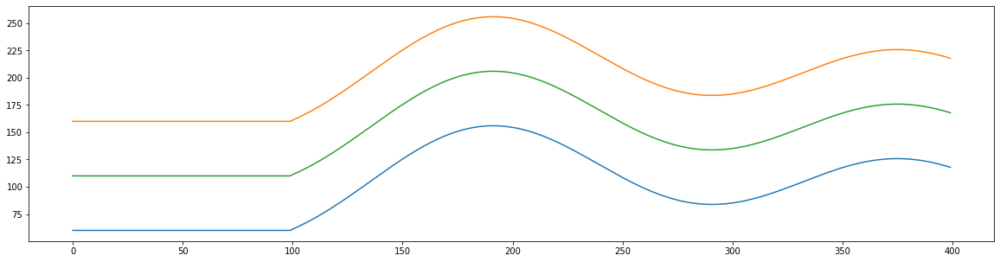

In [2]:
distance    = np.arange(0, 400, 1)
road        = 100
wall_left   = 30*(np.sin(distance/180)) + distance * 0.3 + 30 * np.cos(distance/30) + 50 * np.sin(distance/90)
wall_left[0:100] = 60
wall_right  = wall_left + road
wall_center = ( wall_left + wall_right ) / 2


plt.figure(figsize=(20,5)); plt.plot(wall_left); plt.plot(wall_right); plt.plot(wall_center); plt.show()

In [3]:
class Road():
  def __init__(self, wide):
    self.distance    = np.arange(0, 400, 1)
    self.wide        = wide
    self.wall_right  = 30*(np.sin(self.distance/180)) + self.distance * 0.3 + 30 * np.cos(self.distance/30) + 50 * np.sin(self.distance/90)
    self.wall_right[0:100] = 60
    self.wall_left   = self.wall_right + self.wide
    self.wall_center = ( self.wall_left + self.wall_right ) / 2

  def show(self):
    fig, ax = plt.subplots(figsize=(26,10)); ax.set_ylim(40, 300); ax.plot(self.wall_left); ax.plot(self.wall_right); ax.plot(self.wall_center);
    return fig, ax


In [4]:
class Car():
  def __init__(self, road):
    self.road = road
    self.x = 0
    self.y = self.road.wall_center[0]
    self.sight = 54           # ennyit lát előre 300
    self.sight_center = 300

    self.y_history  = []
    self.x_history  = []
    self.y_center   = []; self.y_center = self.road.wall_center
    self.y_distance = []
    self.y_distance_real = []
    self.y_distance_predicted = []
    self.regression = LinearRegression()
    self.sensor_center = []
    self.sensor_left   = []
    self.sensor_right  = []
    self.before  = []
    self.after   = []

    self.mesterseges_coutner = 0


  def calculate_distances(self):
    # ha bármikor kevesebb a faltól mért távolsága bármelyik szenzoron akkor a szenzorokon mért távolság is ennyi lesz
    
    k = self.x; d = 0
    while(k < self.x + self.sight_center):
      k += 1; d += 1
      self.distance_center_from_wall = d
      if(int(self.road.wall_left[k]) < self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break
      if(int(self.road.wall_right[k]) > self.y):
        print('Sensor center = ', self.distance_center_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1;  d += 1
      self.distance_left_from_wall = d
      if(int(self.road.wall_left[k]) < self.y + d):
        print('Sensor from left wall = ', self.distance_left_from_wall)
        break

    k = self.x; d = 0
    while(k < self.x + self.sight):
      k += 1; d += 1
      self.distance_right_from_wall = d
      if(int(self.road.wall_right[k]) > self.y - d):
        print('Sensor from right wall = ', self.distance_right_from_wall)
        break

    #ki kell kalkulálni a tényleges távolságot a ball és a jobb faltól
    # mert ezekre fogom tanítani a neurális hálót, ahol ezeket becsüljük
    # és a bemeneti változó a 3 szenzorból érkező adat lesz.
    # valójában azt mérjük, hogy milyen távolságra van az út közepétől

    self.distance_from_top     = abs(self.road.wall_left[self.x] - self.y)
    self.distance_from_bottom  = abs(self.road.wall_right[self.x] - self.y)
    print('most távolsagra van a felső faltól = ', self.distance_from_top)
    print('most távolsagra van az alsó faltól = ', self.distance_from_bottom)


    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')
    print('self.x                       = ', self.x)
    print('cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc')

    # mi lenne, ha mégis inkább a kettő hányadosát becsülném (1 ha egyenlő távolságra van)
    # self.vertical_distance_from_middle = self.road.wall_center[self.x] - self.y
    # self.vertical_distance_from_middle = self.distance_from_top / self.distance_from_bottom

    self.vertical_distance_from_middle = self.y - self.road.wall_center[self.x]

    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')
    print('self.vertical_distance_from_middle = ', self.vertical_distance_from_middle)
    print('KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK')




    print('ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa = ', self.vertical_distance_from_middle)


    # de elötte szeretnék még valamit leellenőrizni
    # ezeknek a hossza nem fog megeggyezni a tényleges futások számával, hanem több lesz (milyen jó lett volna erre egy teszt esetet írni és akkor test driven development lenne)

    print('\t\t\t ---------------- Teszt ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Teszt End --------------')


  def append(self):
    self.y_distance.append(self.vertical_distance_from_middle)

    self.sensor_left.append(self.distance_left_from_wall)
    self.sensor_center.append(self.distance_center_from_wall)
    self.sensor_right.append(self.distance_right_from_wall)

    print('\t\t\t ---------------- Append ----------------')
    print('\t\t\t len(self.y_distance)    = ', len(self.y_distance))
    print('\t\t\t len(self.sensor_left)   = ', len(self.sensor_left))
    print('\t\t\t len(self.sensor_center) = ', len(self.sensor_center))
    print('\t\t\t len(self.sensor_right)  = ', len(self.sensor_right))
    print('\t\t\t self.x                  = ', self.x)
    print('\t\t\t -------------- Append End --------------')


  def run(self):
    for i in range(0, 400, 1):
      print('# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------')
      _summary_mlp_prediction_was_taken = 0
      _summary_mlp_fit_was_taken = 0
      _summary_mesterseges_mozgatas = 0
      _summary_action_was_taken = 0

      self.x = i
      self.calculate_distances()
      # !!!
      self.append()
      # !!!
      if( i % 1 == 0):
        self.plot()

      if( i >= 0 ):

        if( i % 3 == 0 and i >= 12 ):

          print('------------------------------ IF i % 3 == 0 ------------------------------')
          print('# i = ', i)
          print('# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)')
          X = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          y = np.array([self.y_distance]).T
          print('X.shape = ', X.shape)
          print('y.shape = ', y.shape)
          # print('X       = ', X)
          # print('y       = ', y)
          print('i       = ', i)
          self.regression.fit(X, y)
          _summary_mlp_fit_was_taken = 1

        if( i % 3 == 1 and i >= 22 ):

          print('------------------------------ IF i % 3 == 1 ------------------------------')
          print('# i = ', i)
          print('# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja')
          X_test = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X_test = np.array([X_test[-1,:].reshape(-1,1)])
          _X_test = np.array([X_test[-1,:]])
          print('actual _X_test = ', _X_test)
          predicted_test = self.regression.predict(_X_test)
          _summary_mlp_prediction_was_taken = 1
#most
          self.y_distance_real.append(self.y_distance[-1])
          self.y_distance_predicted.append(predicted_test)
          print('actual predicted = ', predicted_test)
          # print('actual predicted = {:.5f}'.format(predicted_test[0,0]))
          print('actual self.y_distance[-1] = ', self.y_distance[-1])
          print('actual self.y_distance     = ', self.y_distance)
          print('len(self.y_distance_real)      = ', len(self.y_distance_real))
          print('len(self.y_distance_predicted) = ', len(self.y_distance_predicted))

          # olyan szar a becslés, hogy az hihetetlen
          plt.figure(figsize=(12, 5)); plt.scatter(self.y_distance_real, self.y_distance_predicted); plt.show()

          # korábban csak azokat az adatokat plottoltam amik a tanulás után lettek visszamérve,
          # de nézzük meg a teljes adatsoron
          X_test_full = np.array([self.sensor_left, self.sensor_center, self.sensor_right]).T
          _X_test_full = X_test_full
          predicted_test_full = self.regression.predict(_X_test_full)
          _y_test_full = np.array([self.y_distance]).T
          print(_y_test_full.shape)
          print(predicted_test_full.shape)
          plt.figure(figsize=(12, 5)); plt.scatter(_y_test_full, predicted_test_full, c='r'); plt.show()

          plt.figure(figsize=(12, 5)); ax = plt.axes(); ax.scatter(_y_test_full, predicted_test_full, c='r')
          ax.plot([-10, 2, 4, 10], [-10, 2, 4, 10]); plt.show()


        # most jön az, hogy véletlenszerűen kell egyet ugrania fel, vagy le
        # ez felel meg a before after dologonak
        # az így létrejött adatokat is el kell tárolni úgy mint
        # mi volt a szezoros adat before
        # mi lett a szenzoros adat after
        # mi volt az y before, mi lett az y after
        # mivel mindíg egyet fogunk csak lépni, ezért a dif mindíg egy lesz
        # de ezt számítani kell, mivel a későbbiek folyamán lehet, hogy többet is fog lépni

        if( i % 3 == 2 ):

          print('------------------------------ IF i % 3 == 2 ------------------------------')
          print('# i = ', i)
          print('# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok')

          _summary_mesterseges_mozgatas = 1
          
          if( self.mesterseges_coutner == 0 ):                           # Első lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 1
          elif( self.mesterseges_coutner == 1 ):                           # Minden második lépésben le (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down first')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 2
          elif( self.mesterseges_coutner == 2 ):                           # Minden második lépésben le (valójában minden 6-ik lépésben)
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y - 1
            print('artificial move -> down second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 3
          if( self.mesterseges_coutner == 3 ):                           # Első lépésben fel
            self.before.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.y = self.y + 1
            print('artificial move -> up second')
            self.calculate_distances()
            self.after.append(np.array([self.y, self.distance_left_from_wall, self.distance_center_from_wall, self.distance_right_from_wall]))
            self.mesterseges_coutner = 0
          else:
            print('semmi\n\n\n\n')

          print('self.y = ', self.y)



# itt van egy érdekesség amit csak magamnak írok fel
# ezen a ponton lépünk ki a három if ágból - if( i % 3 == _ )

# ez azért fontos, mert ami itt következik az mindíg lefut
# akár volt neurális háló tanítás
# akár volt neurális háló predikció visszamérése
# akár volt mesterséges mozgatás


# felmerül a kérdés de csak felmerül, hogy nem lehet-e az, hogy ezt csak akkor kéne elvégezni amikor nincs neurális háló tanítás és nincs mesterséges mozgatás sem
# ezt csak egy kísérlet ereéig ki kéne próbálni (if i % 3 == 1) -> vagyis amikor az nn predikció mérése történik

        action = 0
        if( i % 3 == 0 ):

          if( len(self.before) > 9 ):           # ha már van néhány before after adatunk, akkor

            print('------------------------------ IF len(self.before) > 9 ------------------------------')
            print('\n')
            print('# i = ', i)
            print('  Ha már van elég before after adatunk')
            print('# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára')
            # minden egyes szezor adatára el kell készítenünk azt a lineráis regressziós modelt ami megmondja, hogy mi lenne a szenzor értéke, ha 1, 2, 3, ... n lépéssel elvinnénk a kocsit

            # oké megvan a before és megvan az after (self.y, left, center, right)
            before_array = np.array(self.before)
            after_array  = np.array(self.after)
            y_delta = after_array[:,0] - before_array[:,0]
            delta_array = after_array - before_array
            print('--------------------------------------')
            print(y_delta)
            print(before_array.shape)
            print(after_array.shape)
            print(self.before)
            print(self.after)
            print(delta_array)
            print('--------------------------------------')

            # képlet szerint senzor' = w0 + w1 * senzor + w2 * delta_y
            # valójában ez a képlet nem jó és nem így kéne számolni, mert ez figyelembe veszi a szenzor aktuális értékét is, de most így hagyom
            # ------- fenti sort nem tudom miért írtam, hogy baj az ha figyelembe veszük az aktuális értéket is, hm.

            print('# Linear Regression Learning --------------------------------------------------------------------------------------')
            print('\t\t # Linear Regression Training Results -------------------------------------------------------------------------')

            _X_left = np.array([before_array[:,1], delta_array[:,0]]).T # left és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_left = delta_array[:,1].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_left = after = after_array[:,1].reshape(-1, 1)
            regression_left = LinearRegression()
            regression_left.fit(_X_left, _y_left)
            print('\t\t _X_left = \n', _X_left)
            print('\t\t _y_left = \n', _y_left)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_left.coef_ = ', regression_left.coef_)
            _predicted_left = regression_left.predict(_X_left)
            plt.scatter(_y_left, _predicted_left)
            plt.show()

            _X_center = np.array([before_array[:,2], delta_array[:,0]]).T # center és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_center = delta_array[:,2].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_center = after_array[:,2].reshape(-1, 1)
            regression_center = LinearRegression()
            regression_center.fit(_X_center, _y_center)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_center.coef_ = ', regression_center.coef_)
            _predicted_center = regression_center.predict(_X_center)
            plt.scatter(_y_center, _predicted_center)
            plt.show()

            _X_right = np.array([before_array[:,3], delta_array[:,0]]).T # right és delta_y
  # ez itt teljesen hibás volt. nem a deltat kellet volna becsülnöm
            _y_right = delta_array[:,3].reshape(-1, 1)
  # itt ki lett javítva. nem a deltat kellett volna becsülnöm hanem az aftert     - a fenti sort azért hagytam benne, hogy lássam a hibát
            _y_right = after_array[:,3].reshape(-1, 1)
            regression_right = LinearRegression()
            regression_right.fit(_X_right, _y_right)
            print('\t\t ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------')
            print('\t\t regression_right.coef_ = ', regression_right.coef_)
            _predicted_right = regression_right.predict(_X_right)
            plt.scatter(_y_right, _predicted_right)
            plt.show()

            # most ki kell számolni, hogy mennyi lenne a szenzorok értéke, ha fel le lépkednénk

            # mondjuk maximalizáljuk a fel le lépkedés mértékét 5-ben

            move = np.array([-5, -4, -3, -2, -1, 0, 1, 2, 3, 4, 5])

            move = np.array([-2, -1, 0, 1, 2])

            move = np.array([-3, -2, -1, 0, 1, 2, 3])

  # most


            print('\t # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------')

            print('\t\t # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke')
            proba_X_metrika   = np.array([1,1]).reshape(1, -1)
            print('proba_X_metrika   = ', proba_X_metrika)
            predicted_proba_left = regression_left.predict(proba_X_metrika)
            predicted_proba_center = regression_center.predict(proba_X_metrika)
            predicted_proba_right = regression_right.predict(proba_X_metrika)
            print('-------- 1 y up ->  left   = ', predicted_proba_left)
            print('-------- 1 y up ->  center = ', predicted_proba_center)
            print('-------- 1 y up ->  right  = ', predicted_proba_right)
            print('\n')
            
            action = 0; tmp = 999999990

            for j in move:
              print('\n')
              print('\t\t minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba')
              print('\t\t j = ', j)
              # ide be kell helyettesítenem az éppen aktuális értéket, olyan mintha egy új X változót csinálnék amiben csak egy sor van és arra kérnék egy becslést a korábbi modell alapján
              # a bement az éppen aktuális szenzoros érték és az új lépés

              # na majd ezt a bemenetet kell ellenőrizni, hogy stimmel-e a tanítás során használt bemenettel
              _X_left   = np.array([[self.distance_left_from_wall, j]])
              _X_center = np.array([[self.distance_center_from_wall, j]])
              _X_right  = np.array([[self.distance_right_from_wall, j]])

              print('\t\t ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------')
              print('\t\t _X_left   = ', _X_left)
              print('\t\t _X_center = ', _X_center)
              print('\t\t _X_right  = ', _X_right)

              # a fenti értékek valószínűleg jók, de mindíg minden lépésnél ellenőrizni kell

              predicted_left   = regression_left.predict(_X_left)
              predicted_center = regression_center.predict(_X_center)
              predicted_right  = regression_right.predict(_X_right)

              print('\t\t predicted_left   = ', predicted_left)
              print('\t\t predicted_center = ', predicted_center)
              print('\t\t predicted_right  = ', predicted_right)

              print('\t\t --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------')
              print('\t\t regression_left.coef_   = ', regression_left.coef_)
              print('\t\t regression_center.coef_ = ', regression_center.coef_)
              print('\t\t regression_right.coef_  = ', regression_right.coef_)
              print('\t\t regression_left.intercept_   = ', regression_left.intercept_)
              print('\t\t regression_center.intercept_ = ', regression_center.intercept_)
              print('\t\t regression_right.intercept_  = ', regression_right.intercept_)

              # nekünk majd azt az értéket kell választanunk amelyik segítségével a legközelebb jutunk a 1 értékhez

              _X = np.array([predicted_left.ravel(), predicted_center.ravel(), predicted_right.ravel()]).T    # figyelni kell rá, hogy eredetileg is ez volt-e a változók sorrendje

              print('\t\t # Ez lesz a bemenete a neurális hálónak')
              print('\t\t -------------------------X-------------------------')
              print('\t\t ', _X)
              print('\t\t ---------------Brutálisan hülye dolgot jelez előre ezért ellenőrizni kell, hogy mi a gond. Esetleg a bemeneti adatok?-----------------')

              predicted_position = self.regression.predict(_X)

              print('\t\t predicted_position = ', predicted_position)
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')

              # legyünk bátrak és módosítsuk az autó self.y pozicióját

              # azzal az értékkel amely abszolút értékben a legkissebb, helyett
              # mivel a célváltozónk akkor jó ha 1. mivel a felső/alsótól mért távolság hányadosa
              # ezért itt azt az értéket kell kiválasztani ami a legközelebb van +1-hez (és nem azt amelyik 0-hoz)

              # természetesen ezen változtatni kell ha ismét az középvonaltól való eltérés mértékét akarjuk becsülni
              # de ahhoz fenti is át kell állítani az adatokat

              if( abs(1 - predicted_position) < tmp):       # rossz - javítva - tesztelés alatt
                action = j
                tmp = abs(1 - predicted_position)
                print('\t\t ---------------------')
                print('\t\t  action = ', action)
                print('\t\t  predicted_position = ', predicted_position)
                print('\t\t  distance from 1 (tmp)= ', tmp)
                print('\t\t ---------------------')

              print('\t\t adott j-re {0} kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------'.format(j))
              print('\t\t --------------------------------------------------------------------------------------------------------------------------------------')
            
            print('\t minden j-re kiszámoltuk az előrejelzést de még nem hoztunk döntést -------------------------------------------------\n')

# igazság szerint ez a kör ahogy mondtam minden lépésben lefut ha már van elég before after adatunk


# a döntés azonban csak akkor fut le ha az alábbi feltétel teljesül

          if( i % 3 == 0 ):                                                       # ugyan ez a feltétel amikor tanítom az út közepének a becslésére
            print('------------------------------ IF i % 3 == 0 ------------------------------')
            _summary_action_was_taken = 1
            print('=================== TAKE ACTION ===================')
            print('-------- ennyivel módosítom self.y értékét --------')
            print('self.y régi értéke = ', self.y)
            self.y = self.y + action
            print('self.y új értéke   = ', self.y)
            print('action             = ', action)
            print('----------------- módosítás vége -----------------')

          # újra kell gondolni az egészet, ugyanis akkor is ki kell számolni a before after értéket amikor modosítom a pozicióját,
          # vagyis végig kell gondolni ezt az egészet.
          # az első elképzelésem az volt, hogy a poziciót csak bizonyos esetben modosíthatom, csak akkor amikor nincs tanítás, és nincs szimulált emelés, vagy csökkentés sem
          # utóbbit az if( i % 3 == 2) feltétellel szűrtem


      # adjuk hozzá az értéket a self.y_history-hoz
      print('# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------')
      print('#   itt adom hozzás a self.y a self.y_history-hoz')
      self.y_history.append(self.y)
      print('#    self.y :')
      print(self.y)
      print('#   self.y_history after append :')
      print(self.y_history)
      print('# \t\t ----------------- Summary -----------------')
      print('# \t\t\t _summary_mlp_fit_was_taken         = ', _summary_mlp_fit_was_taken)
      print('# \t\t\t _summary_mlp_prediction_was_taken  = ', _summary_mlp_prediction_was_taken)
      print('# \t\t\t _summary_mesterseges_mozgatas      = ', _summary_mesterseges_mozgatas)
      print('# \t\t\t _summary_action_were_taken         = ', _summary_action_was_taken)
      print('# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++')
          



  def plot(self):
    fig, ax = self.road.show()
    circle = plt.Circle((self.x, self.y), 5, color='black')
    ax.add_patch(circle)
    ax.plot(range(int(self.x), int(self.x+self.distance_center_from_wall)), np.repeat(self.y, self.distance_center_from_wall))
    ax.plot(range(int(self.x), int(self.x+self.distance_left_from_wall)), range(int(self.y), int(self.y+self.distance_left_from_wall)))
    ax.plot(range(int(self.x), int(self.x+self.distance_right_from_wall)), range(int(self.y), int(self.y-self.distance_right_from_wall), -1))
    if( len(self.y_history) > 0 ):
      ax.plot(self.y_history)
    plt.show()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


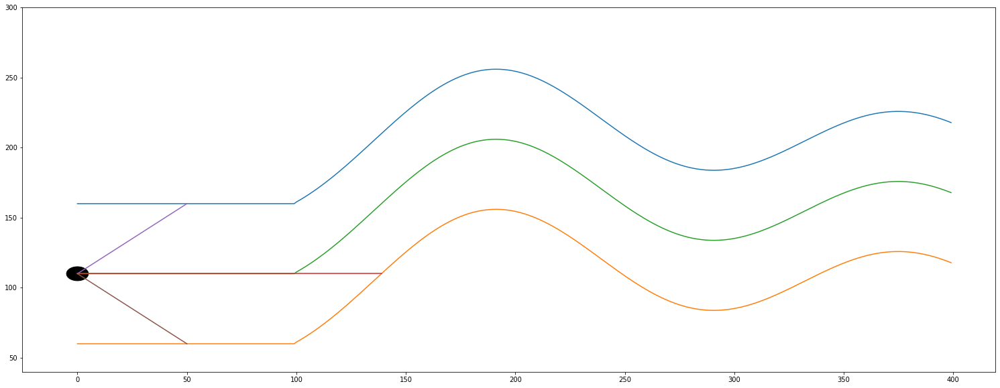

In [5]:
road = Road(wide = 100)
auto = Car(road)

auto.calculate_distances()
auto.plot()

In [6]:
auto.calculate_distances()

Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------


# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  140
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  0
			 len(self.sensor_left)   =  0
			 len(self.sensor_center) =  0
			 len(self.sensor_right)  =  0
			 self.x                  =  0
			 -------------- Teszt End --------------
			 ---------------- 

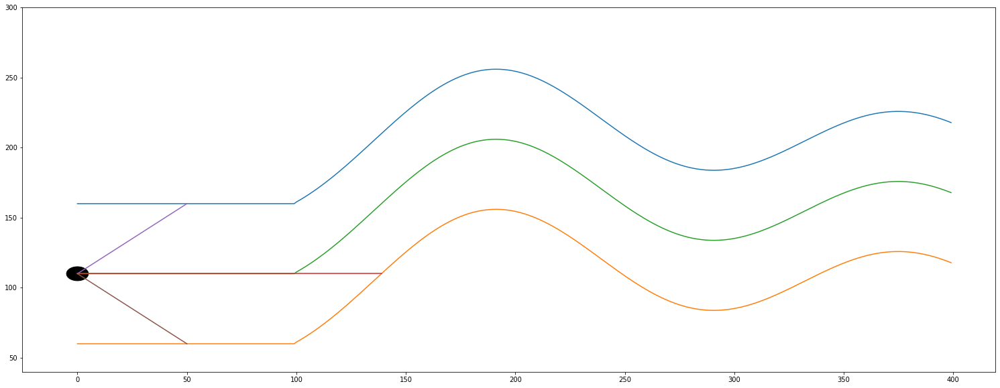

------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----

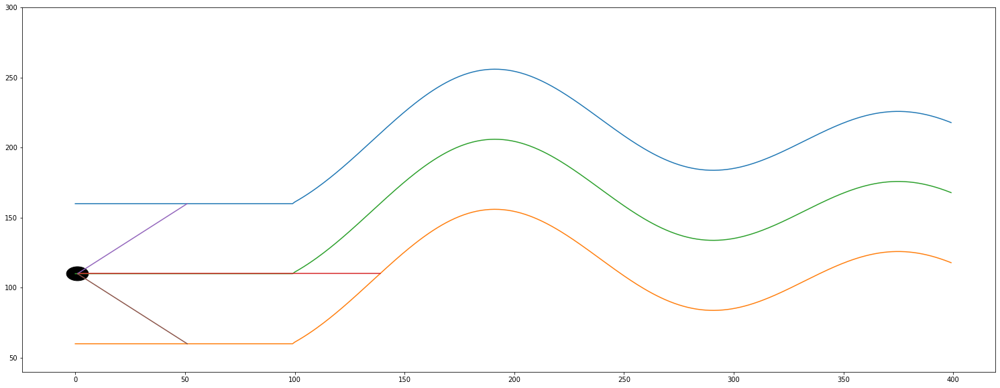

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  138
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
ccccccc

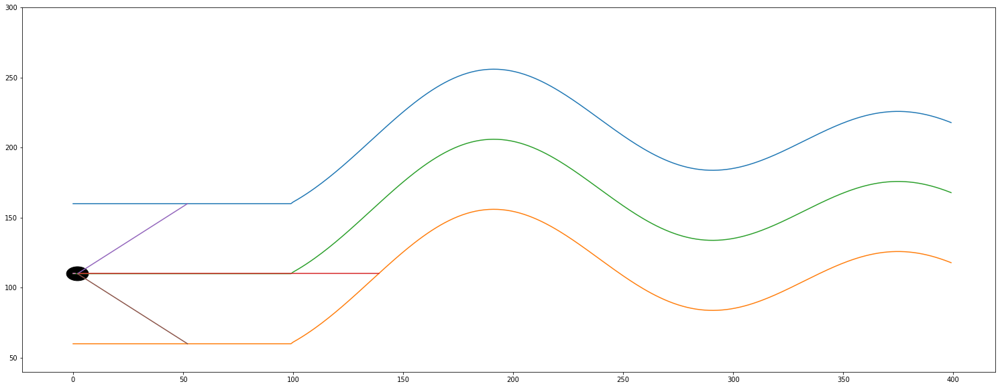

------------------------------ IF i % 3 == 2 ------------------------------
# i =  2
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  139
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  2
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  3
			 len(self.sensor_left)   =  3
			 len(self.sensor_center) =  3
			 len(self.sensor_right)  =  3
			 self.x                  =  2
			 -------------

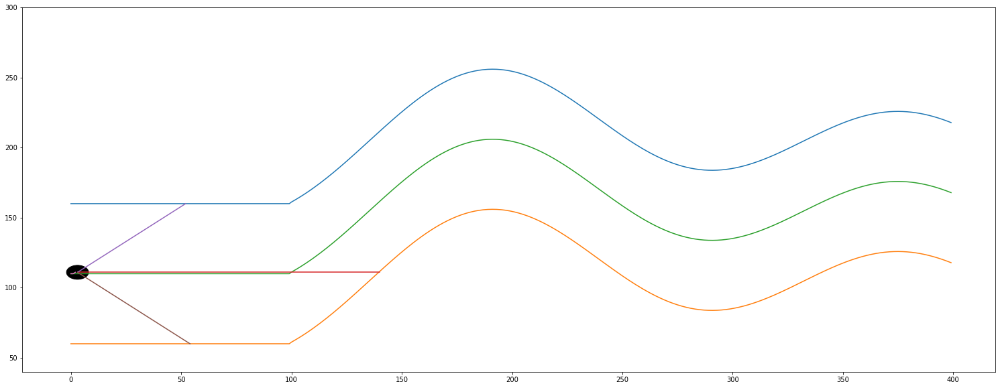

------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  111.0
self.y új értéke   =  111.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A r

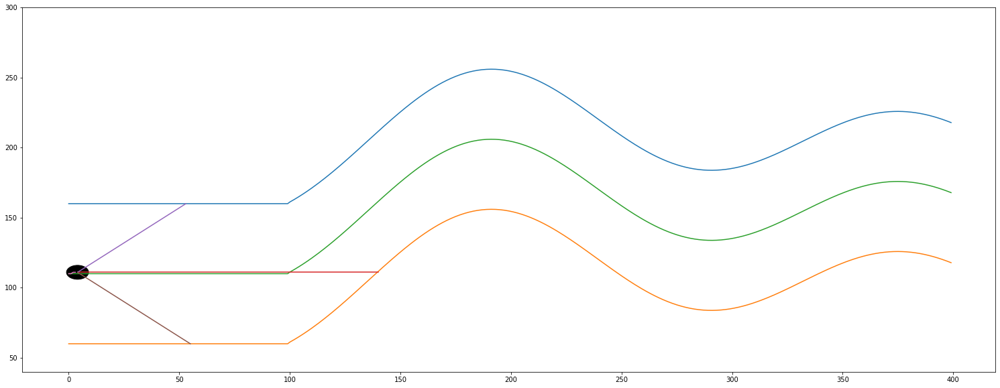

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  136
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó f

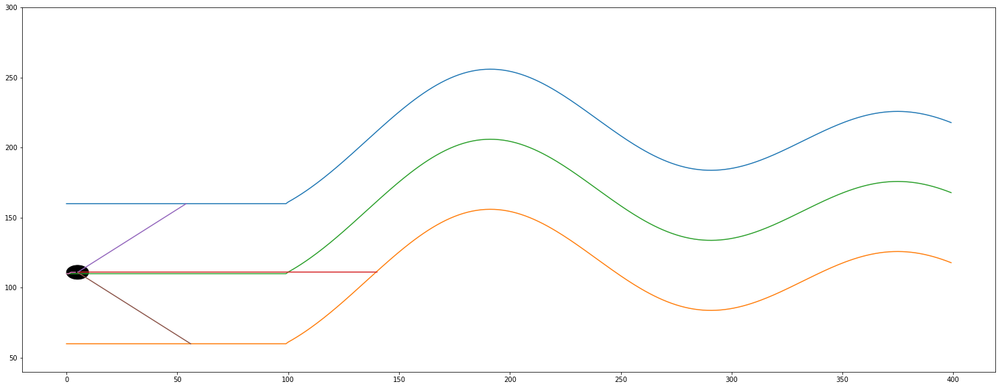

------------------------------ IF i % 3 == 2 ------------------------------
# i =  5
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  135
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  5
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  6
			 len(self.sensor_left)   =  6
			 len(self.sensor_center) =  6
			 len(self.sensor_right)  =  6
			 self.x                  =  5
			 -----------

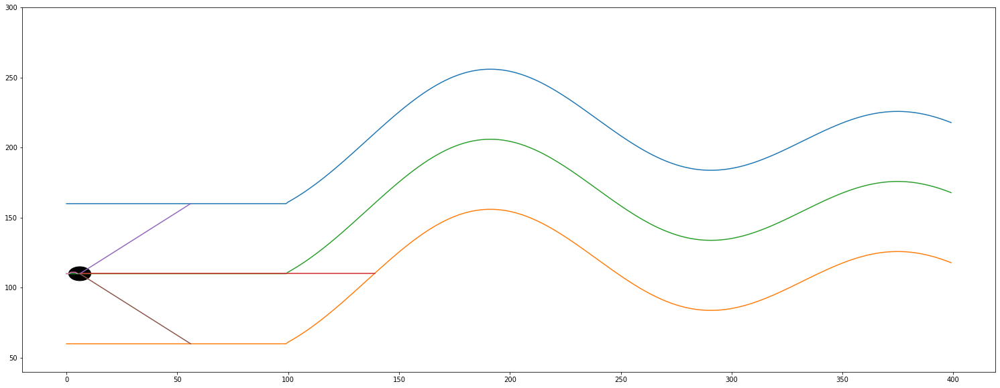

------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

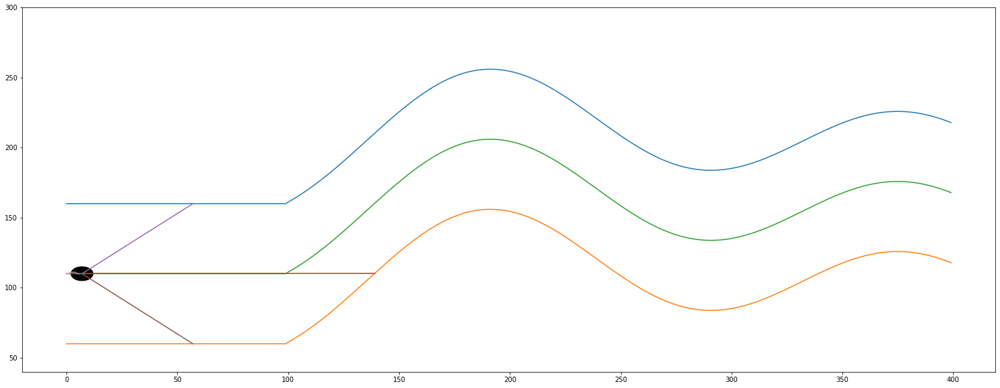

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  132
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most táv

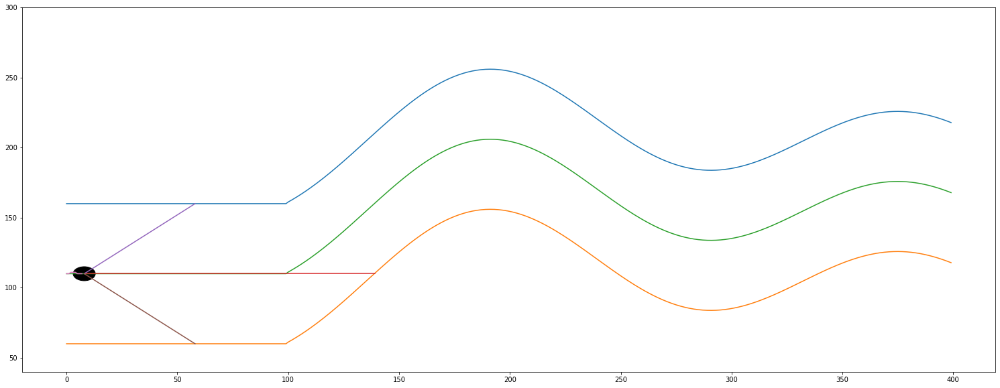

------------------------------ IF i % 3 == 2 ------------------------------
# i =  8
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  131
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  8
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  9
			 len(self.sensor_left)   =  9
			 len(self.sensor_center) =  9
			 len(self.sensor_right)  =  9
			 self.x                  =  8
			 --------

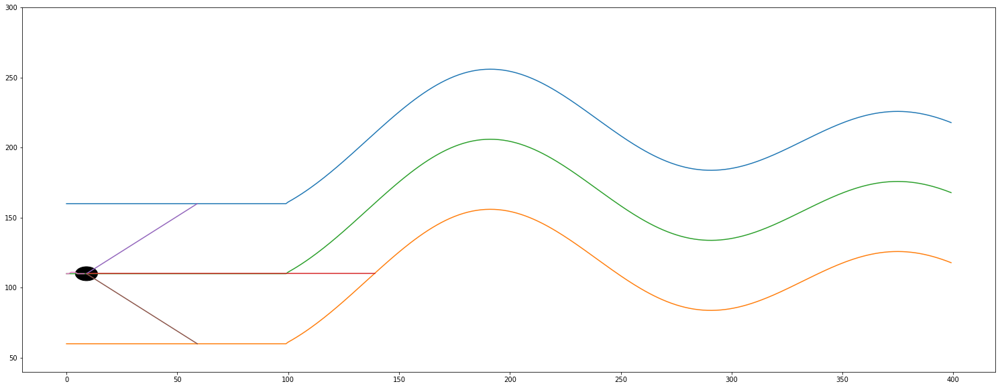

------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  1
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

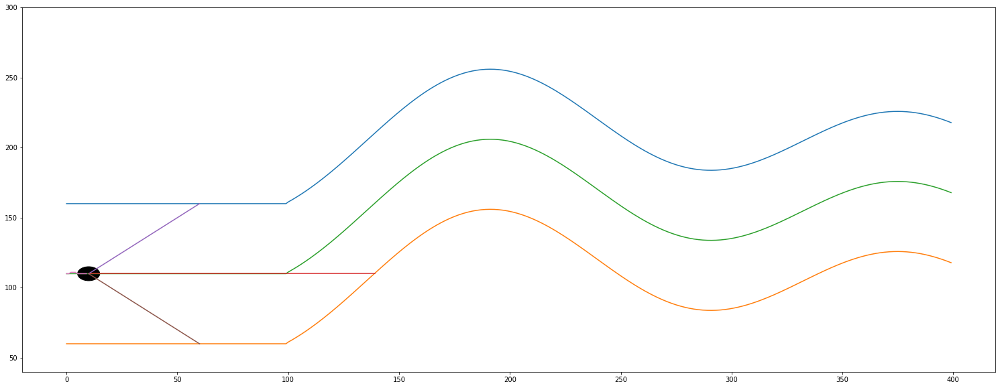

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  129
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső fa

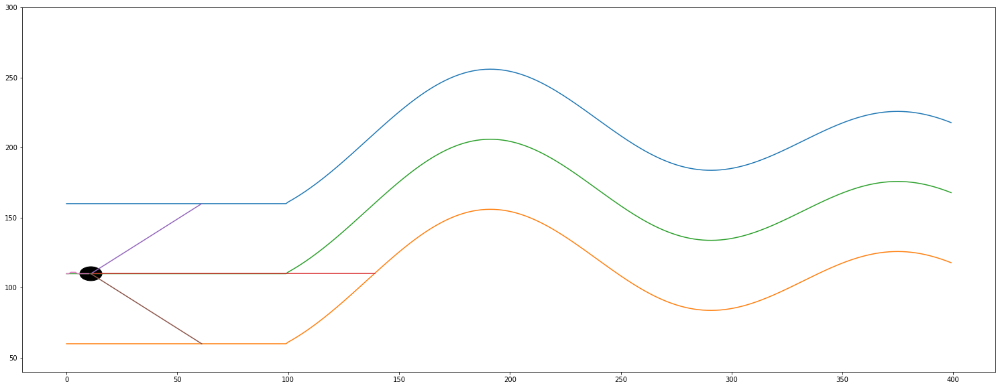

------------------------------ IF i % 3 == 2 ------------------------------
# i =  11
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  130
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  11
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  12
			 len(self.sensor_left)   =  12
			 len(self.sensor_center) =  12
			 len(self.sensor_right)  =  12
			 self.x                  =  11
			 ------

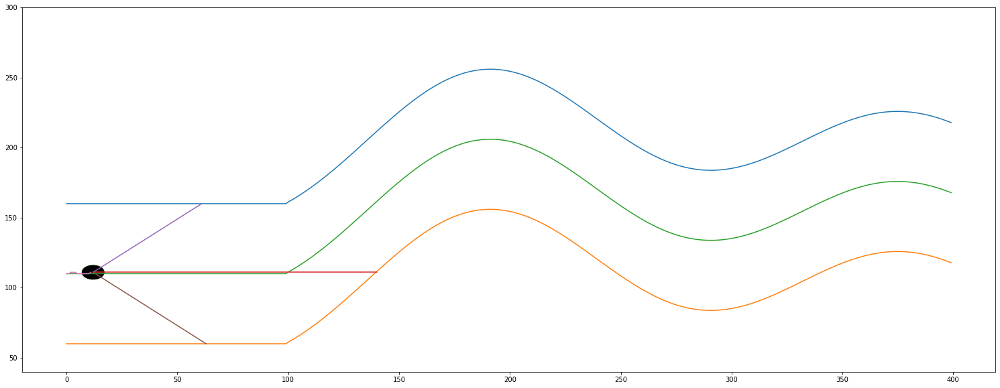

------------------------------ IF i % 3 == 0 ------------------------------
# i =  12
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (13, 3)
y.shape =  (13, 1)
i       =  12
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  111.0
self.y új értéke   =  111.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_

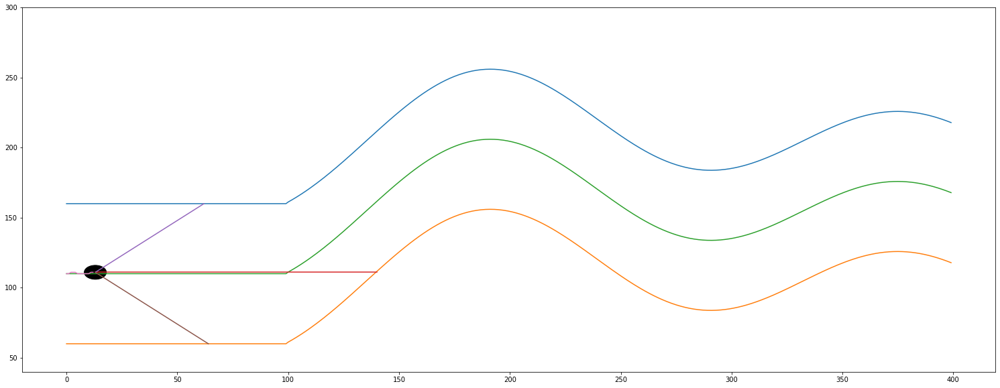

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  127
Sensor from left wall =  50
Sensor from right wall =  52
most távo

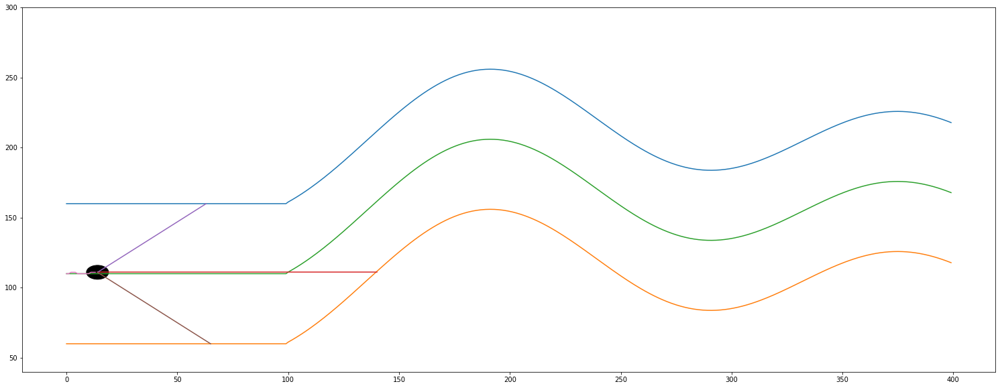

------------------------------ IF i % 3 == 2 ------------------------------
# i =  14
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  126
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  14
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  15
			 len(self.sensor_left)   =  15
			 len(self.sensor_center) =  15
			 len(self.sensor_right)  =  15
			 self.x                  =  14
			 ----

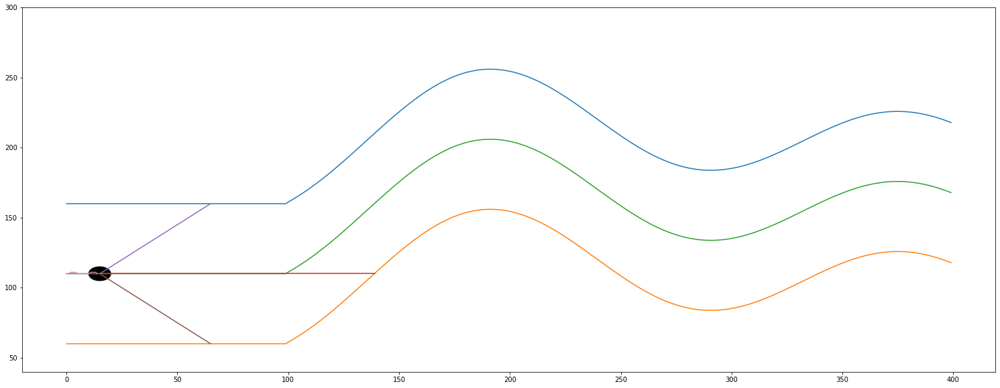

------------------------------ IF i % 3 == 0 ------------------------------
# i =  15
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (16, 3)
y.shape =  (16, 1)
i       =  15
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 

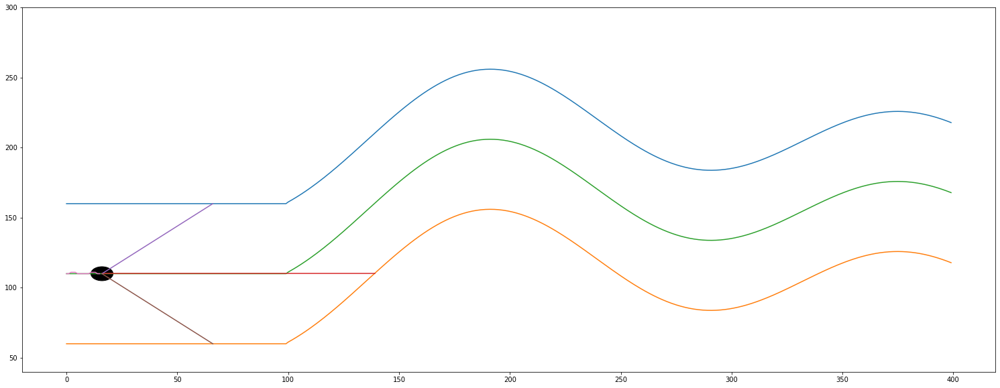

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  123
Sensor from left wall =  51
Sensor from right

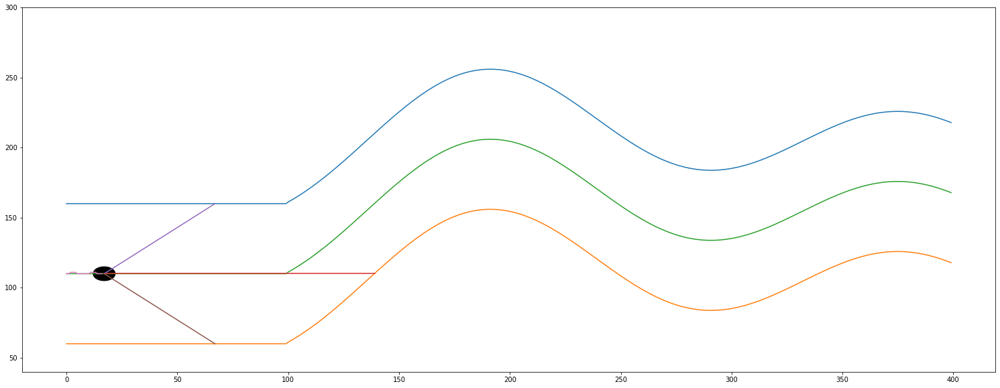

------------------------------ IF i % 3 == 2 ------------------------------
# i =  17
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  122
Sensor from left wall =  52
Sensor from right wall =  50
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  17
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  18
			 len(self.sensor_left)   =  18
			 len(self.sensor_center) =  18
			 len(self.sensor_right)  =  18
			 self.x                  =  17
			 -

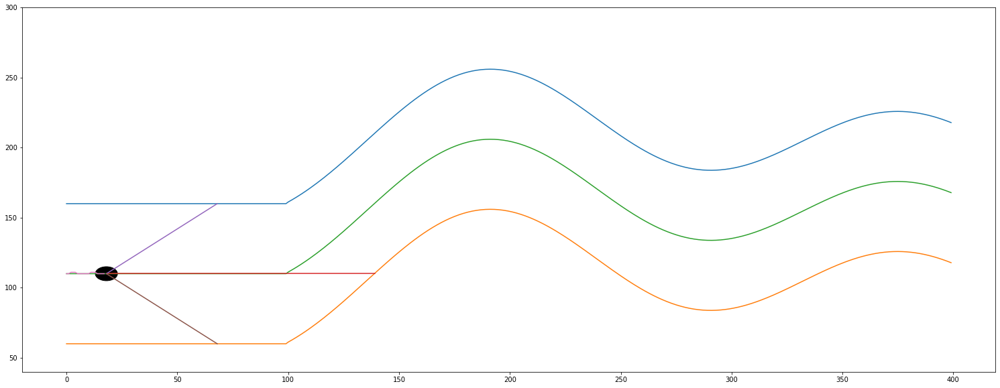

------------------------------ IF i % 3 == 0 ------------------------------
# i =  18
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (19, 3)
y.shape =  (19, 1)
i       =  18
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  110.0
self.y új értéke   =  110.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary

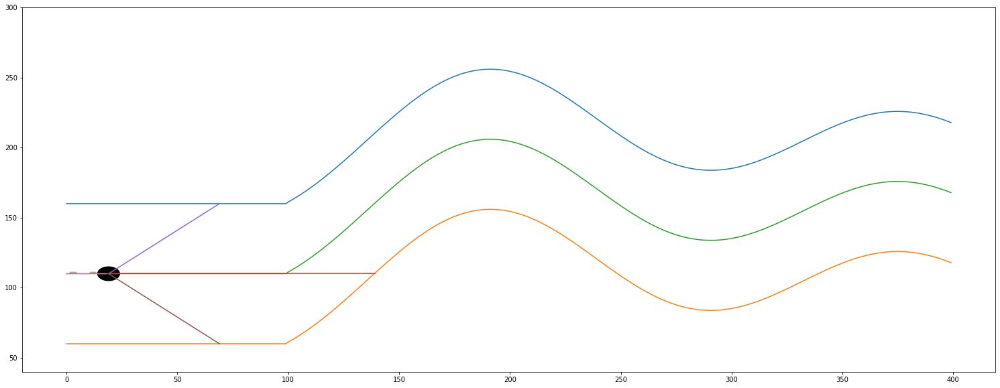

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
110.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  0
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  120
Sensor from left wall = 

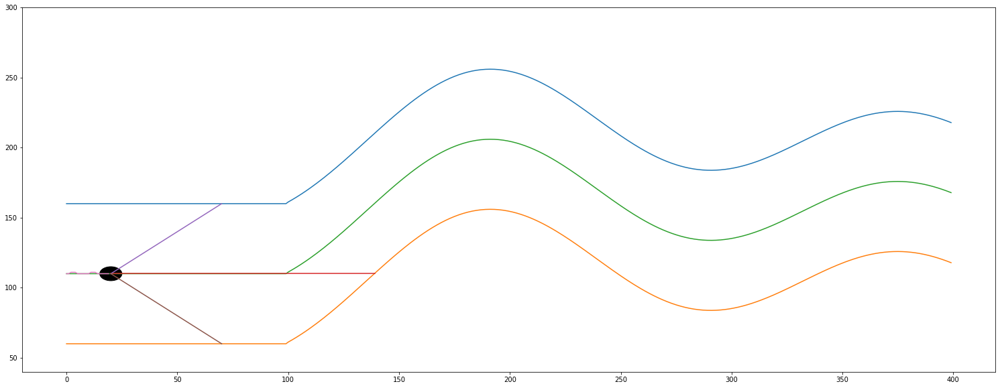

------------------------------ IF i % 3 == 2 ------------------------------
# i =  20
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  121
Sensor from left wall =  50
Sensor from right wall =  52
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  20
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  21
			 len(self.sensor_left)   =  21
			 len(self.sensor_center) =  21
			 len(self.sensor_right)  =  21
			 self.x                  =  20
			 ------

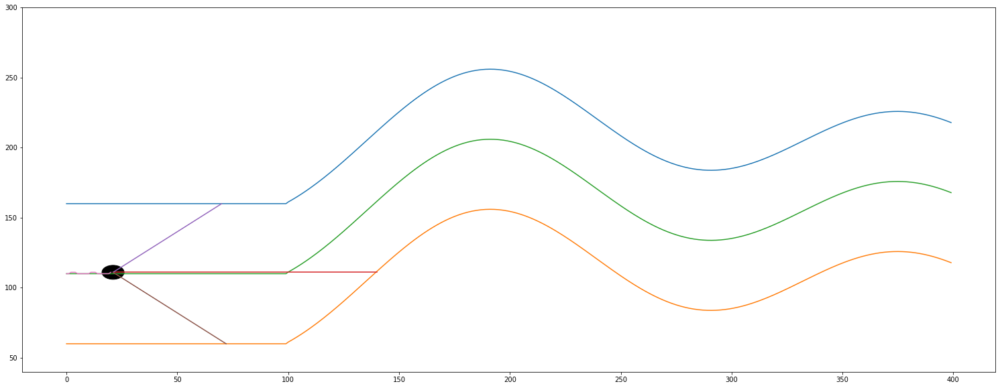

------------------------------ IF i % 3 == 0 ------------------------------
# i =  21
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (22, 3)
y.shape =  (22, 1)
i       =  21
------------------------------ IF i % 3 == 0 ------------------------------
=================== TAKE ACTION ===================
-------- ennyivel módosítom self.y értékét --------
self.y régi értéke =  111.0
self.y új értéke   =  111.0
action             =  0
----------------- módosítás vége -----------------
# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0]
# 		 ----

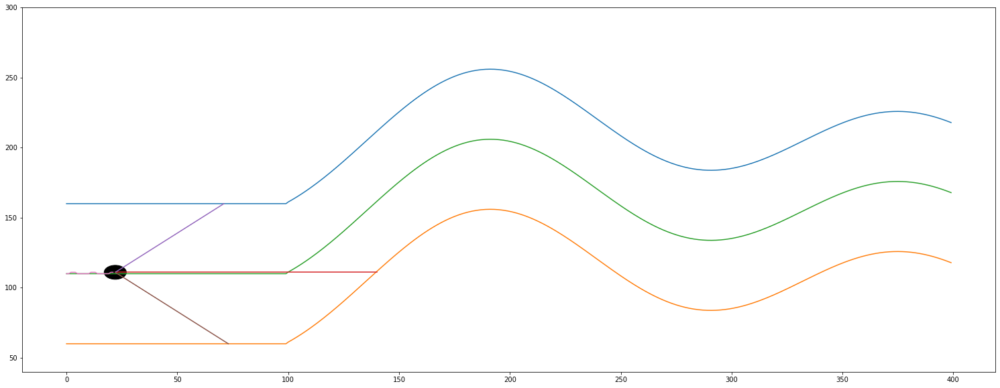

------------------------------ IF i % 3 == 1 ------------------------------
# i =  22
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 119  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0]
len(self.y_distance_real)      =  1
len(self.y_distance_predicted) =  1


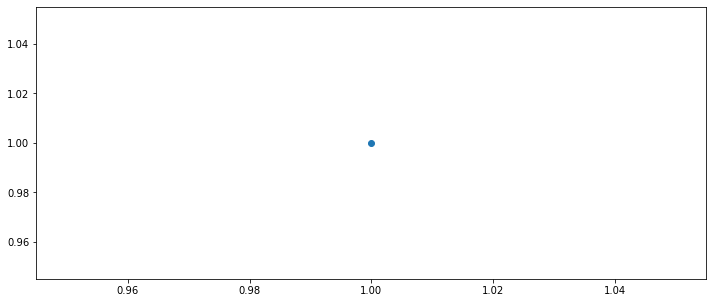

(23, 1)
(23, 1)


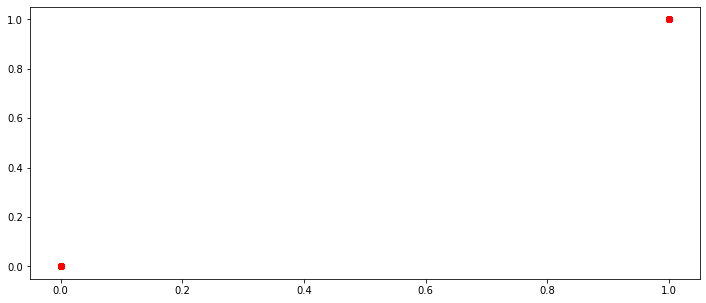

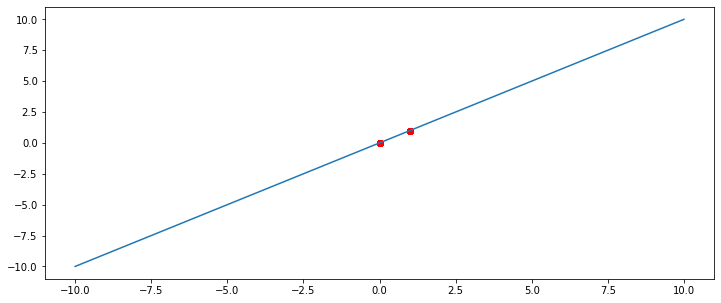

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sensor center =  118
Sen

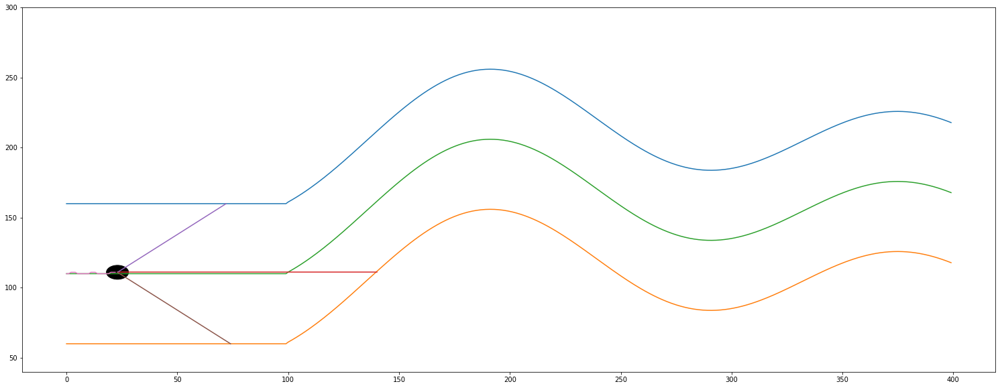

------------------------------ IF i % 3 == 2 ------------------------------
# i =  23
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  117
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  23
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  24
			 len(self.sensor_left)   =  24
			 len(self.sensor_center) =  24
			 len(self.sensor_right)  =  24
			 self.x                  =  23
			 ----

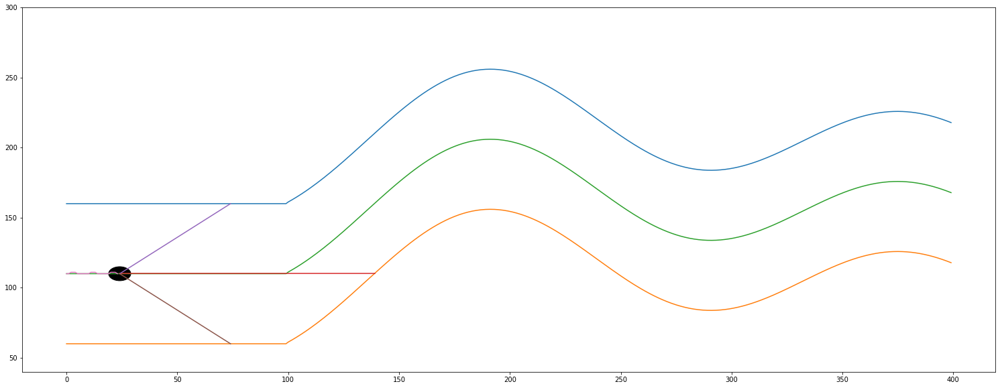

------------------------------ IF i % 3 == 0 ------------------------------
# i =  24
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (25, 3)
y.shape =  (25, 1)
i       =  24
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  24
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(10, 4)
(10, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.])]
[array([111.,  50., 139.,  52.]), array([110.,  51., 135.,  51.]), array([109.,  52., 131., 

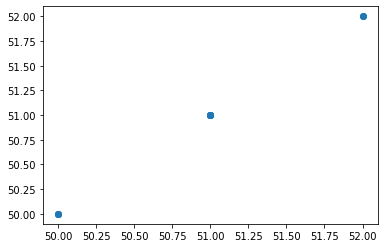

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


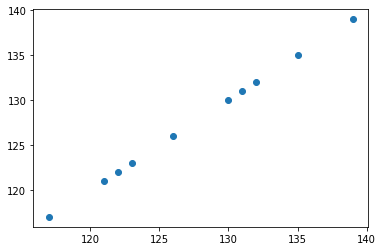

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


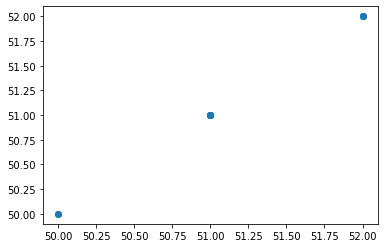

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-3.50830476e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[116  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[113.]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-3.55271368e-14]
		 regres

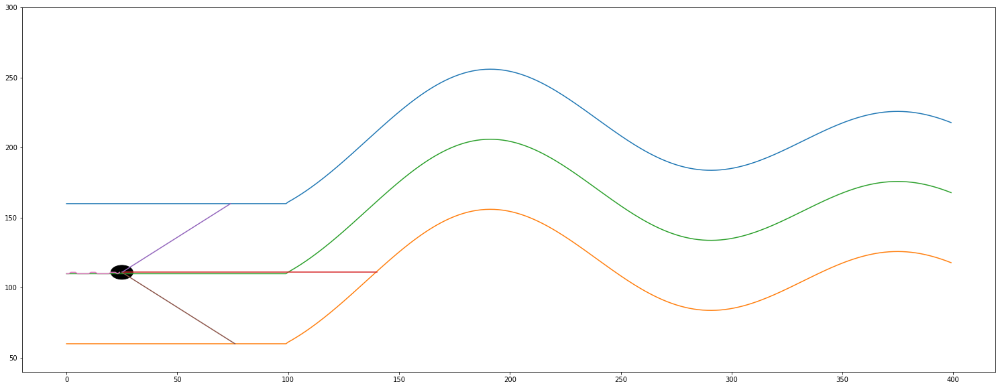

------------------------------ IF i % 3 == 1 ------------------------------
# i =  25
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 116  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0]
len(self.y_distance_real)      =  2
len(self.y_distance_predicted) =  2


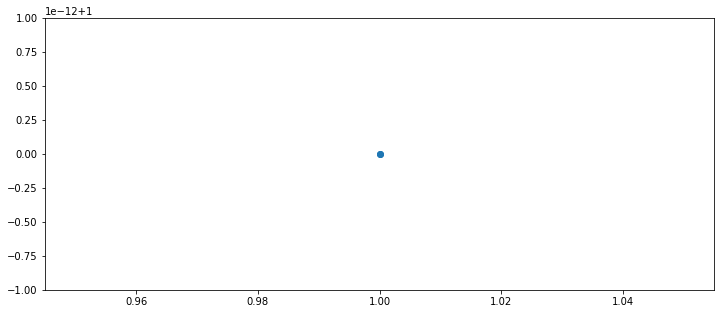

(26, 1)
(26, 1)


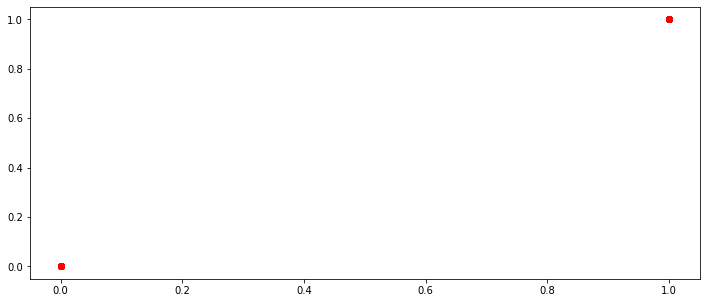

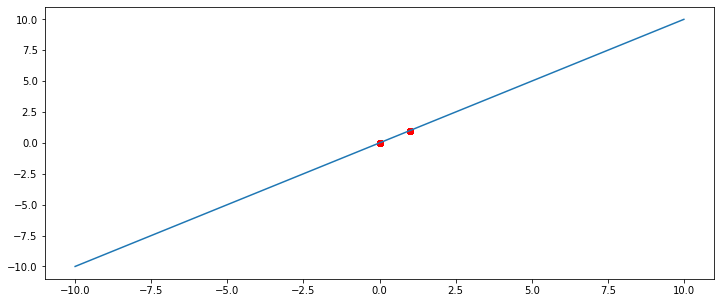

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje -----------------------------------------------------------------------------------------------------------------------------------------
Sen

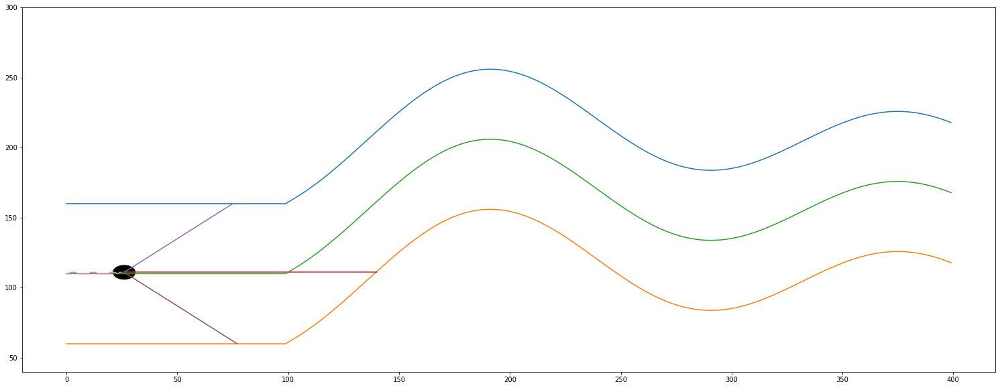

------------------------------ IF i % 3 == 2 ------------------------------
# i =  26
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  114
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  26
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  27
			 len(self.sensor_left)   =  27
			 len(self.sensor_center) =  27
			 len(self.sensor_right)  =  27
			 self.x                  =  26
			 ---

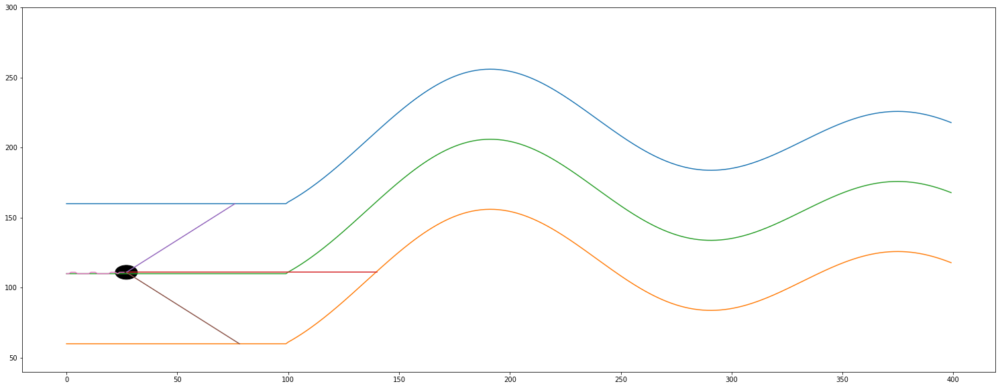

------------------------------ IF i % 3 == 0 ------------------------------
# i =  27
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (28, 3)
y.shape =  (28, 1)
i       =  27
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  27
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(12, 4)
(12, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  51.])]
[array([111.,  50.

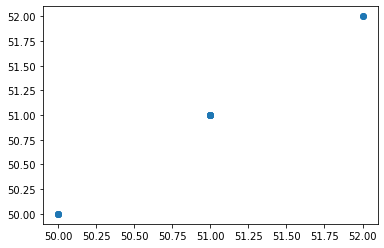

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1. 1.]]


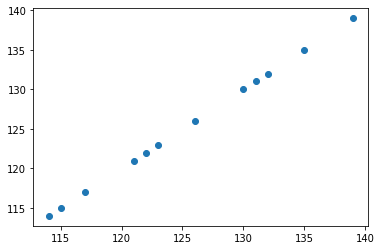

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


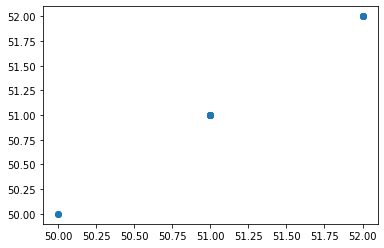

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-3.53050922e-14]]
-------- 1 y up ->  center =  [[2.]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[114  -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[111.]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1. 1.]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =  [-3.55271368e-14]
		 regres

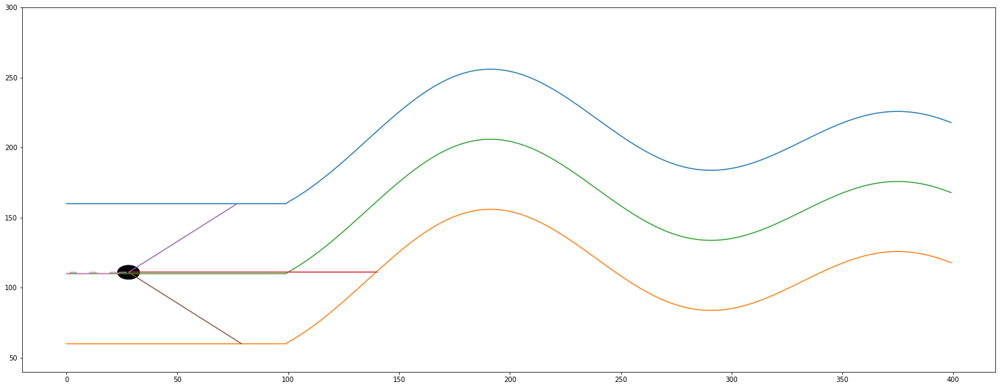

------------------------------ IF i % 3 == 1 ------------------------------
# i =  28
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 113  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0]
len(self.y_distance_real)      =  3
len(self.y_distance_predicted) =  3


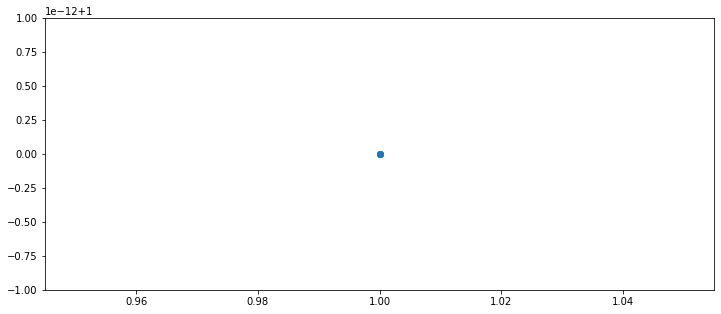

(29, 1)
(29, 1)


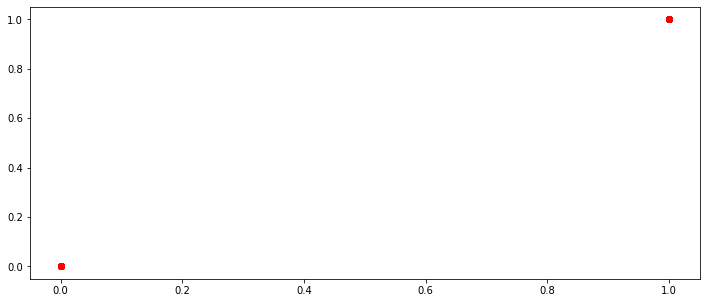

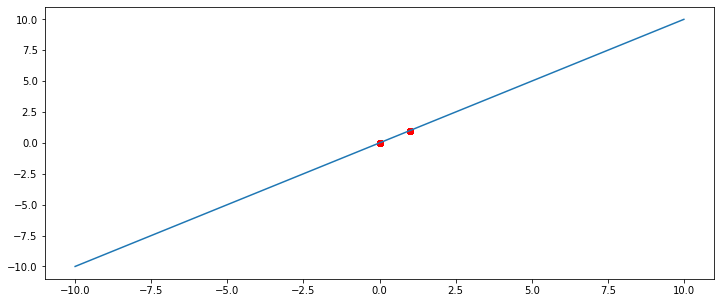

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ------------------------------------------------------------------------------------------------------------------------

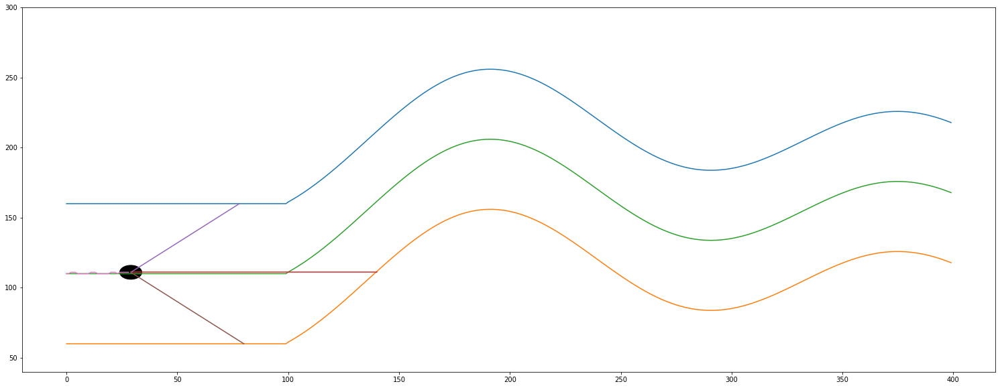

------------------------------ IF i % 3 == 2 ------------------------------
# i =  29
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  112
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  29
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  30
			 len(self.sensor_left)   =  30
			 len(self.sensor_center) =  30
			 len(self.sensor_right)  =  30
			 self.x                  =  29
			 ------

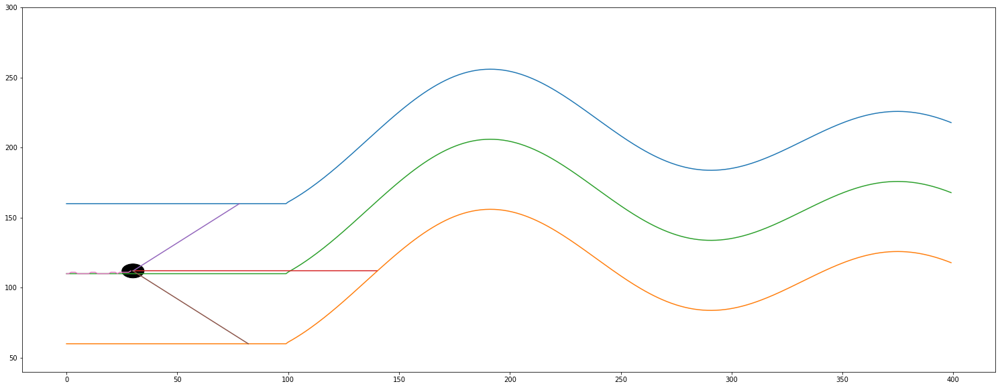

------------------------------ IF i % 3 == 0 ------------------------------
# i =  30
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (31, 3)
y.shape =  (31, 1)
i       =  30
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  30
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(13, 4)
(13, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  51.]), array([111.,  

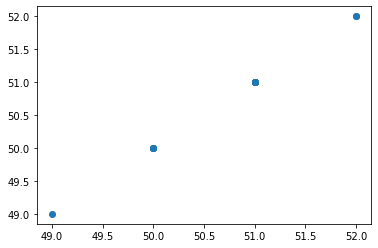

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.01361712 0.93846005]]


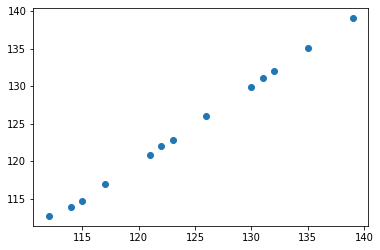

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


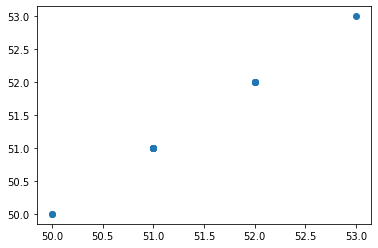

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-7.10542736e-15]]
-------- 1 y up ->  center =  [[0.18612826]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[111  -3]]
		 _X_right  =  [[53 -3]]
		 predicted_left   =  [[52.]]
		 predicted_center =  [[107.93017077]]
		 predicted_right  =  [[50.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.01361712 0.93846005]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_ 

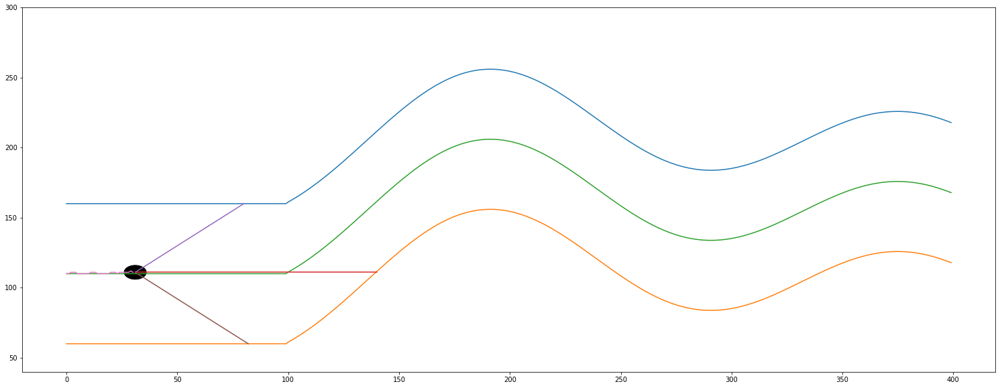

------------------------------ IF i % 3 == 1 ------------------------------
# i =  31
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 110  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0]
len(self.y_distance_real)      =  4
len(self.y_distance_predicted) =  4


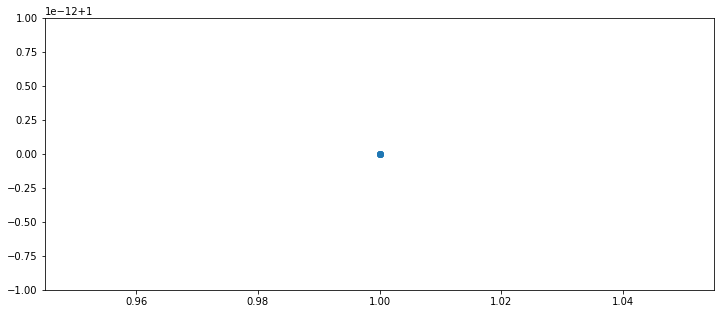

(32, 1)
(32, 1)


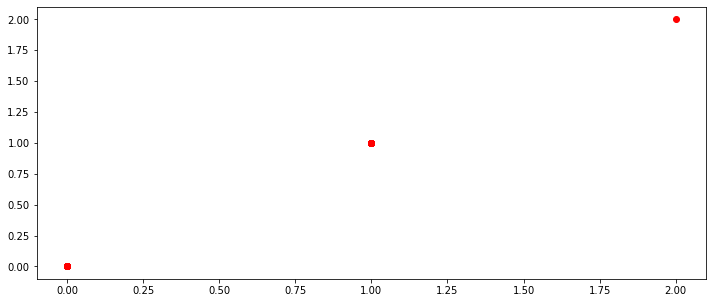

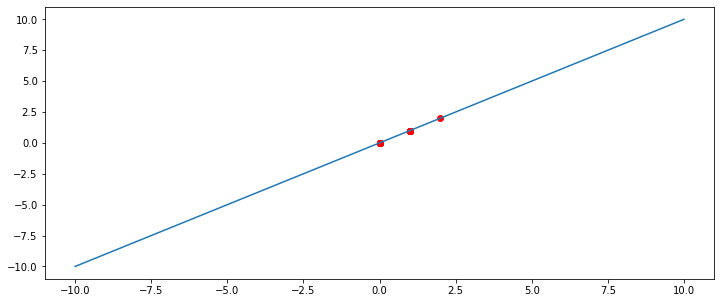

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ---------------------------------------------------------------------------------------------------

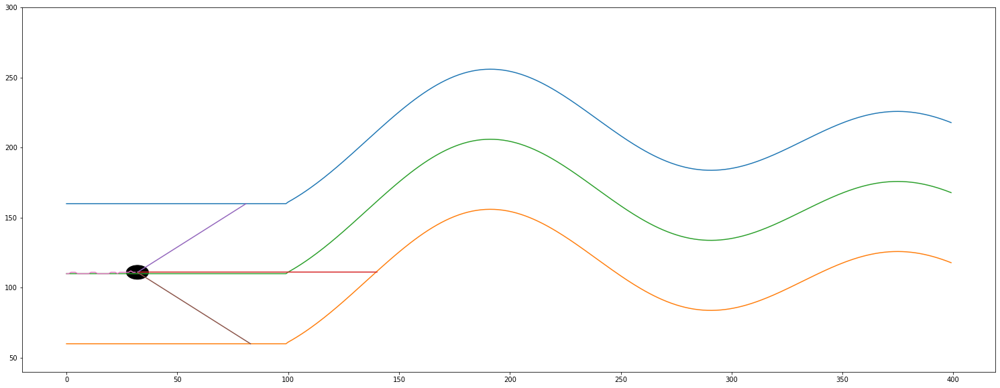

------------------------------ IF i % 3 == 2 ------------------------------
# i =  32
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  108
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  32
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  33
			 len(self.sensor_left)   =  33
			 len(self.sensor_center) =  33
			 len(self.sensor_right)  =  33
			 self.x                  =  32
			 ----

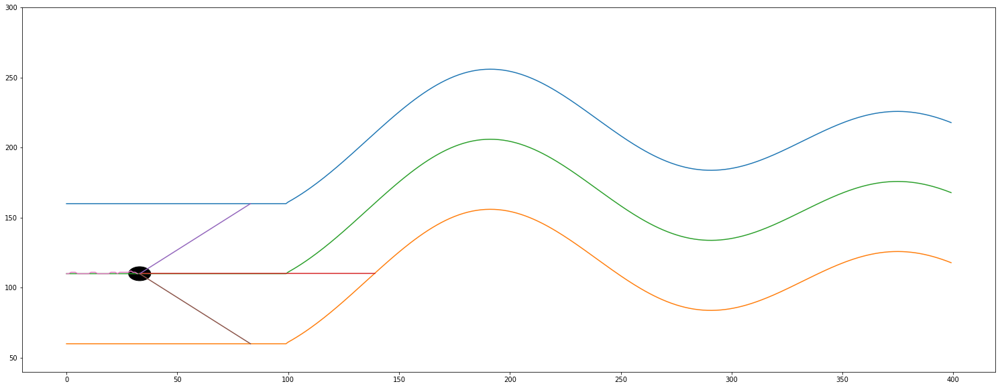

------------------------------ IF i % 3 == 0 ------------------------------
# i =  33
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (34, 3)
y.shape =  (34, 1)
i       =  33
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  33
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(14, 4)
(14, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  51.]), array([111

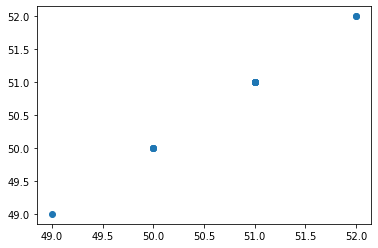

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.01080369 0.92394128]]


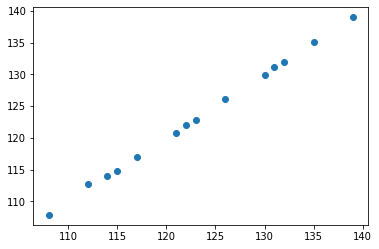

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


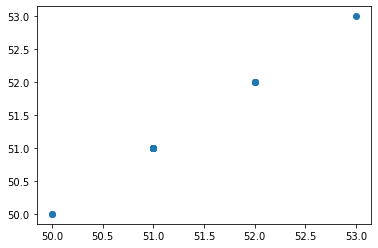

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-2.07611706e-14]]
-------- 1 y up ->  center =  [[0.53137587]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[107  -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[103.98080181]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.01080369 0.92394128]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_ 

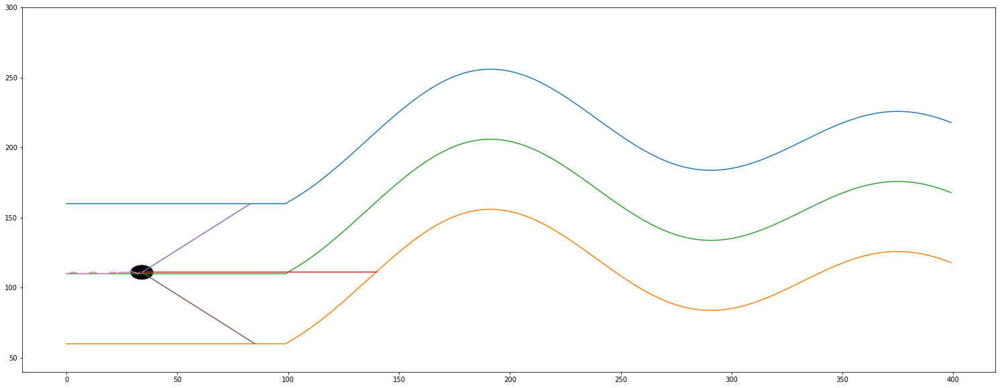

------------------------------ IF i % 3 == 1 ------------------------------
# i =  34
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 107  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0]
len(self.y_distance_real)      =  5
len(self.y_distance_predicted) =  5


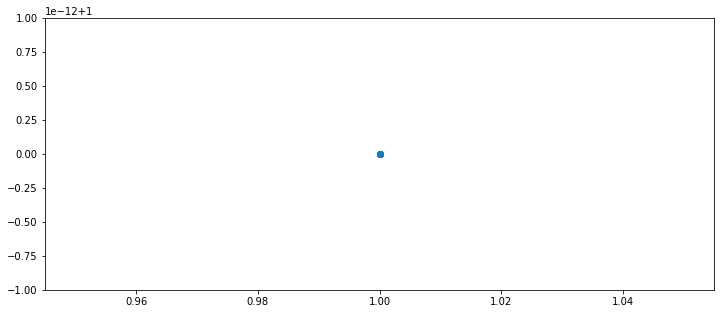

(35, 1)
(35, 1)


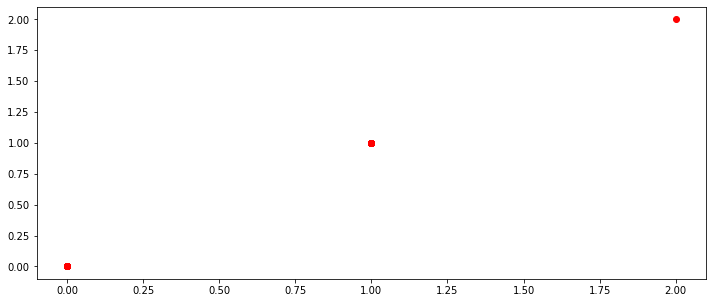

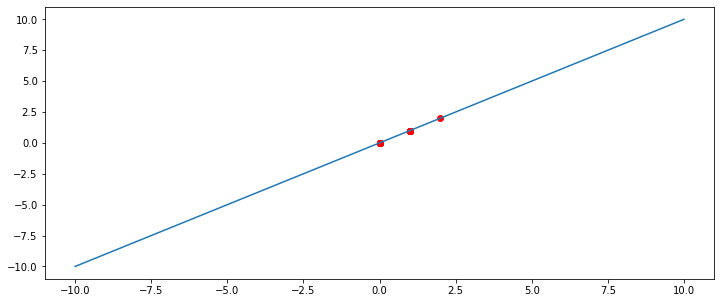

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ------------------------------------------------------------------------------

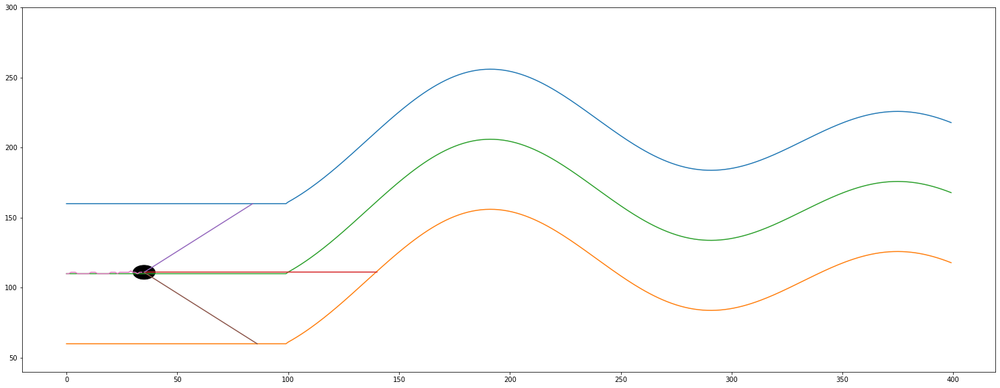

------------------------------ IF i % 3 == 2 ------------------------------
# i =  35
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  105
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  35
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  36
			 len(self.sensor_left)   =  36
			 len(self.sensor_center) =  36
			 len(self.sensor_right)  =  36
			 self.x                  =  35
			 ---

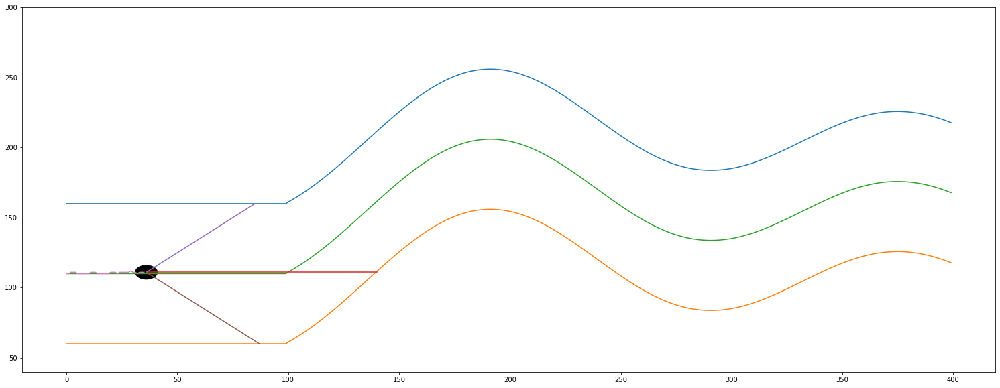

------------------------------ IF i % 3 == 0 ------------------------------
# i =  36
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (37, 3)
y.shape =  (37, 1)
i       =  36
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  36
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(16, 4)
(16, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  51.]), ar

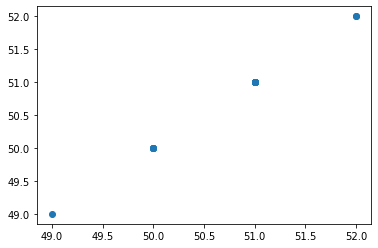

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00571864 0.93571292]]


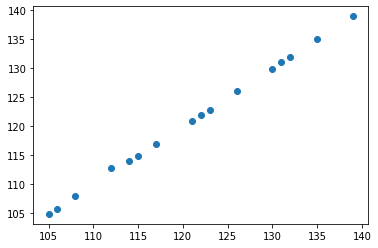

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


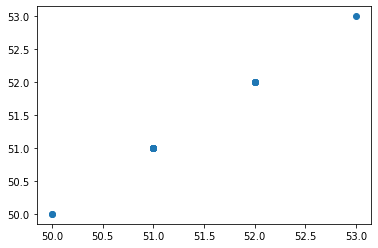

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[6.99440506e-15]]
-------- 1 y up ->  center =  [[1.18661838]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[105  -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[102.03850553]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.00571864 0.93571292]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_  

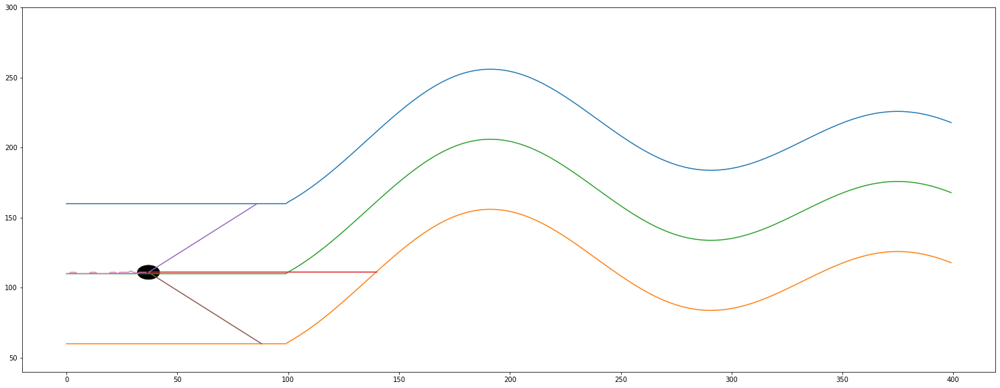

------------------------------ IF i % 3 == 1 ------------------------------
# i =  37
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 104  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0]
len(self.y_distance_real)      =  6
len(self.y_distance_predicted) =  6


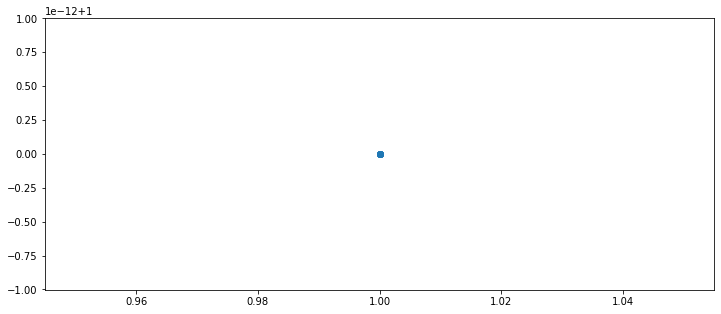

(38, 1)
(38, 1)


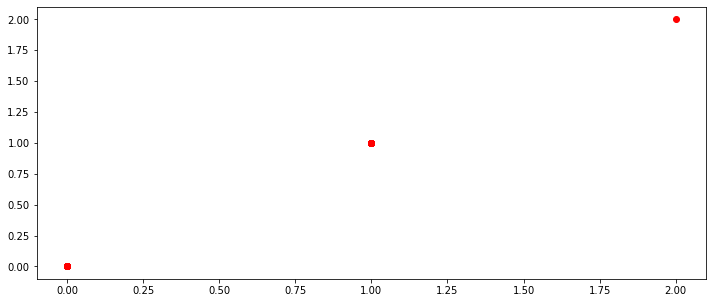

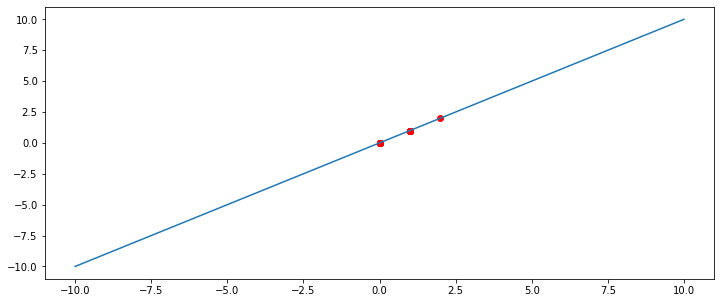

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ---------------------------------------------------------

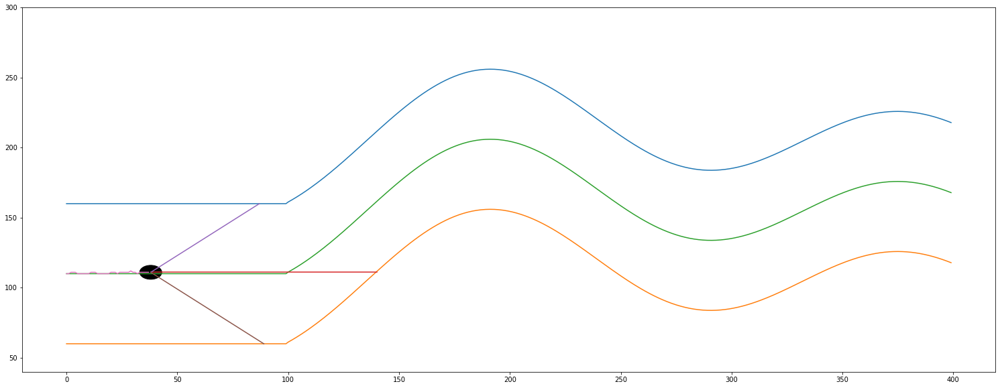

------------------------------ IF i % 3 == 2 ------------------------------
# i =  38
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  103
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  38
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  39
			 len(self.sensor_left)   =  39
			 len(self.sensor_center) =  39
			 len(self.sensor_right)  =  39
			 self.x                  =  38
			 ------

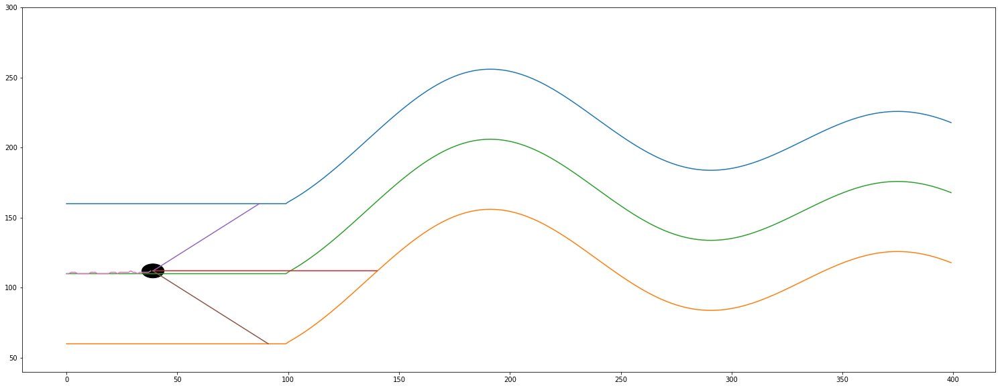

------------------------------ IF i % 3 == 0 ------------------------------
# i =  39
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (40, 3)
y.shape =  (40, 1)
i       =  39
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  39
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(17, 4)
(17, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  51.])

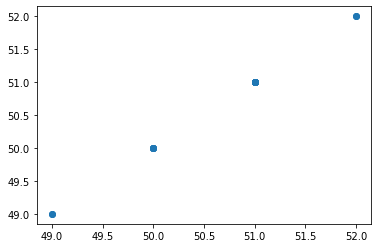

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.01220246 0.8975323 ]]


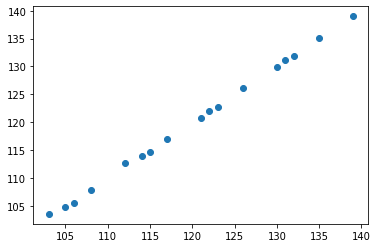

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


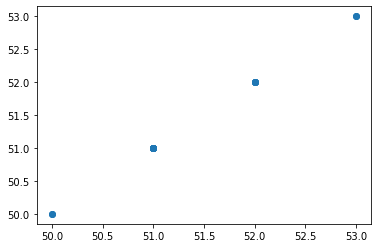

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.42108547e-14]]
-------- 1 y up ->  center =  [[0.33382029]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[102  -3]]
		 _X_right  =  [[53 -3]]
		 predicted_left   =  [[52.]]
		 predicted_center =  [[98.97613933]]
		 predicted_right  =  [[50.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.01220246 0.8975323 ]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_  

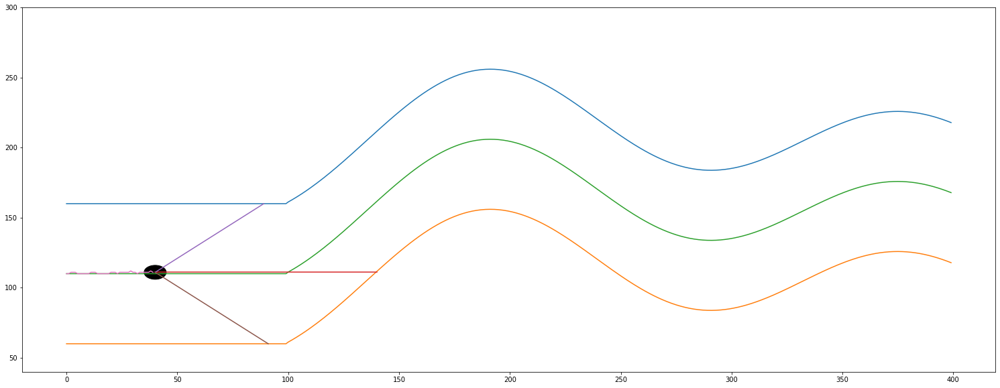

------------------------------ IF i % 3 == 1 ------------------------------
# i =  40
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[ 50 101  52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0]
len(self.y_distance_real)      =  7
len(self.y_distance_predicted) =  7


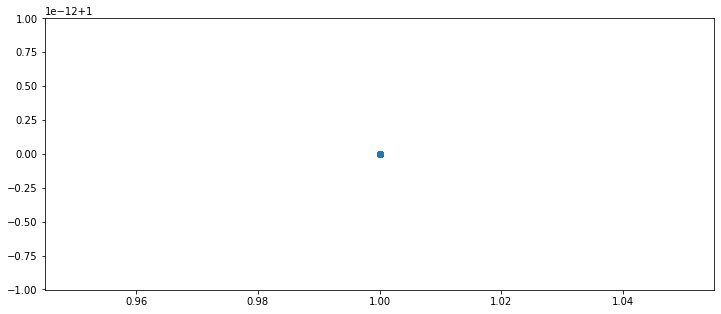

(41, 1)
(41, 1)


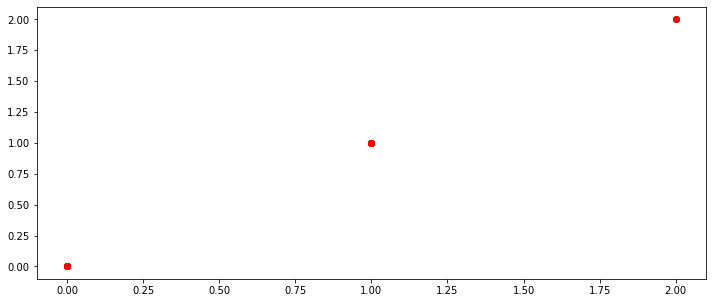

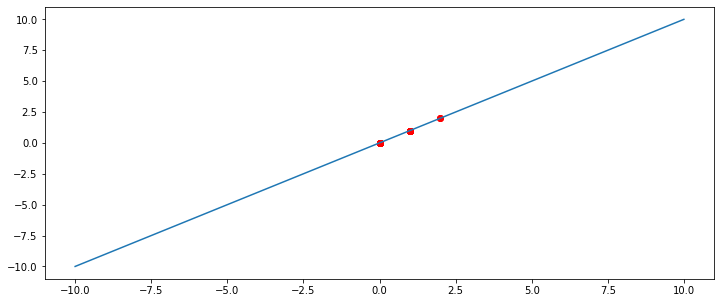

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ------------------------------------

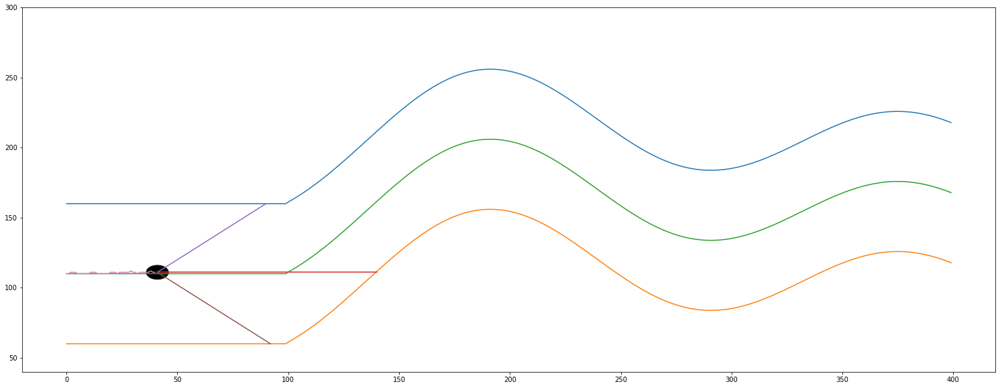

------------------------------ IF i % 3 == 2 ------------------------------
# i =  41
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  99
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  41
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  42
			 len(self.sensor_left)   =  42
			 len(self.sensor_center) =  42
			 len(self.sensor_right)  =  42
			 self.x                  =  41
			 -----

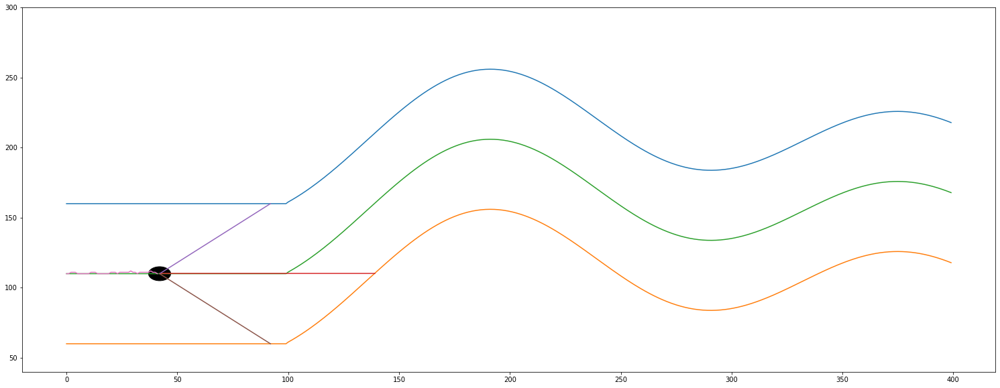

------------------------------ IF i % 3 == 0 ------------------------------
# i =  42
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (43, 3)
y.shape =  (43, 1)
i       =  42
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  42
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(18, 4)
(18, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51., 114.,  5

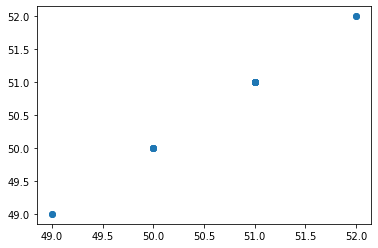

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.01019139 0.88435938]]


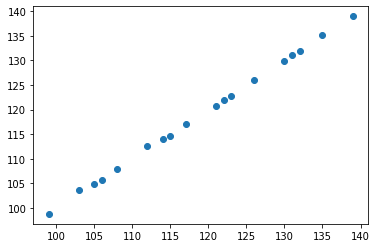

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


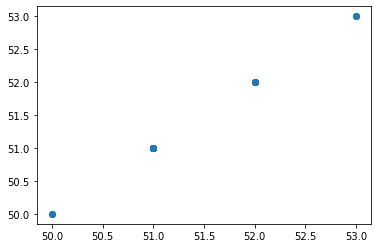

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-2.07611706e-14]]
-------- 1 y up ->  center =  [[0.57179692]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[51 -3]]
		 _X_center =  [[98 -3]]
		 _X_right  =  [[51 -3]]
		 predicted_left   =  [[54.]]
		 predicted_center =  [[95.02292398]]
		 predicted_right  =  [[48.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.01019139 0.88435938]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

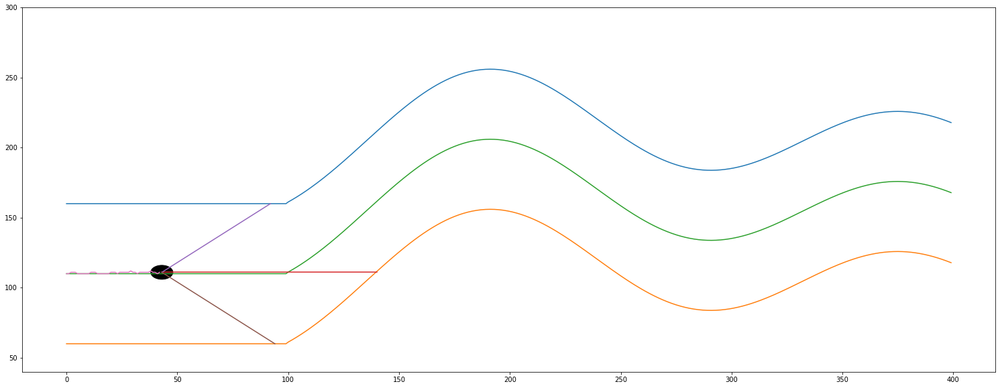

------------------------------ IF i % 3 == 1 ------------------------------
# i =  43
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[50 98 52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0]
len(self.y_distance_real)      =  8
len(self.y_distance_predicted) =  8


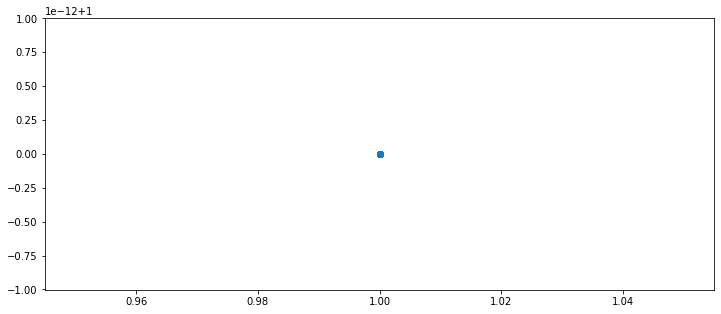

(44, 1)
(44, 1)


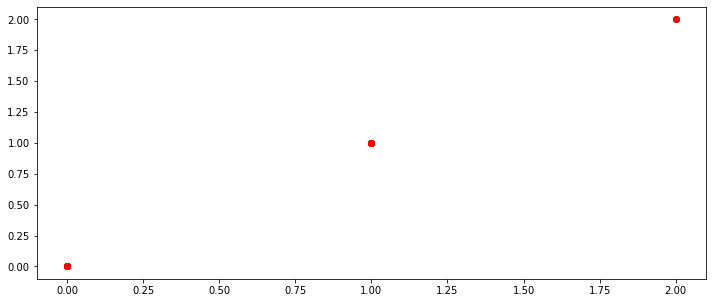

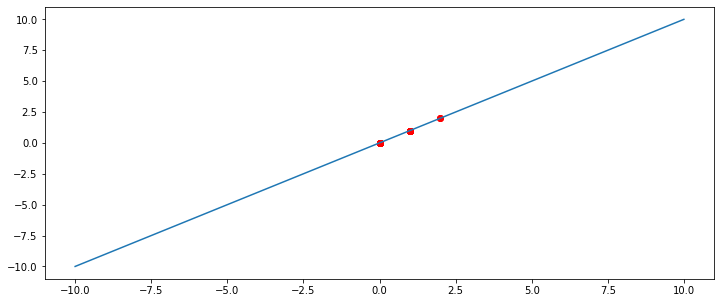

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus eleje ---------------

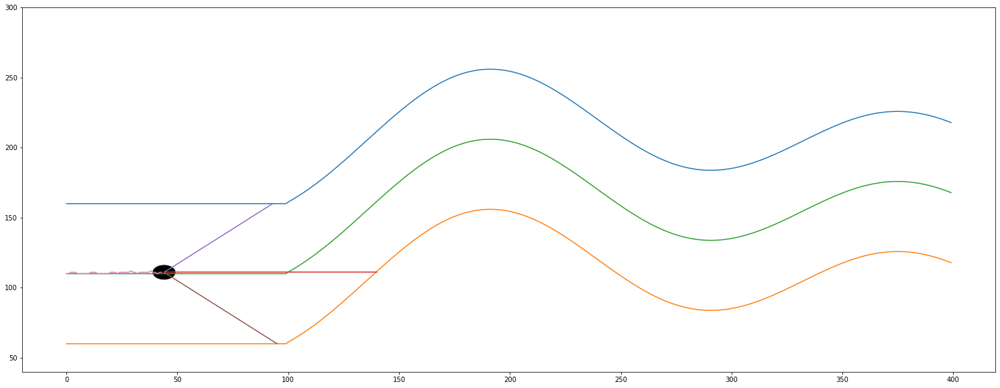

------------------------------ IF i % 3 == 2 ------------------------------
# i =  44
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  96
Sensor from left wall =  51
Sensor from right wall =  51
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  44
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  45
			 len(self.sensor_left)   =  45
			 len(self.sensor_center) =  45
			 len(self.sensor_right)  =  45
			 self.x                  =  44
			 ----

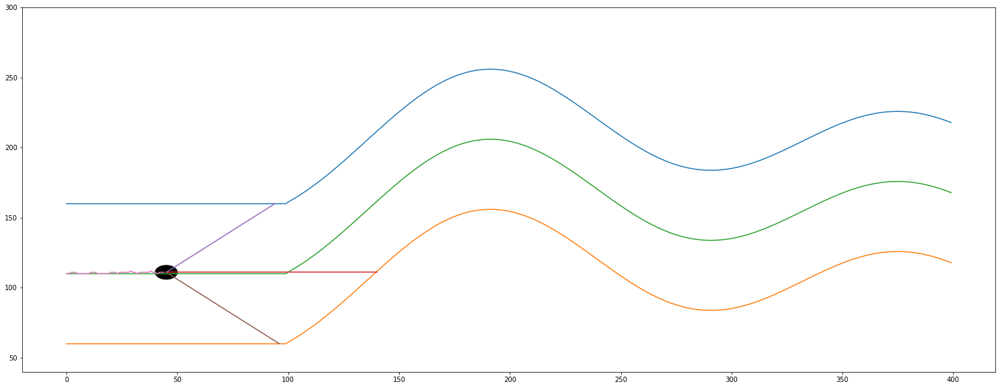

------------------------------ IF i % 3 == 0 ------------------------------
# i =  45
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (46, 3)
y.shape =  (46, 1)
i       =  45
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  45
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.]
(20, 4)
(20, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  51.,

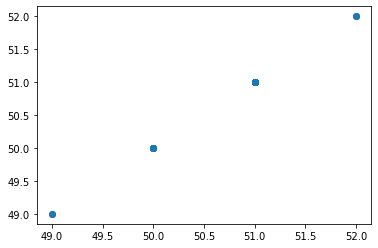

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00588946 0.89793869]]


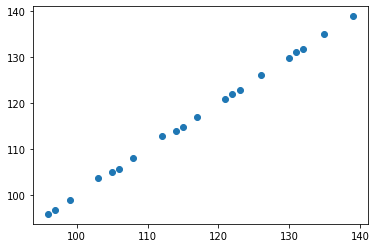

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


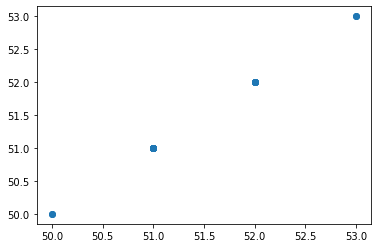

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.44328993e-14]]
-------- 1 y up ->  center =  [[1.11682217]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[50 -3]]
		 _X_center =  [[96 -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[53.]]
		 predicted_center =  [[93.0845665]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.00588946 0.89793869]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   = 

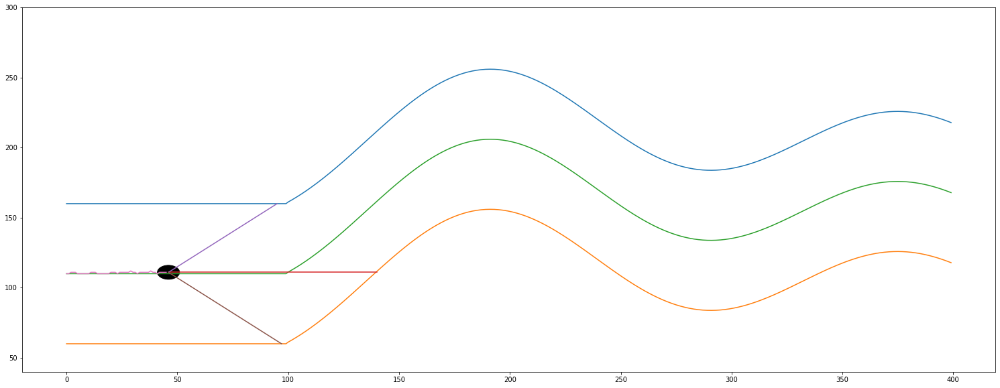

------------------------------ IF i % 3 == 1 ------------------------------
# i =  46
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[50 95 52]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0]
len(self.y_distance_real)      =  9
len(self.y_distance_predicted) =  9


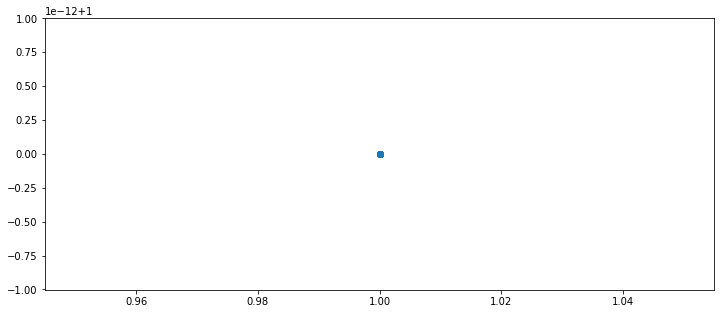

(47, 1)
(47, 1)


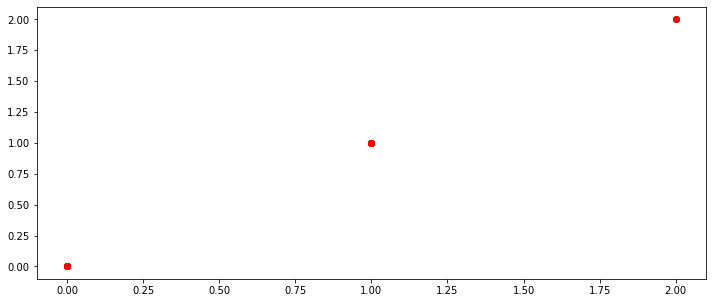

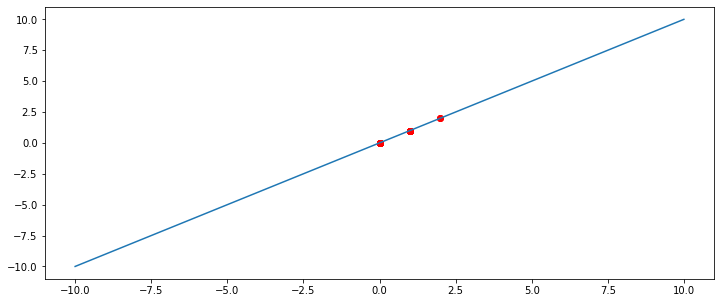

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++
# A run ciklus 

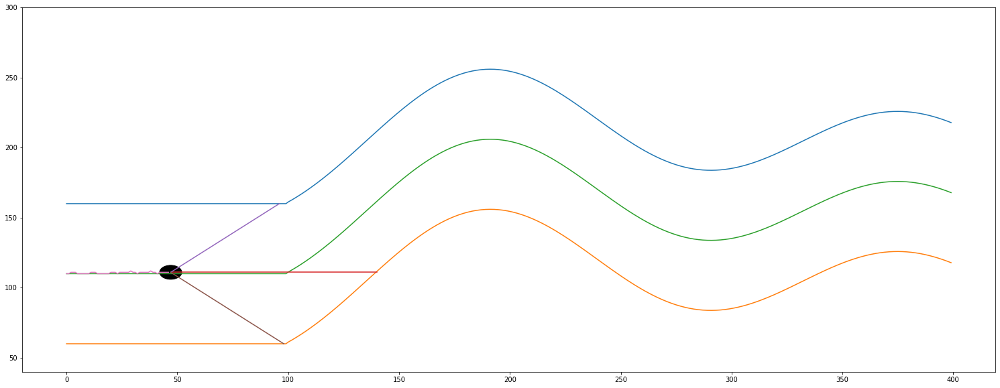

------------------------------ IF i % 3 == 2 ------------------------------
# i =  47
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  94
Sensor from left wall =  49
Sensor from right wall =  53
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  47
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  48
			 len(self.sensor_left)   =  48
			 len(self.sensor_center) =  48
			 len(self.sensor_right)  =  48
			 self.x                  =  47
			 -------

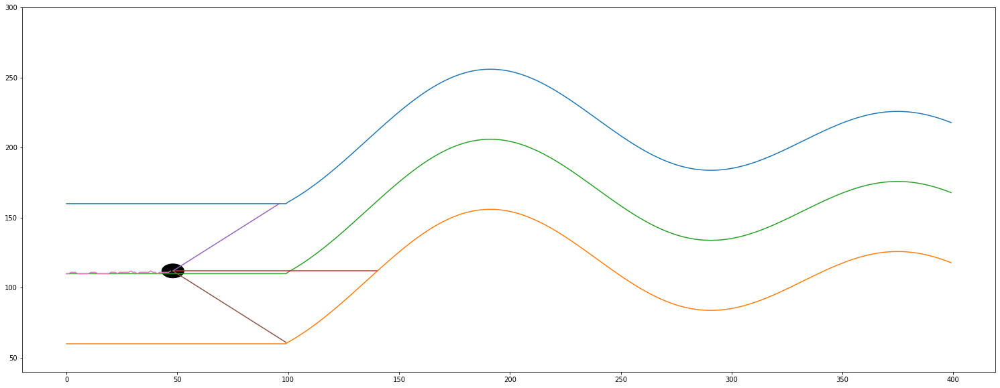

------------------------------ IF i % 3 == 0 ------------------------------
# i =  48
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (49, 3)
y.shape =  (49, 1)
i       =  48
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  48
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1.]
(21, 4)
(21, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110.,  

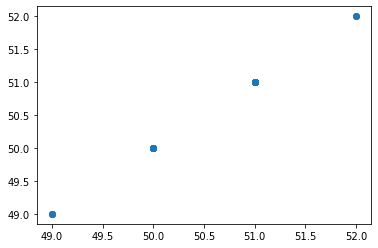

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00963776 0.87033899]]


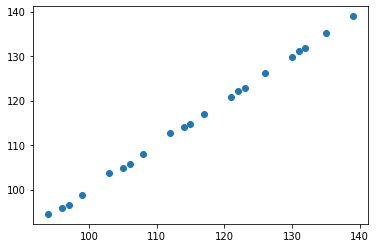

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


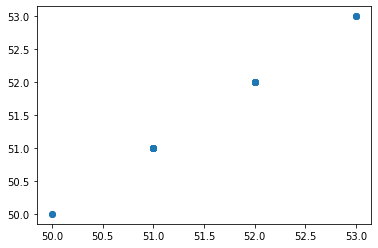

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-6.43929354e-15]]
-------- 1 y up ->  center =  [[0.62944398]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[49 -3]]
		 _X_center =  [[93 -3]]
		 _X_right  =  [[52 -3]]
		 predicted_left   =  [[52.]]
		 predicted_center =  [[90.03476216]]
		 predicted_right  =  [[49.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1. -1.]]
		 regression_center.coef_ =  [[1.00963776 0.87033899]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression_left.intercept_   =

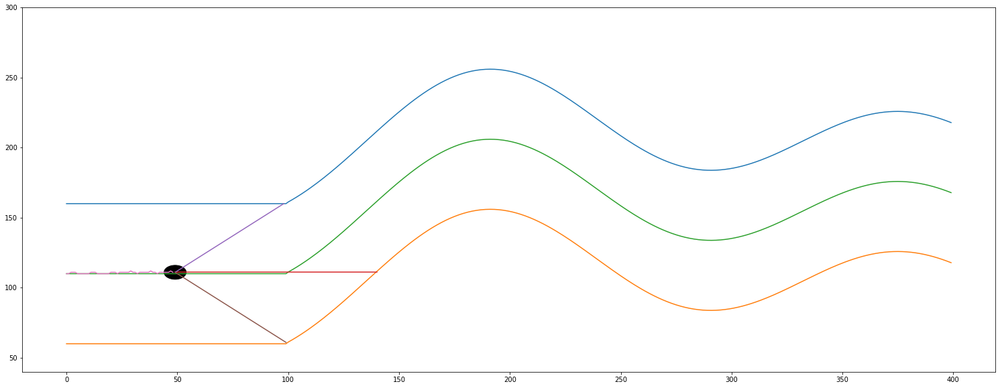

------------------------------ IF i % 3 == 1 ------------------------------
# i =  49
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[50 92 51]]
actual predicted =  [[1.]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0]
len(self.y_distance_real)      =  10
len(self.y_distance_predicted) =  10


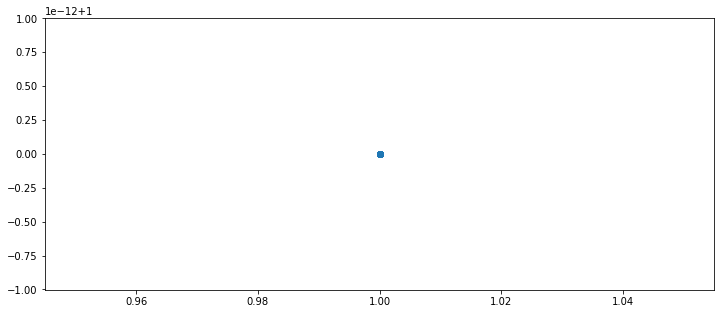

(50, 1)
(50, 1)


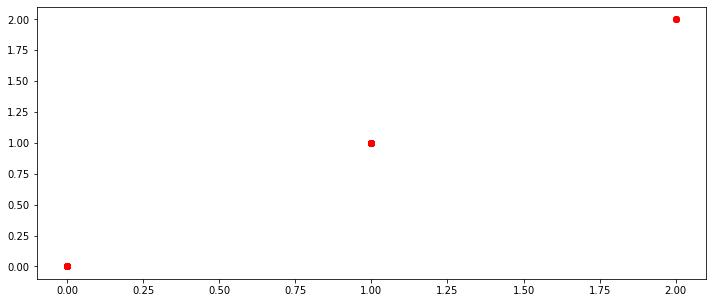

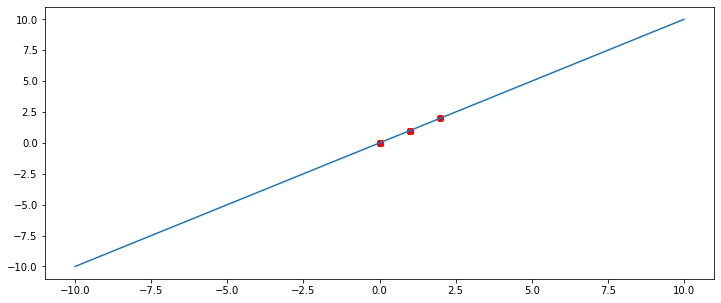

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

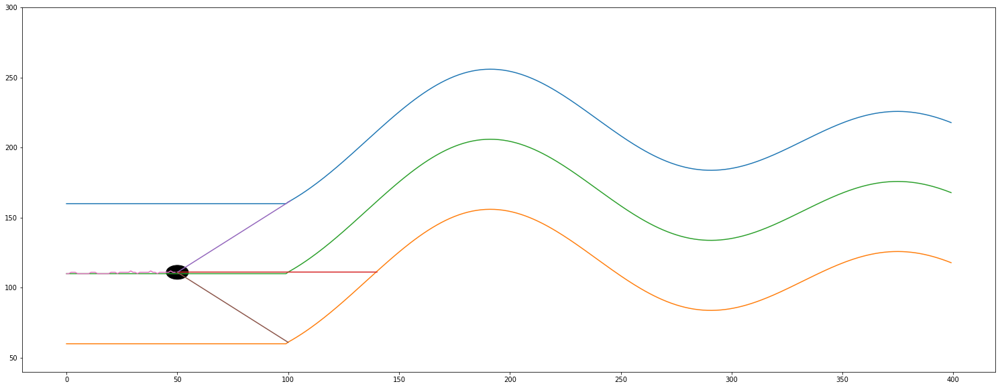

------------------------------ IF i % 3 == 2 ------------------------------
# i =  50
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  90
Sensor from right wall =  50
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  50
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  51
			 len(self.sensor_left)   =  51
			 len(self.sensor_center) =  51
			 len(self.sensor_right)  =  51
			 self.x                  =  50
			 -------------- Teszt End --------

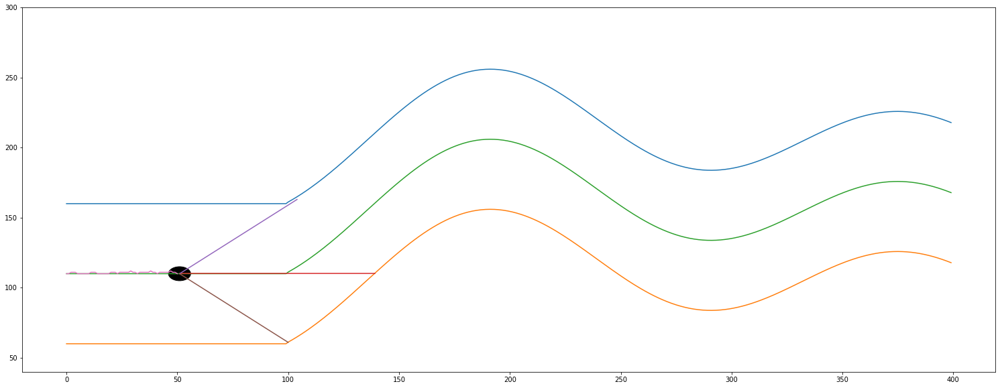

------------------------------ IF i % 3 == 0 ------------------------------
# i =  51
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (52, 3)
y.shape =  (52, 1)
i       =  51
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  51
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1.]
(22, 4)
(22, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), array([110

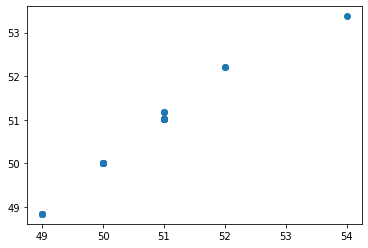

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00833015 0.85984993]]


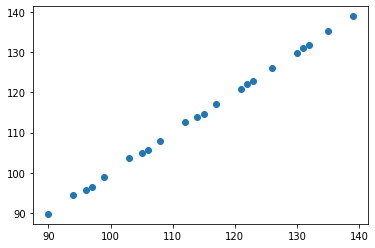

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1. 1.]]


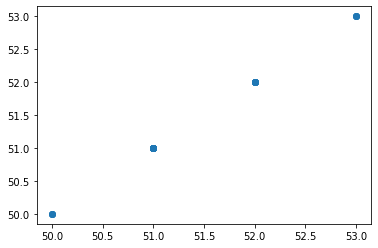

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-8.63811189]]
-------- 1 y up ->  center =  [[0.77839247]]
-------- 1 y up ->  right  =  [[2.]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[89 -3]]
		 _X_right  =  [[50 -3]]
		 predicted_left   =  [[57.90559441]]
		 predicted_center =  [[86.07204629]]
		 predicted_right  =  [[47.]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.17307692 -1.09265734]]
		 regression_center.coef_ =  [[1.00833015 0.85984993]]
		 regression_right.coef_  =  [[1. 1.]]
		 regression

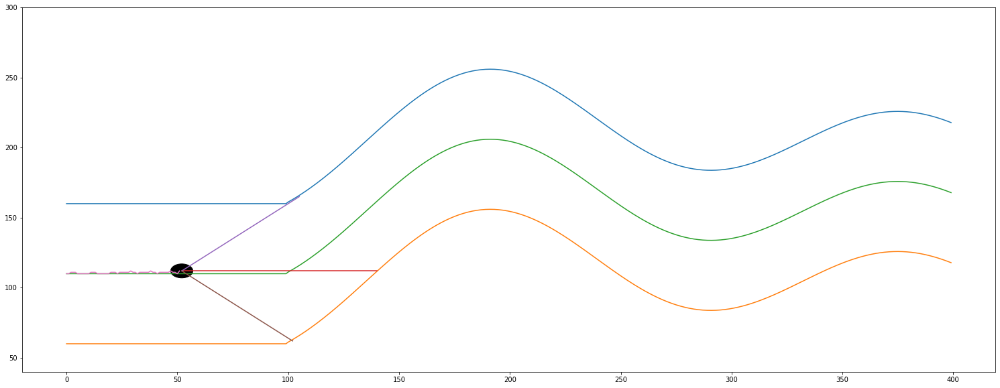

------------------------------ IF i % 3 == 1 ------------------------------
# i =  52
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 89 51]]
actual predicted =  [[0.41955574]]
actual self.y_distance[-1] =  2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0]
len(self.y_distance_real)      =  11
len(self.y_distance_predicted) =  11


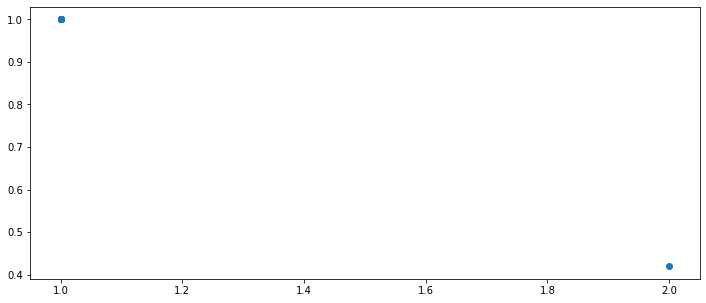

(53, 1)
(53, 1)


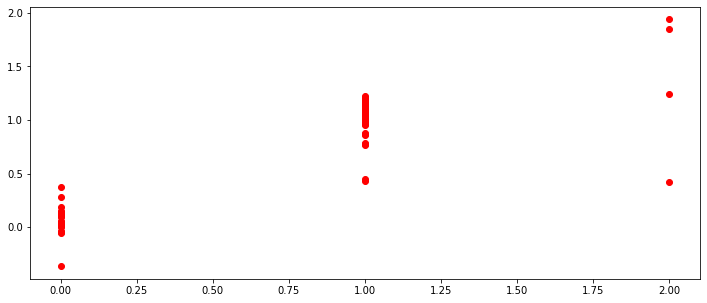

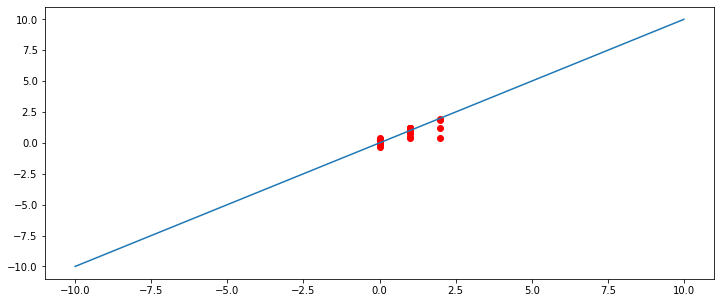

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
112.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

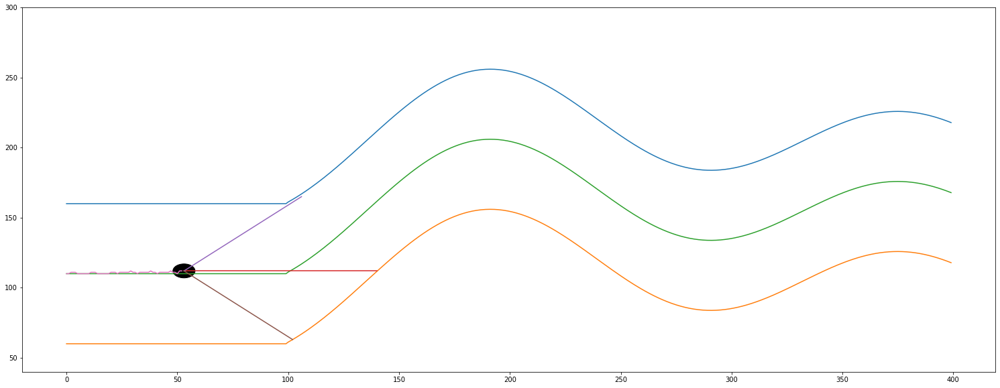

------------------------------ IF i % 3 == 2 ------------------------------
# i =  53
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  88
Sensor from right wall =  50
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  53
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  54
			 len(self.sensor_left)   =  54
			 len(self.sensor_center) =  54
			 len(self.sensor_right)  =  54
			 self.x                  =  53
			 -------------- Teszt End -------

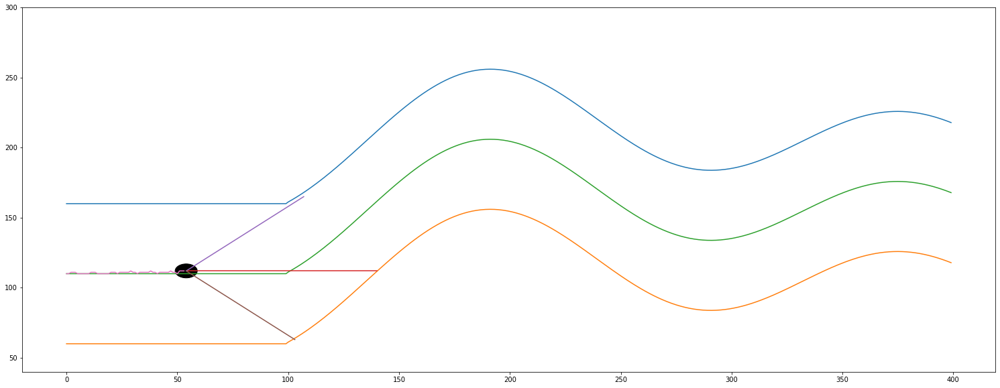

------------------------------ IF i % 3 == 0 ------------------------------
# i =  54
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (55, 3)
y.shape =  (55, 1)
i       =  54
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  54
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.]
(24, 4)
(24, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.]), ar

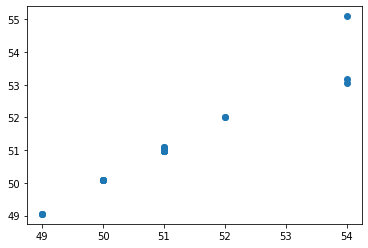

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00535383 0.7894359 ]]


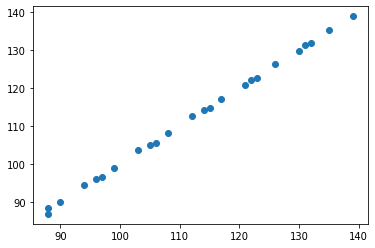

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.94656489 0.90108142]]


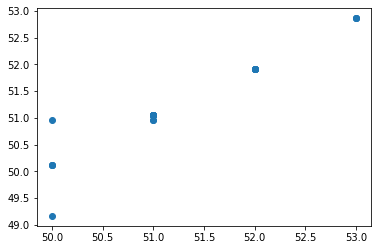

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-1.29487179]]
-------- 1 y up ->  center =  [[1.06882216]]
-------- 1 y up ->  right  =  [[4.58842239]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[87 -3]]
		 _X_right  =  [[50 -3]]
		 predicted_left   =  [[57.02197802]]
		 predicted_center =  [[84.37150805]]
		 predicted_right  =  [[47.36577608]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.02747253 -0.96520147]]
		 regression_center.coef_ =  [[1.00535383 0.7894359 ]]
		 regression_right.coef_  =  [[0.946

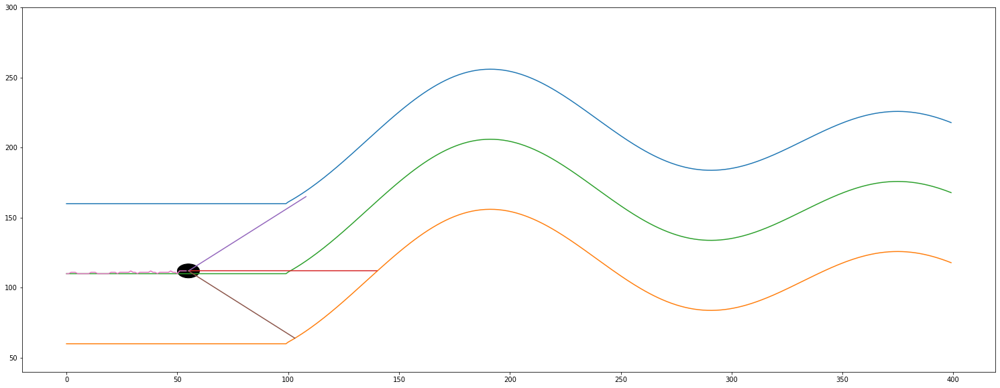

------------------------------ IF i % 3 == 1 ------------------------------
# i =  55
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 86 49]]
actual predicted =  [[-0.17502122]]
actual self.y_distance[-1] =  2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0]
len(self.y_distance_real)      =  12
len(self.y_distance_predicted) =  12


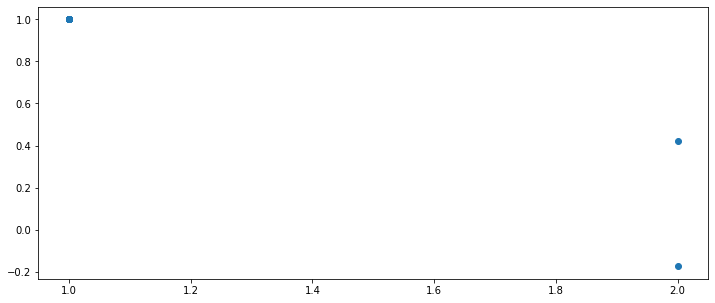

(56, 1)
(56, 1)


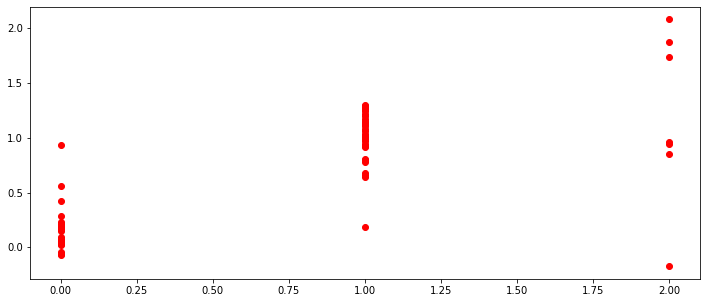

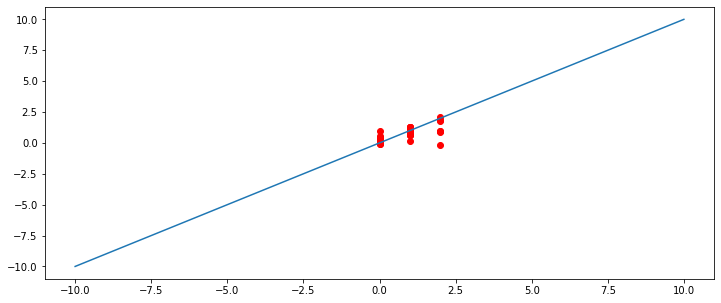

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
112.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége +++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

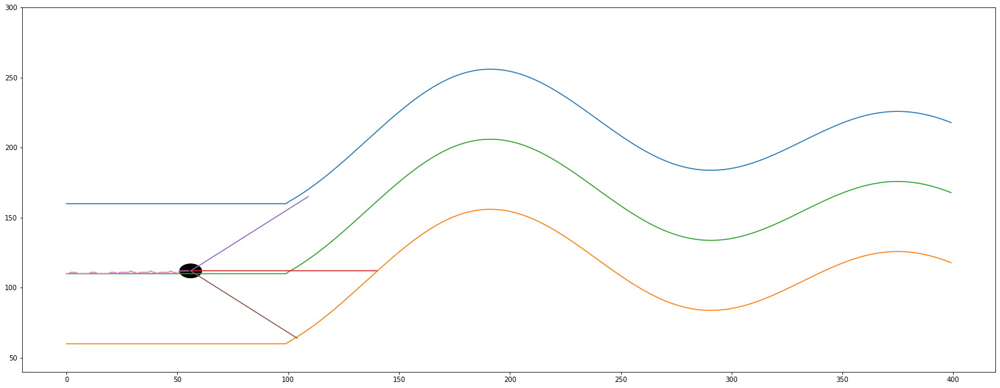

------------------------------ IF i % 3 == 2 ------------------------------
# i =  56
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  86
Sensor from right wall =  49
most távolsagra van a felső faltól =  47.0
most távolsagra van az alsó faltól =  53.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  56
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  3.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  57
			 len(self.sensor_left)   =  57
			 len(self.sensor_center) =  57
			 len(self.sensor_right)  =  57
			 self.x                  =  56
			 -------------- Teszt End ----------

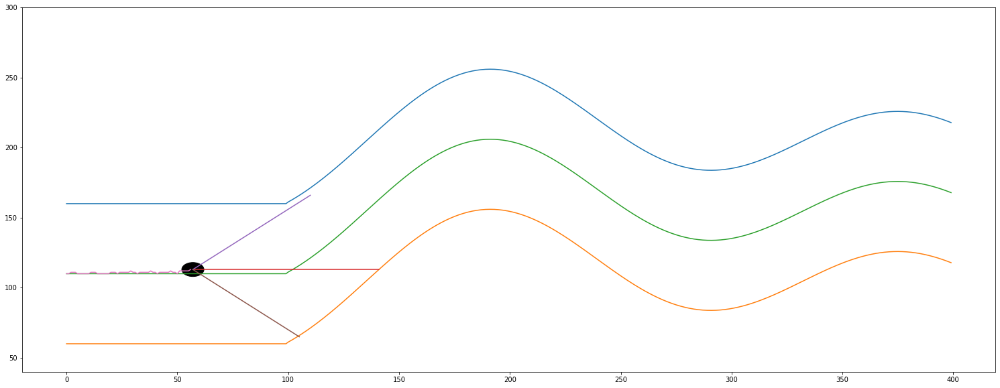

------------------------------ IF i % 3 == 0 ------------------------------
# i =  57
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (58, 3)
y.shape =  (58, 1)
i       =  57
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  57
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1.]
(25, 4)
(25, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  52.])

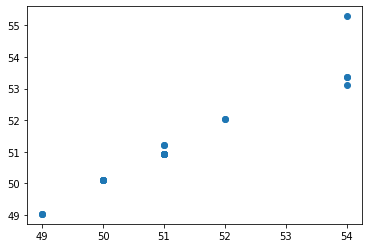

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00339558 0.8066856 ]]


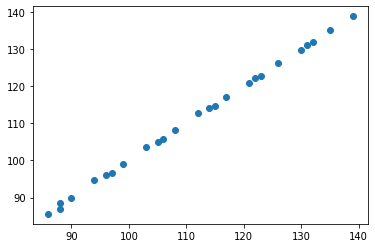

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.07591049 0.90939008]]


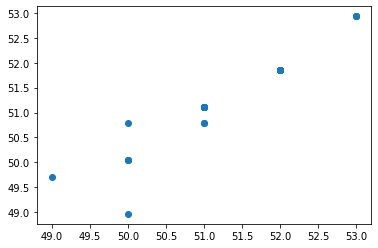

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-4.15896739]]
-------- 1 y up ->  center =  [[1.32036083]]
-------- 1 y up ->  right  =  [[-1.93769197]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[85 -3]]
		 _X_right  =  [[49 -3]]
		 predicted_left   =  [[57.19293478]]
		 predicted_center =  [[82.37884734]]
		 predicted_right  =  [[46.06845108]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.08559783 -0.95380435]]
		 regression_center.coef_ =  [[1.00339558 0.8066856 ]]
		 regression_right.coef_  =  [[1.07

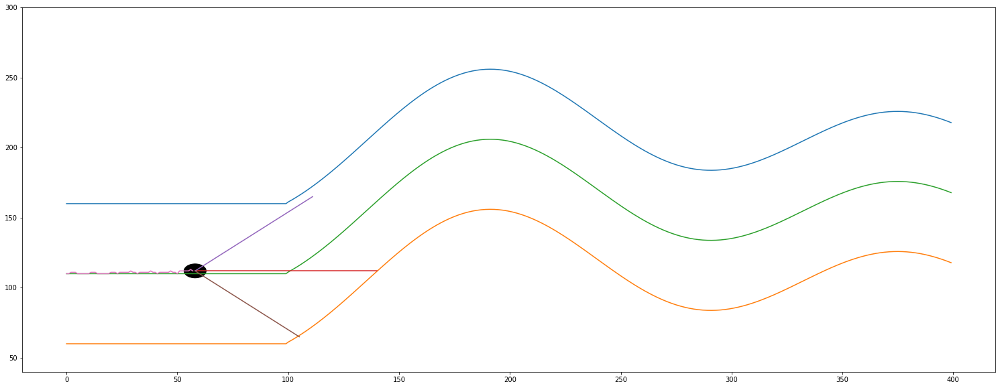

------------------------------ IF i % 3 == 1 ------------------------------
# i =  58
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 83 48]]
actual predicted =  [[0.77816842]]
actual self.y_distance[-1] =  2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0]
len(self.y_distance_real)      =  13
len(self.y_distance_predicted) =  13


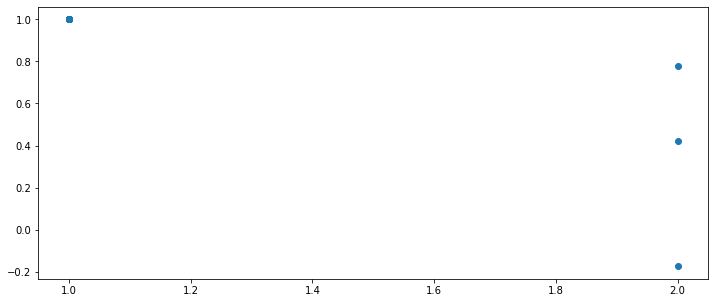

(59, 1)
(59, 1)


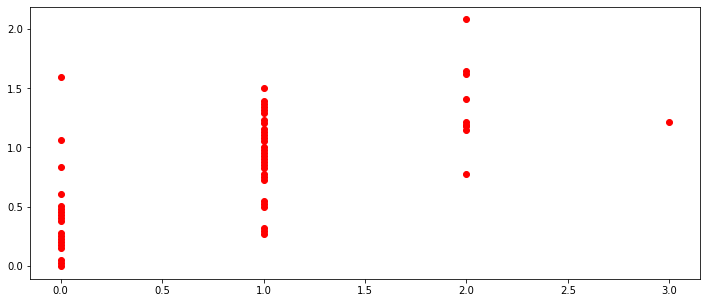

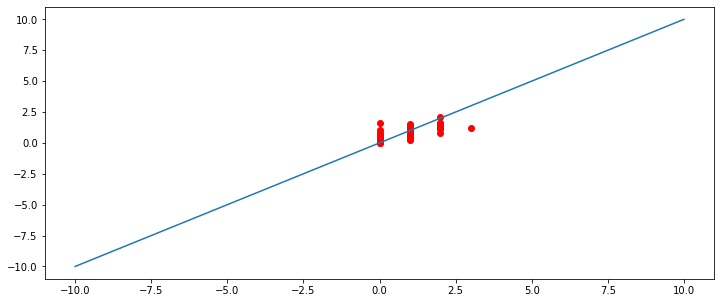

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
112.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++++

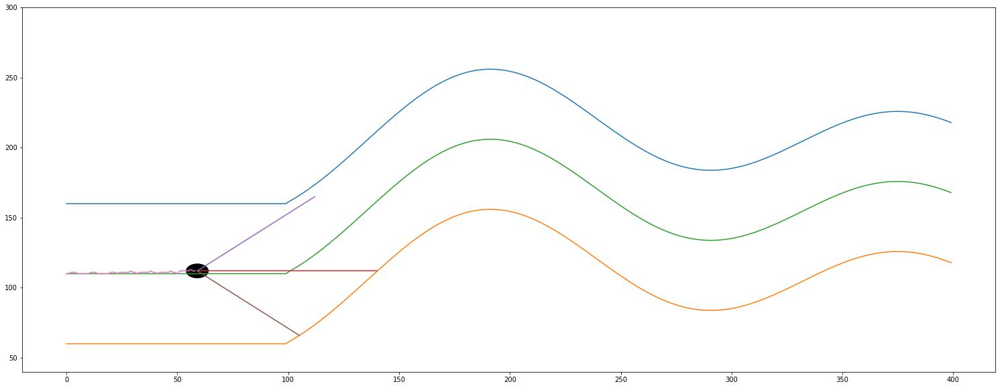

------------------------------ IF i % 3 == 2 ------------------------------
# i =  59
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  82
Sensor from right wall =  47
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  59
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  60
			 len(self.sensor_left)   =  60
			 len(self.sensor_center) =  60
			 len(self.sensor_right)  =  60
			 self.x                  =  59
			 -------------- Teszt End --------

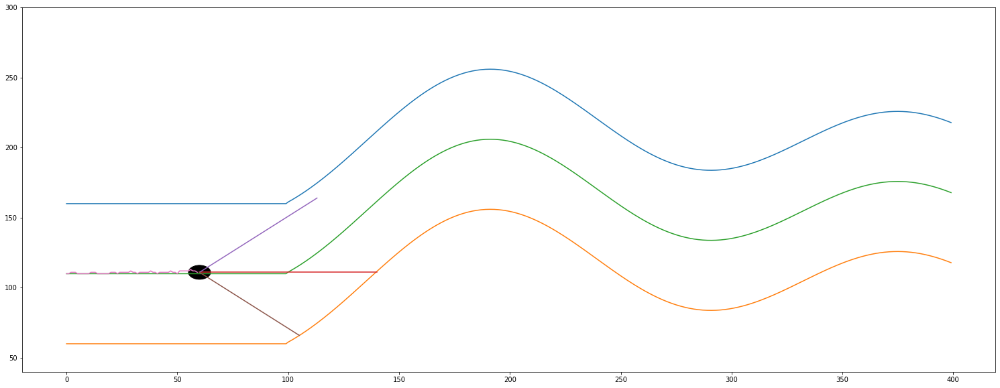

------------------------------ IF i % 3 == 0 ------------------------------
# i =  60
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (61, 3)
y.shape =  (61, 1)
i       =  60
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  60
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1.]
(26, 4)
(26, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 115.,  5

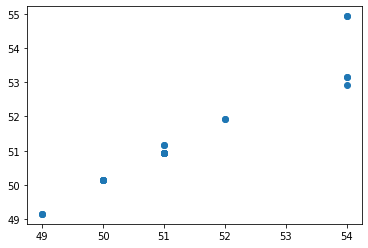

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99944749 0.76950702]]


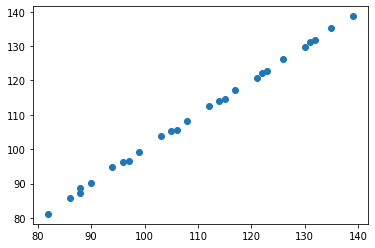

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.91855204 0.83049078]]


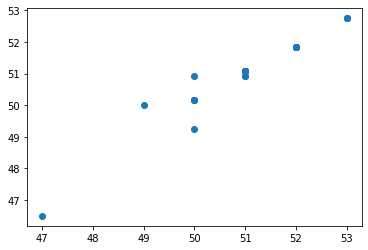

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.007643]]
-------- 1 y up ->  center =  [[1.7528288]]
-------- 1 y up ->  right  =  [[5.90602158]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[81 -3]]
		 _X_right  =  [[46 -3]]
		 predicted_left   =  [[56.70364892]]
		 predicted_center =  [[78.63059989]]
		 predicted_right  =  [[43.9189001]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.00320513 -0.88535503]]
		 regression_center.coef_ =  [[0.99944749 0.76950702]]
		 regression_right.coef_  =  [[0.9185520

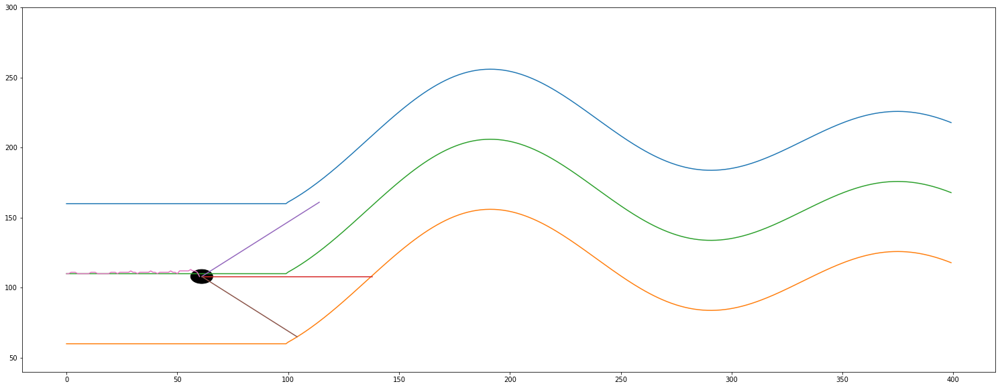

------------------------------ IF i % 3 == 1 ------------------------------
# i =  61
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 78 44]]
actual predicted =  [[0.91045184]]
actual self.y_distance[-1] =  -2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0]
len(self.y_distance_real)      =  14
len(self.y_distance_predicted) =  14


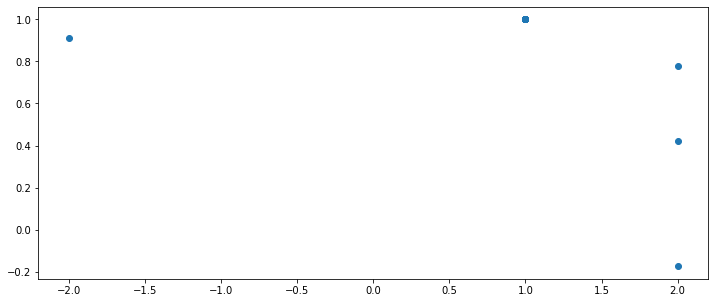

(62, 1)
(62, 1)


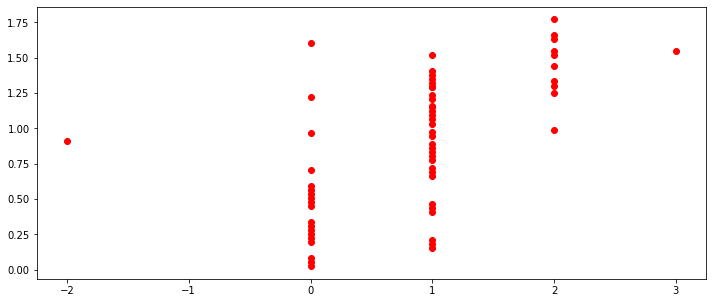

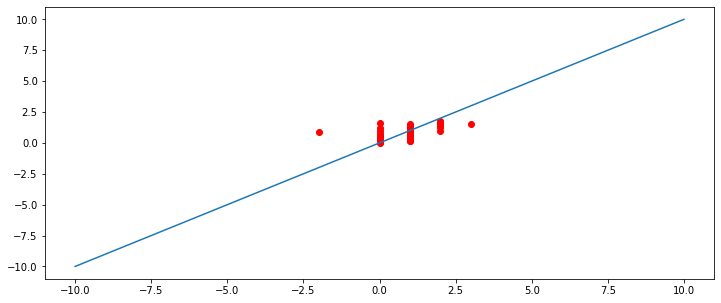

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
108.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége +++++++++++++++++++++++++++++++++++++++++++++++++

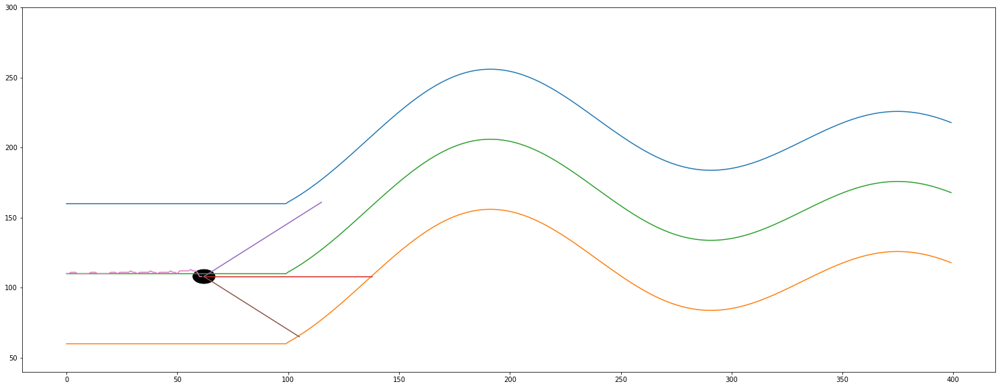

------------------------------ IF i % 3 == 2 ------------------------------
# i =  62
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  76
Sensor from right wall =  43
most távolsagra van a felső faltól =  53.0
most távolsagra van az alsó faltól =  47.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  62
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -3.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -3.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  63
			 len(self.sensor_left)   =  63
			 len(self.sensor_center) =  63
			 len(self.sensor_right)  =  63
			 self.x                  =  62
			 -------------- Teszt End -----

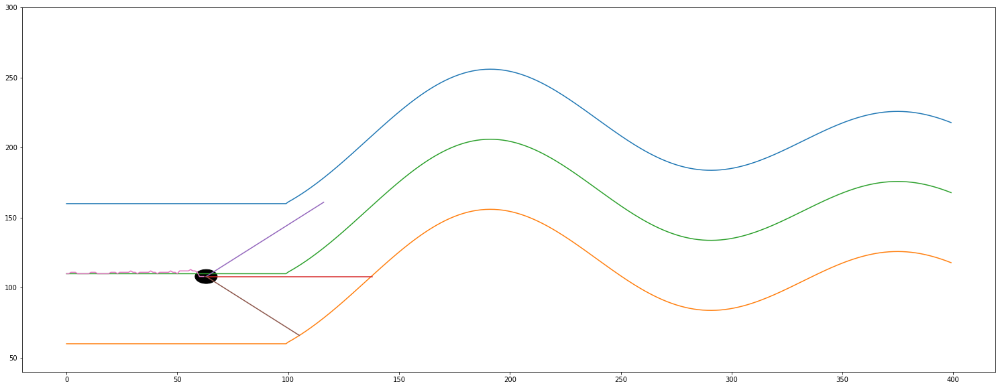

------------------------------ IF i % 3 == 0 ------------------------------
# i =  63
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (64, 3)
y.shape =  (64, 1)
i       =  63
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  63
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(28, 4)
(28, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  50., 

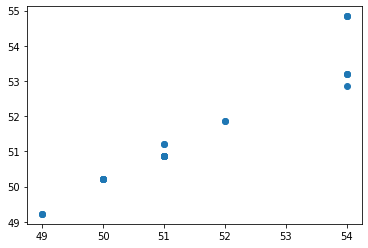

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99900527 0.7861406 ]]


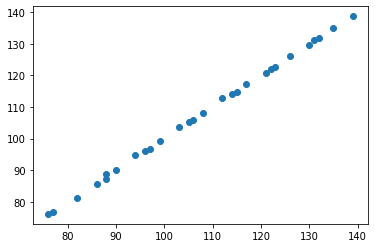

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9795501  0.85276074]]


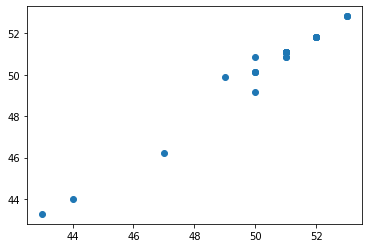

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[0.5575307]]
-------- 1 y up ->  center =  [[1.82079299]]
-------- 1 y up ->  right  =  [[2.86503067]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[76 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[56.47769877]]
		 predicted_center =  [[73.60162576]]
		 predicted_right  =  [[40.59509202]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.99321267 -0.81997414]]
		 regression_center.coef_ =  [[0.99900527 0.7861406 ]]
		 regression_right.coef_  =  [[0.97955

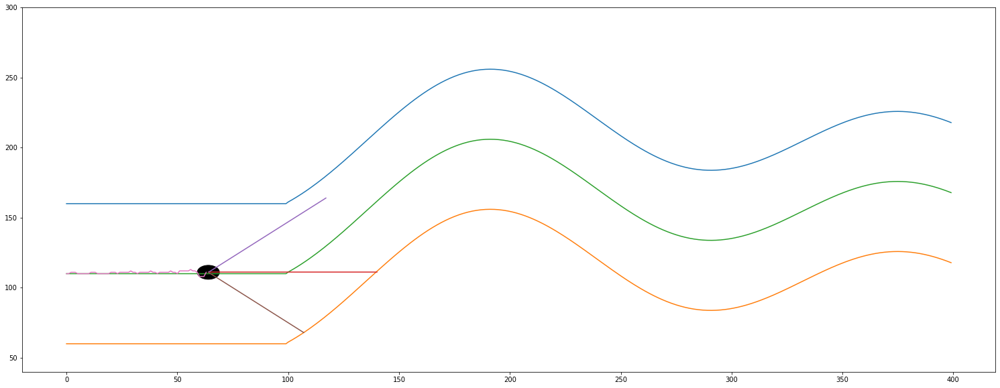

------------------------------ IF i % 3 == 1 ------------------------------
# i =  64
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 77 44]]
actual predicted =  [[-1.19078294]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0]
len(self.y_distance_real)      =  15
len(self.y_distance_predicted) =  15


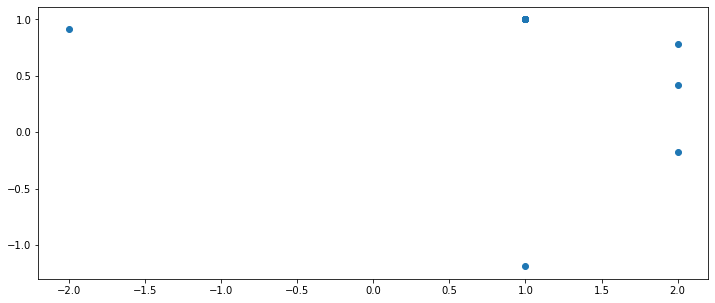

(65, 1)
(65, 1)


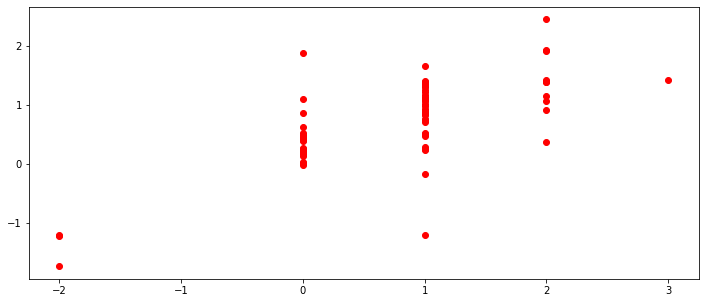

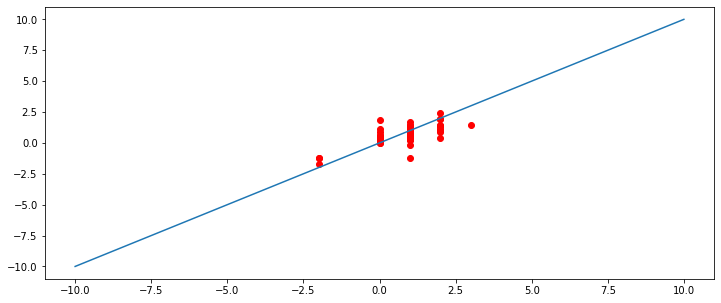

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége ++++++++++++++++++++++++++++

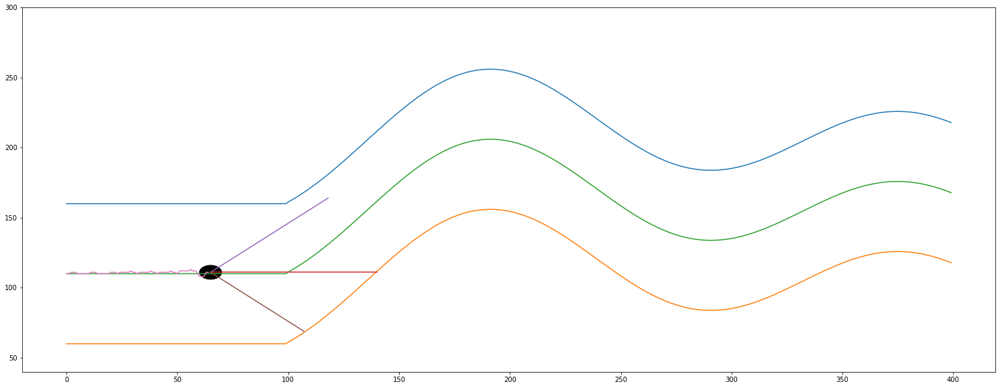

------------------------------ IF i % 3 == 2 ------------------------------
# i =  65
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  76
Sensor from right wall =  44
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  65
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  66
			 len(self.sensor_left)   =  66
			 len(self.sensor_center) =  66
			 len(self.sensor_right)  =  66
			 self.x                  =  65
			 -------------- Teszt End ----------

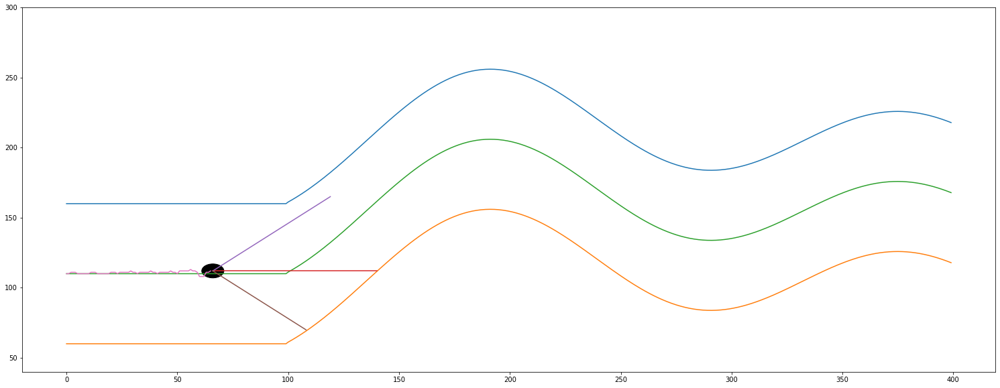

------------------------------ IF i % 3 == 0 ------------------------------
# i =  66
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (67, 3)
y.shape =  (67, 1)
i       =  66
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  66
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(29, 4)
(29, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.,  5

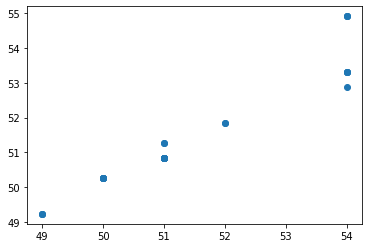

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00120557 0.7626769 ]]


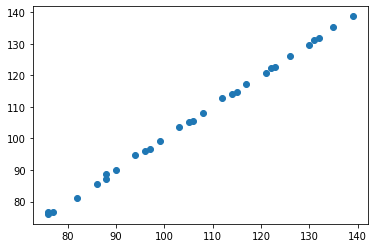

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.97977053 0.852657  ]]


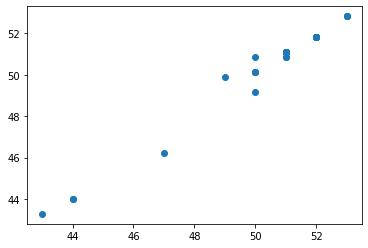

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[-0.73279689]]
-------- 1 y up ->  center =  [[1.54016215]]
-------- 1 y up ->  right  =  [[2.85386473]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[75 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[56.51553829]]
		 predicted_center =  [[72.57866675]]
		 predicted_right  =  [[40.59359903]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.01970033 -0.80105438]]
		 regression_center.coef_ =  [[1.00120557 0.7626769 ]]
		 regression_right.coef_  =  [[0.979

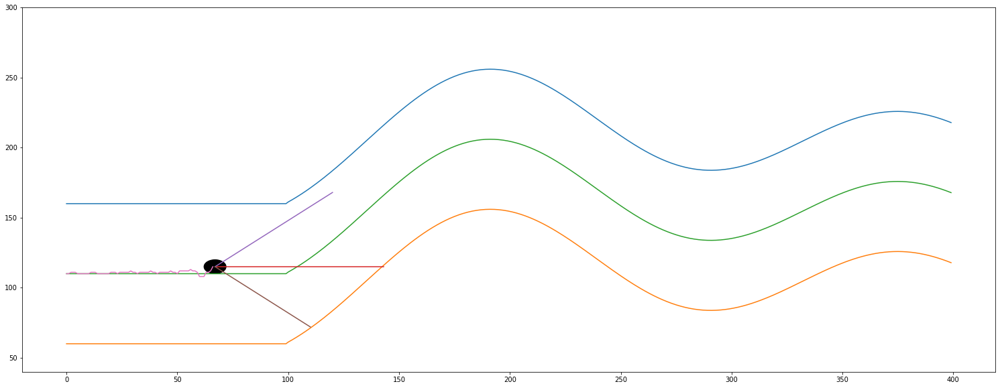

------------------------------ IF i % 3 == 1 ------------------------------
# i =  67
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 77 44]]
actual predicted =  [[0.01588199]]
actual self.y_distance[-1] =  5.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0]
len(self.y_distance_real)      =  16
len(self.y_distance_predicted) =  16


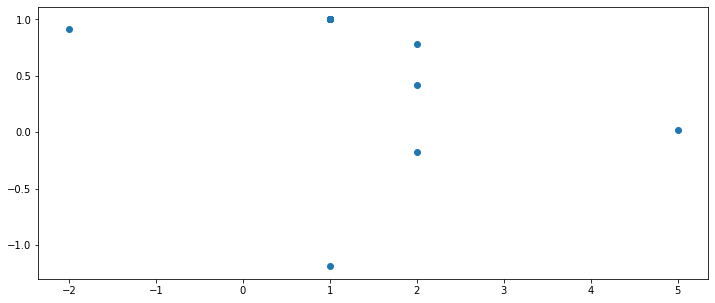

(68, 1)
(68, 1)


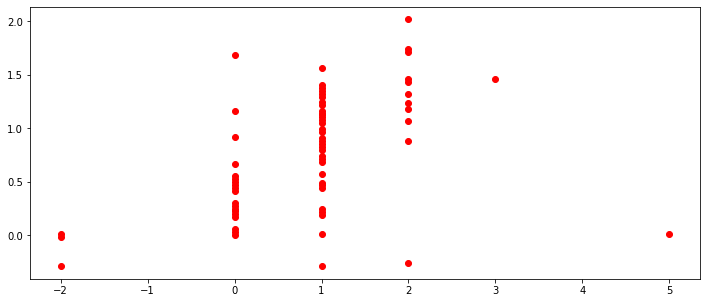

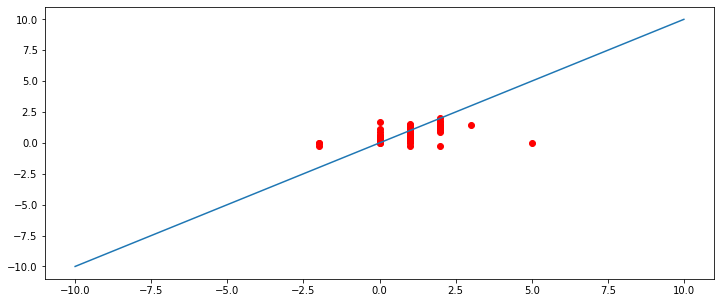

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
115.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A run ciklus vége +++++++

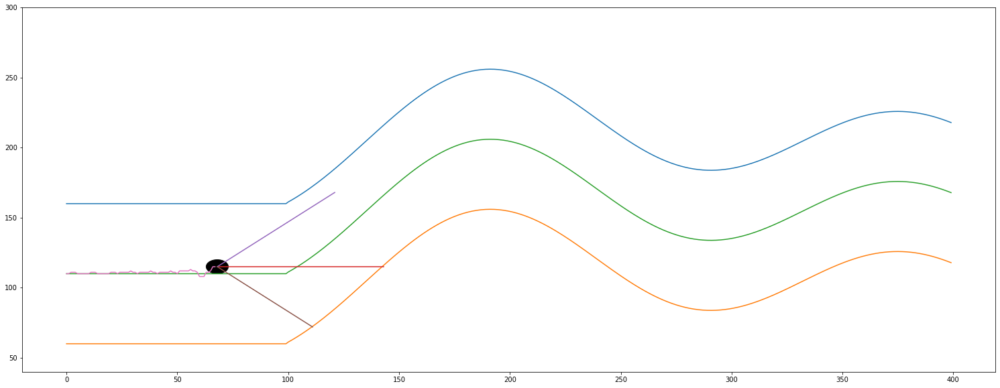

------------------------------ IF i % 3 == 2 ------------------------------
# i =  68
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  75
Sensor from right wall =  43
most távolsagra van a felső faltól =  46.0
most távolsagra van az alsó faltól =  54.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  68
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  4.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  4.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  69
			 len(self.sensor_left)   =  69
			 len(self.sensor_center) =  69
			 len(self.sensor_right)  =  69
			 self.x                  =  68
			 -------------- Teszt End --------

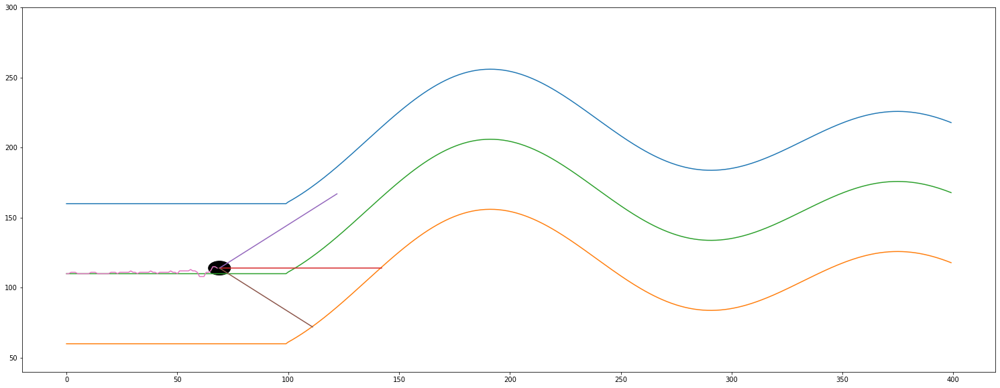

------------------------------ IF i % 3 == 0 ------------------------------
# i =  69
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (70, 3)
y.shape =  (70, 1)
i       =  69
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  69
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(30, 4)
(30, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), array([111.

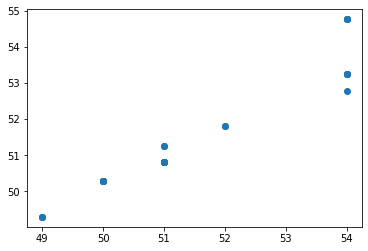

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00148273 0.76607357]]


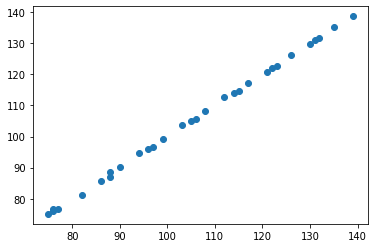

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.98731988 0.86370797]]


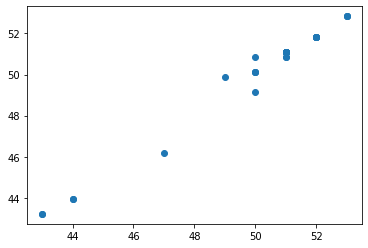

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[0.88752914]]
-------- 1 y up ->  center =  [[1.5110787]]
-------- 1 y up ->  right  =  [[2.48545629]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[74 -3]]
		 _X_right  =  [[43 -3]]
		 predicted_left   =  [[56.2958042]]
		 predicted_center =  [[71.55502381]]
		 predicted_right  =  [[40.49805956]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98776224 -0.76421911]]
		 regression_center.coef_ =  [[1.00148273 0.76607357]]
		 regression_right.coef_  =  [[0.987319

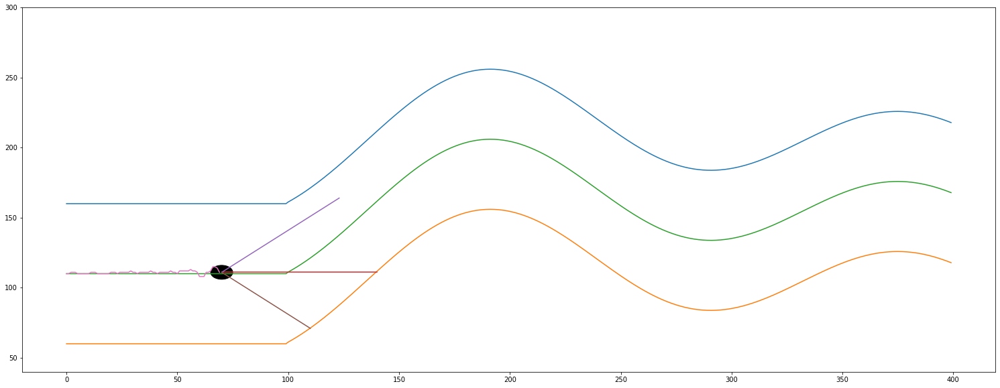

------------------------------ IF i % 3 == 1 ------------------------------
# i =  70
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 71 41]]
actual predicted =  [[1.19402687]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0]
len(self.y_distance_real)      =  17
len(self.y_distance_predicted) =  17


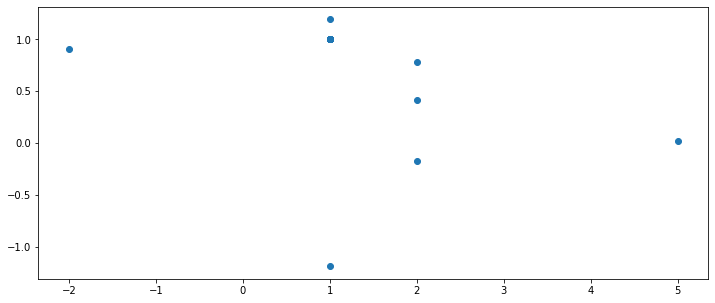

(71, 1)
(71, 1)


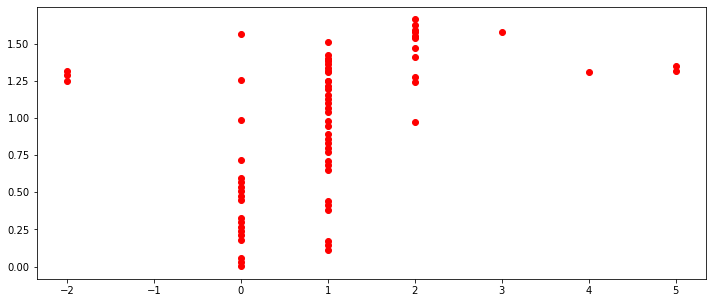

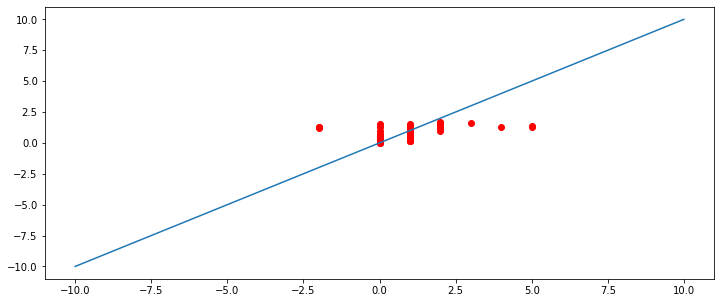

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_taken         =  0
# A ru

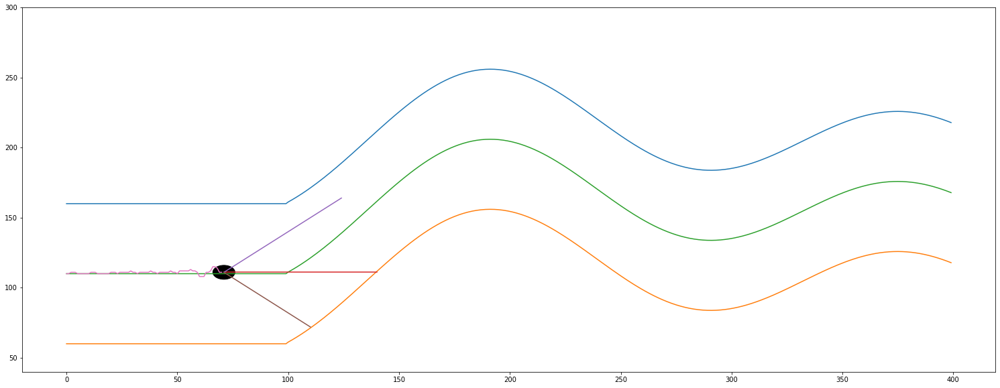

------------------------------ IF i % 3 == 2 ------------------------------
# i =  71
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  69
Sensor from right wall =  40
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  71
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  72
			 len(self.sensor_left)   =  72
			 len(self.sensor_center) =  72
			 len(self.sensor_right)  =  72
			 self.x                  =  71
			 -------------- Teszt End -------

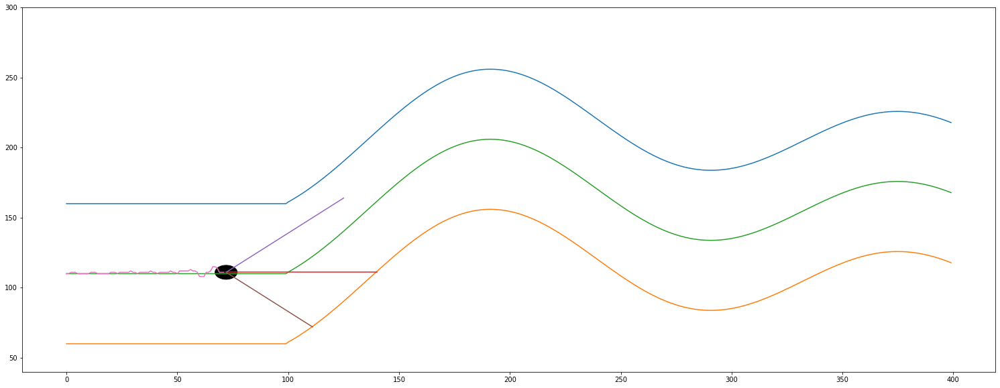

------------------------------ IF i % 3 == 0 ------------------------------
# i =  72
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (73, 3)
y.shape =  (73, 1)
i       =  72
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  72
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(32, 4)
(32, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]), arr

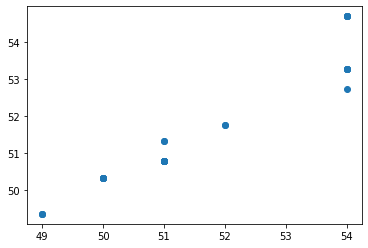

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00068535 0.78101441]]


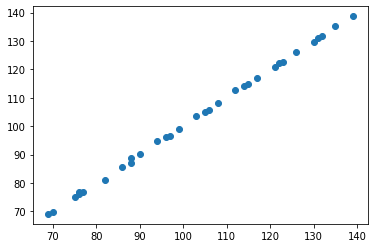

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99211661 0.81077551]]


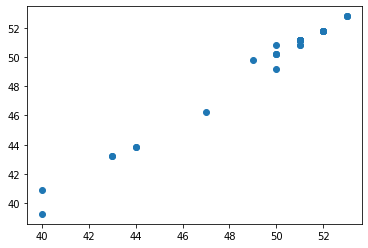

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.10968661]]
-------- 1 y up ->  center =  [[1.61716561]]
-------- 1 y up ->  right  =  [[2.19238063]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[69 -3]]
		 _X_right  =  [[40 -3]]
		 predicted_left   =  [[56.14245014]]
		 predicted_center =  [[66.539712]]
		 predicted_right  =  [[37.64182657]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98433048 -0.71581197]]
		 regression_center.coef_ =  [[1.00068535 0.78101441]]
		 regression_right.coef_  =  [[0.992116

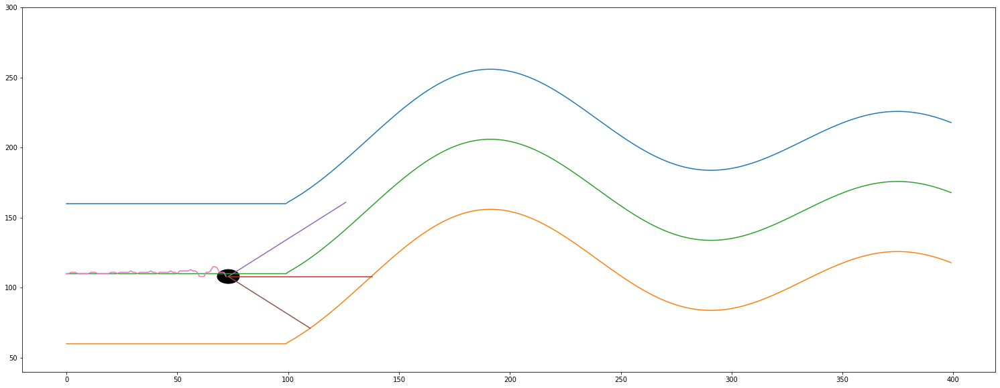

------------------------------ IF i % 3 == 1 ------------------------------
# i =  73
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 66 38]]
actual predicted =  [[0.94904278]]
actual self.y_distance[-1] =  -2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0]
len(self.y_distance_real)      =  18
len(self.y_distance_predicted) =  18


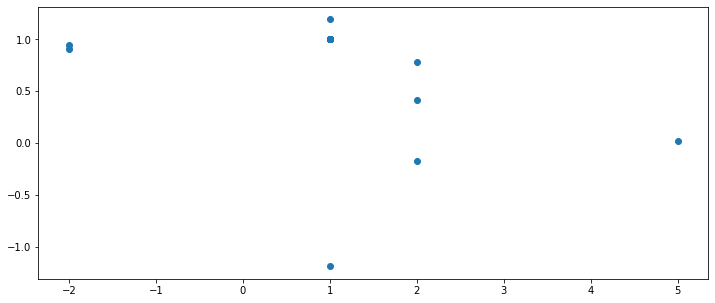

(74, 1)
(74, 1)


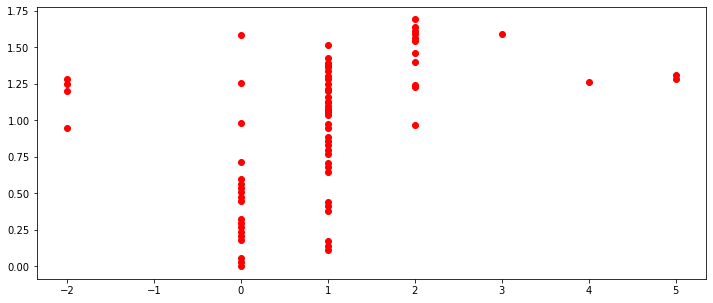

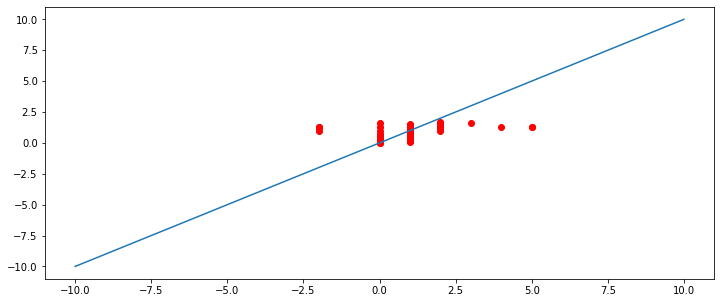

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
108.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _summary_action_were_take

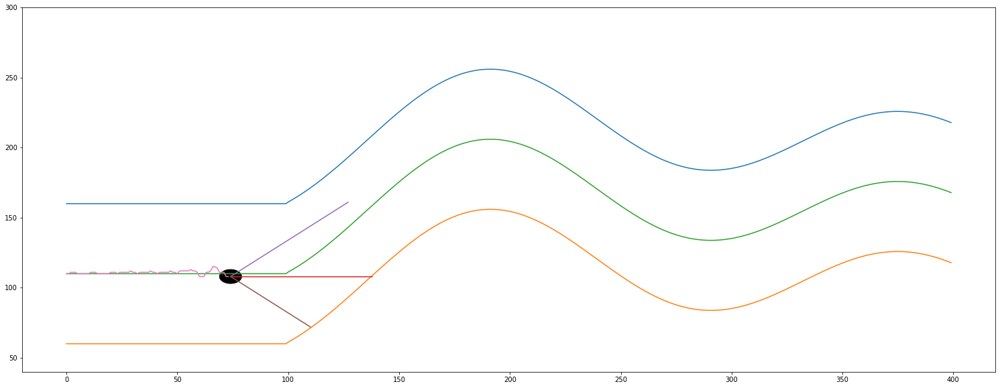

------------------------------ IF i % 3 == 2 ------------------------------
# i =  74
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  65
Sensor from right wall =  38
most távolsagra van a felső faltól =  51.0
most távolsagra van az alsó faltól =  49.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  74
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  75
			 len(self.sensor_left)   =  75
			 len(self.sensor_center) =  75
			 len(self.sensor_right)  =  75
			 self.x                  =  74
			 -------------- Teszt End --------

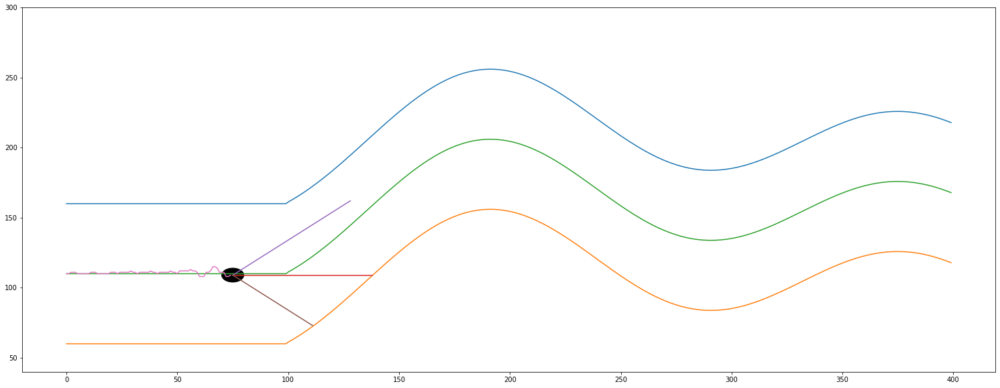

------------------------------ IF i % 3 == 0 ------------------------------
# i =  75
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (76, 3)
y.shape =  (76, 1)
i       =  75
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  75
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(33, 4)
(33, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52.]),

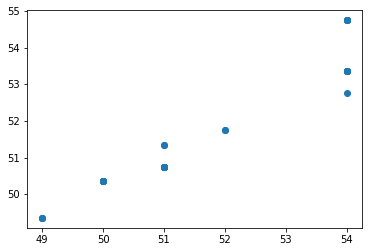

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00229804 0.7628501 ]]


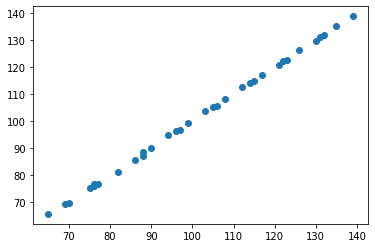

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99024397 0.81238347]]


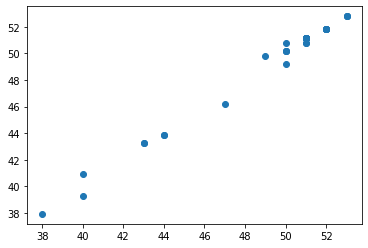

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[0.35294118]]
-------- 1 y up ->  center =  [[1.41644397]]
-------- 1 y up ->  right  =  [[2.28665406]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[64 -3]]
		 _X_right  =  [[37 -3]]
		 predicted_left   =  [[56.14705882]]
		 predicted_center =  [[61.50981995]]
		 predicted_right  =  [[34.68590299]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 1.         -0.69852941]]
		 regression_center.coef_ =  [[1.00229804 0.7628501 ]]
		 regression_right.coef_  =  [[0.9902

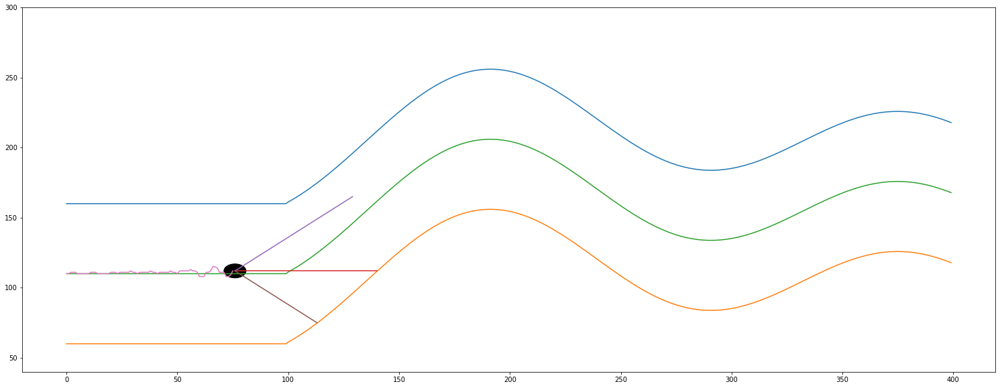

------------------------------ IF i % 3 == 1 ------------------------------
# i =  76
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 65 38]]
actual predicted =  [[-0.16070293]]
actual self.y_distance[-1] =  2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0]
len(self.y_distance_real)      =  19
len(self.y_distance_predicted) =  19


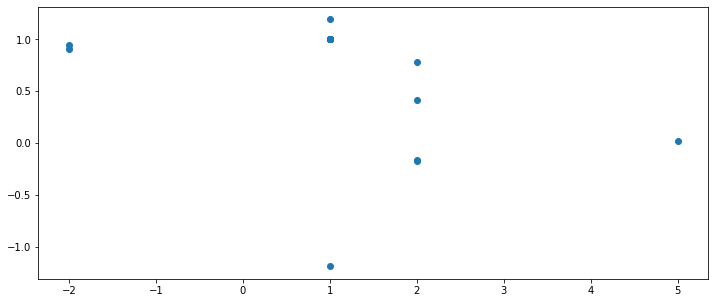

(77, 1)
(77, 1)


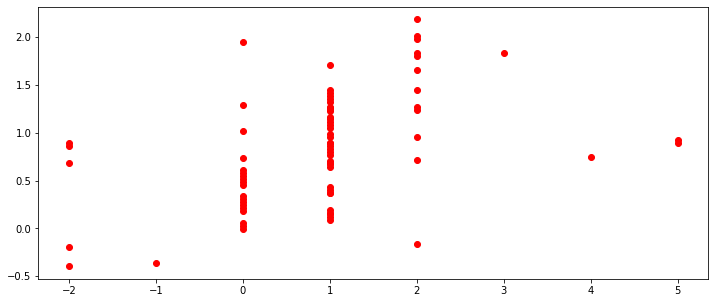

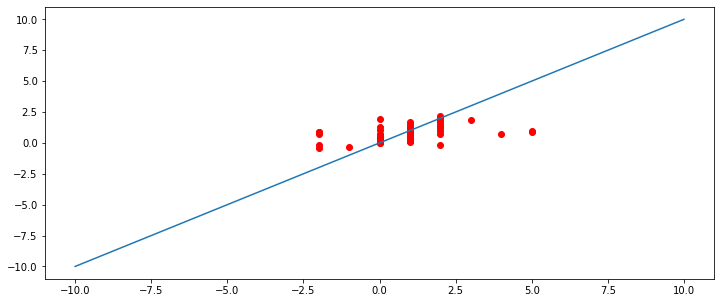

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
112.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas      =  0
# 			 _sum

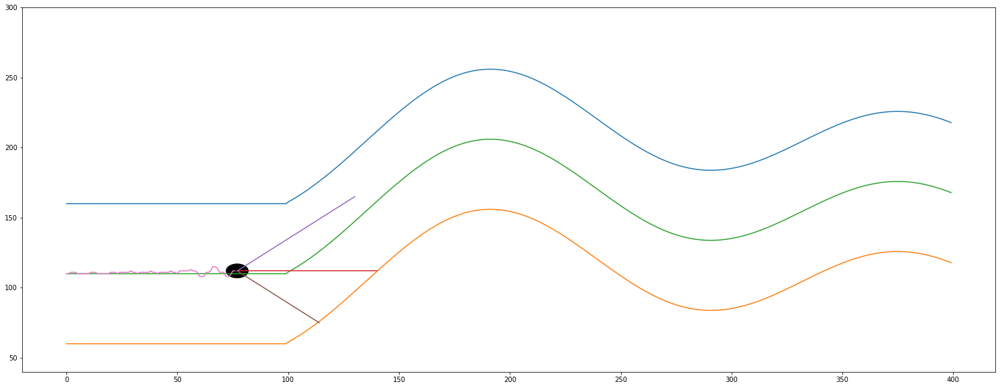

------------------------------ IF i % 3 == 2 ------------------------------
# i =  77
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  64
Sensor from right wall =  37
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  77
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  78
			 len(self.sensor_left)   =  78
			 len(self.sensor_center) =  78
			 len(self.sensor_right)  =  78
			 self.x                  =  77
			 -------------- Teszt End --------

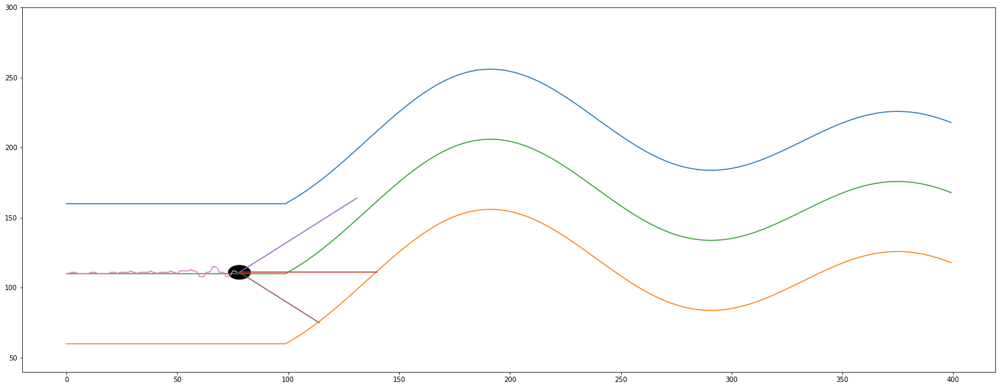

------------------------------ IF i % 3 == 0 ------------------------------
# i =  78
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (79, 3)
y.shape =  (79, 1)
i       =  78
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  78
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(34, 4)
(34, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 118.,  52

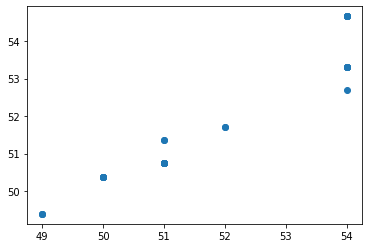

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.0001333  0.73524707]]


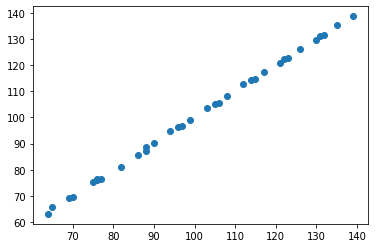

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.9950351 0.8223612]]


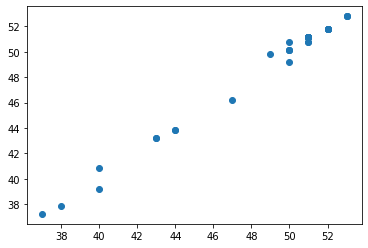

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.27241233]]
-------- 1 y up ->  center =  [[1.6336819]]
-------- 1 y up ->  right  =  [[2.05921629]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[63 -3]]
		 _X_right  =  [[37 -3]]
		 predicted_left   =  [[56.01003959]]
		 predicted_center =  [[60.70095814]]
		 predicted_right  =  [[34.59103498]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98197115 -0.67328903]]
		 regression_center.coef_ =  [[1.0001333  0.73524707]]
		 regression_right.coef_  =  [[0.99503

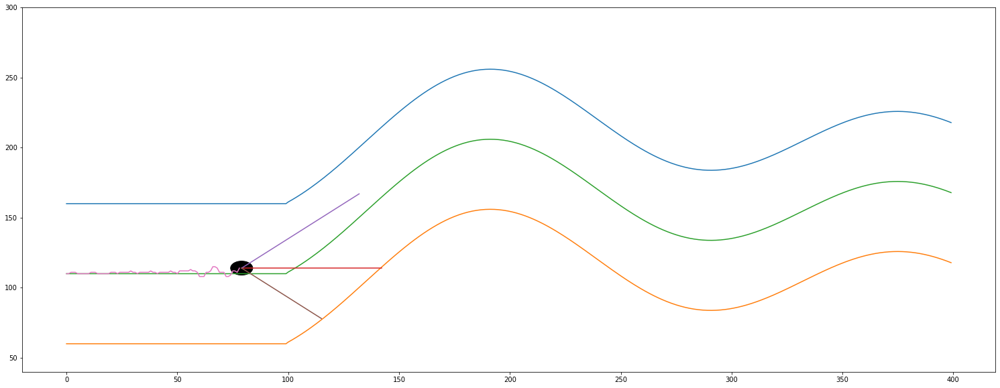

------------------------------ IF i % 3 == 1 ------------------------------
# i =  79
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 64 37]]
actual predicted =  [[0.24438788]]
actual self.y_distance[-1] =  4.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0]
len(self.y_distance_real)      =  20
len(self.y_distance_predicted) =  20


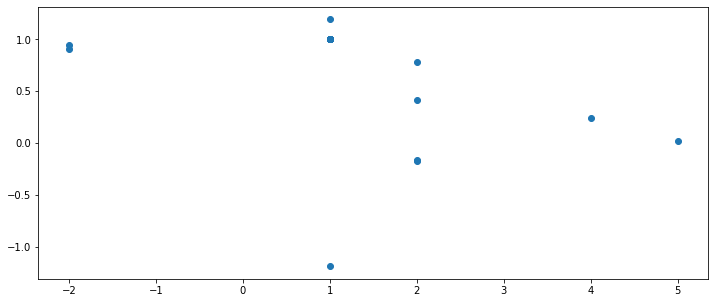

(80, 1)
(80, 1)


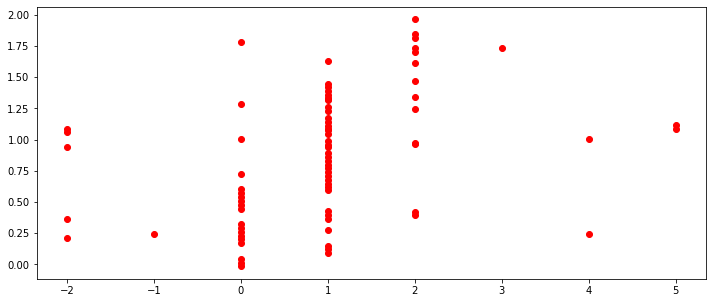

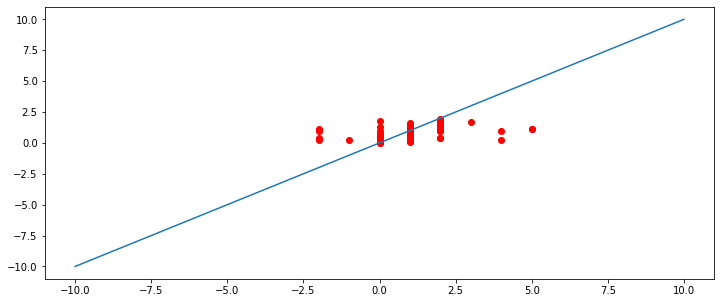

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
114.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary_mesterseges_mozgatas

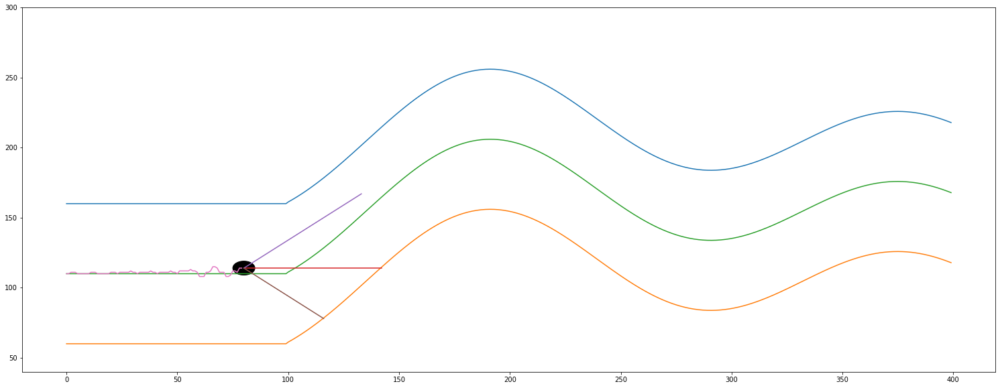

------------------------------ IF i % 3 == 2 ------------------------------
# i =  80
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  62
Sensor from right wall =  36
most távolsagra van a felső faltól =  47.0
most távolsagra van az alsó faltól =  53.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  80
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  3.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  3.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  81
			 len(self.sensor_left)   =  81
			 len(self.sensor_center) =  81
			 len(self.sensor_right)  =  81
			 self.x                  =  80
			 -------------- Teszt End -------

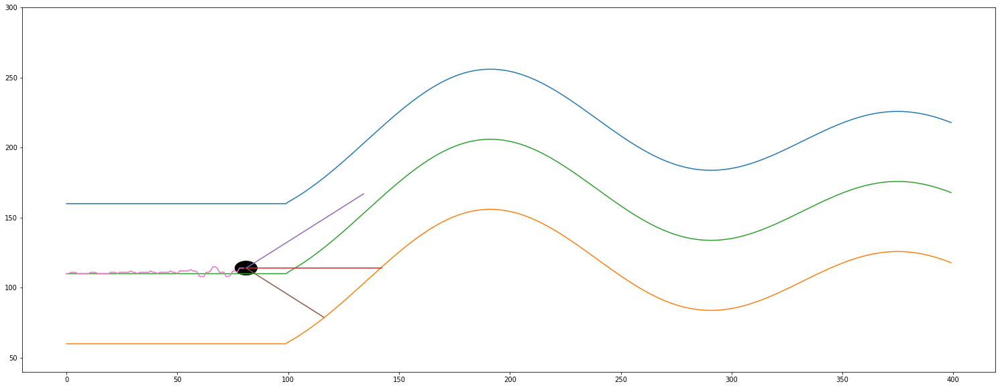

------------------------------ IF i % 3 == 0 ------------------------------
# i =  81
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (82, 3)
y.shape =  (82, 1)
i       =  81
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  81
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(36, 4)
(36, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  50., 1

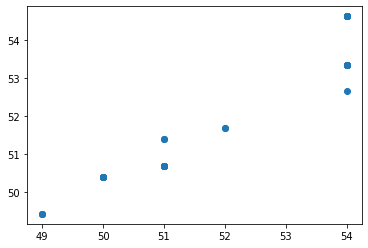

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99975604 0.75007454]]


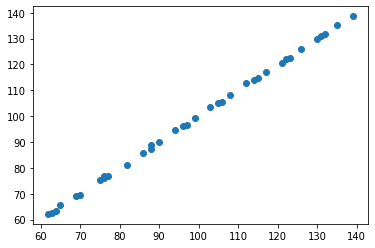

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99638699 0.83243008]]


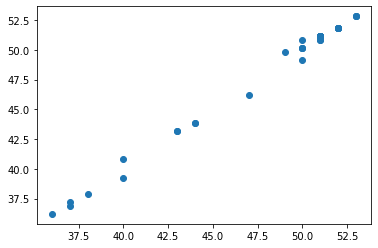

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.3983599]]
-------- 1 y up ->  center =  [[1.69061525]]
-------- 1 y up ->  right  =  [[2.00234176]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[62 -3]]
		 _X_right  =  [[36 -3]]
		 predicted_left   =  [[55.89397089]]
		 predicted_center =  [[59.67543562]]
		 predicted_right  =  [[33.5461662]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98024948 -0.63559714]]
		 regression_center.coef_ =  [[0.99975604 0.75007454]]
		 regression_right.coef_  =  [[0.996386

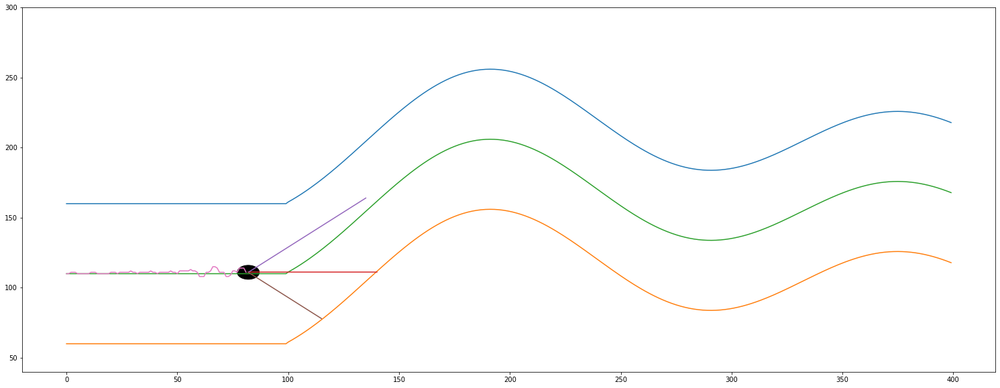

------------------------------ IF i % 3 == 1 ------------------------------
# i =  82
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 59 34]]
actual predicted =  [[1.17942234]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0]
len(self.y_distance_real)      =  21
len(self.y_distance_predicted) =  21


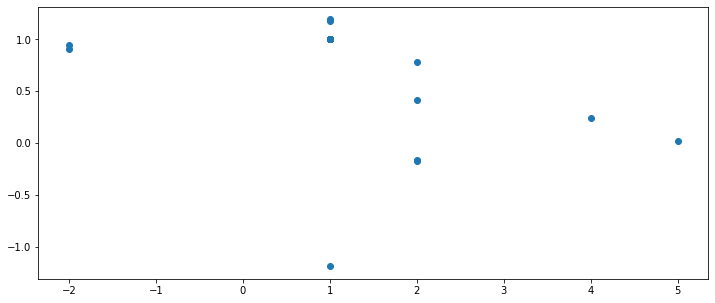

(83, 1)
(83, 1)


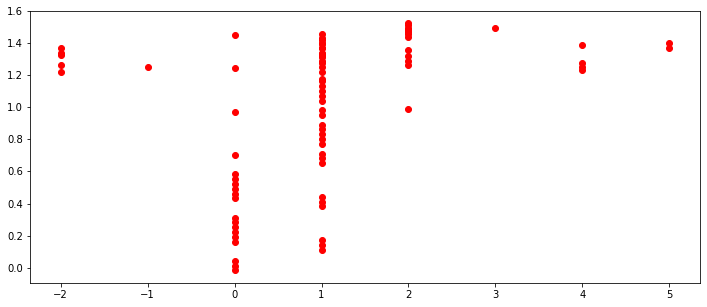

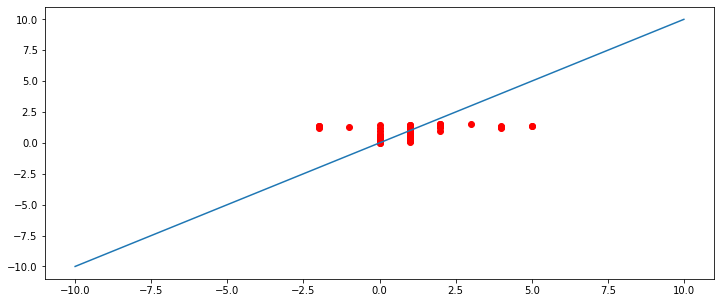

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken  =  1
# 			 _summary

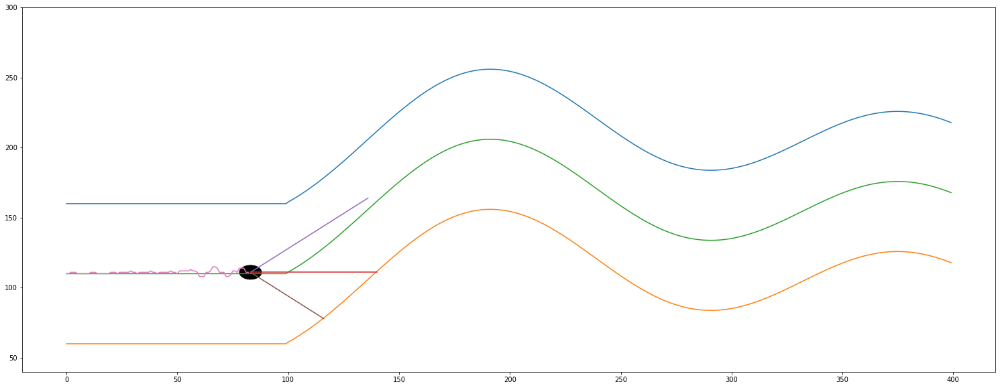

------------------------------ IF i % 3 == 2 ------------------------------
# i =  83
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  58
Sensor from right wall =  34
most távolsagra van a felső faltól =  48.0
most távolsagra van az alsó faltól =  52.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  83
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  84
			 len(self.sensor_left)   =  84
			 len(self.sensor_center) =  84
			 len(self.sensor_right)  =  84
			 self.x                  =  83
			 -------------- Teszt End ----------

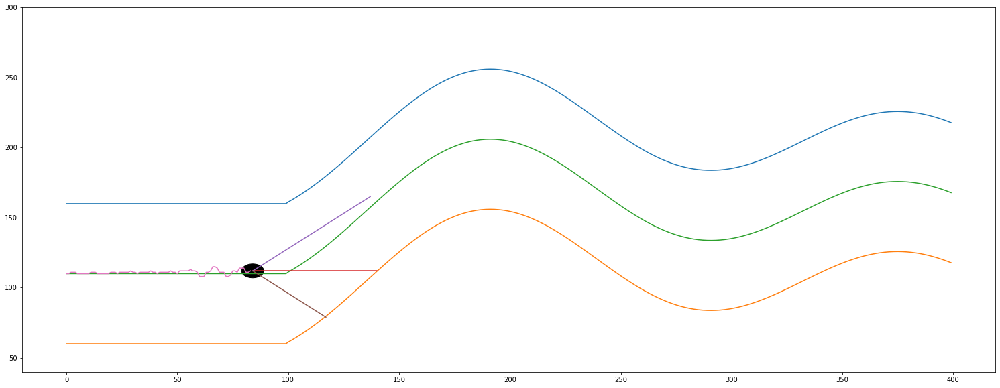

------------------------------ IF i % 3 == 0 ------------------------------
# i =  84
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (85, 3)
y.shape =  (85, 1)
i       =  84
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  84
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1.]
(37, 4)
(37, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.,  5

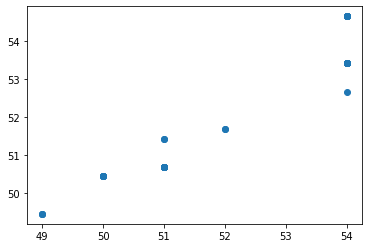

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[1.00102888 0.73325638]]


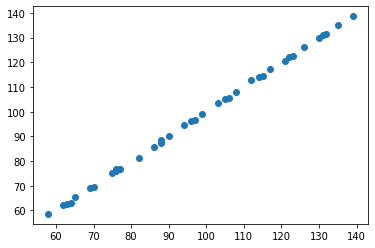

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.006423   0.81533807]]


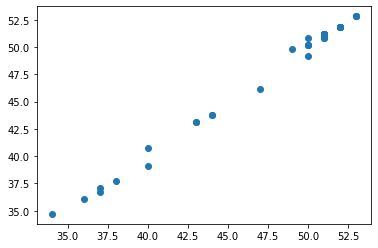

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[0.89361476]]
-------- 1 y up ->  center =  [[1.53280611]]
-------- 1 y up ->  right  =  [[1.49367756]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[57 -3]]
		 _X_right  =  [[34 -3]]
		 predicted_left   =  [[55.88778108]]
		 predicted_center =  [[54.65739806]]
		 predicted_right  =  [[31.44428434]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.99077217 -0.62081035]]
		 regression_center.coef_ =  [[1.00102888 0.73325638]]
		 regression_right.coef_  =  [[1.0064

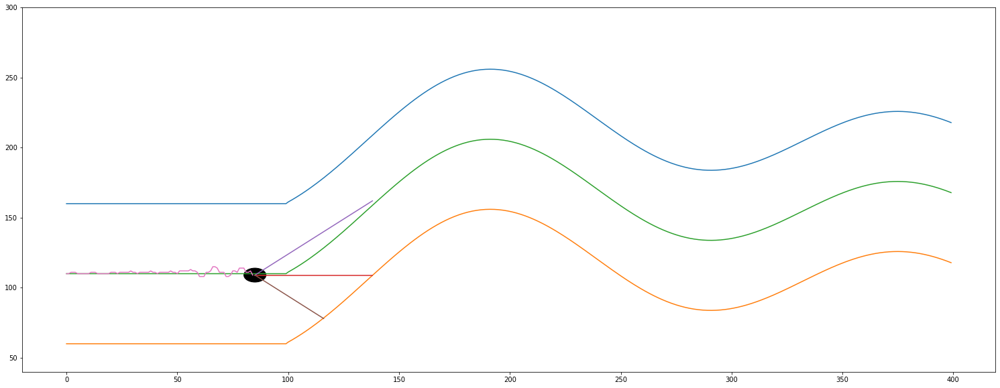

------------------------------ IF i % 3 == 1 ------------------------------
# i =  85
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 54 32]]
actual predicted =  [[1.22771515]]
actual self.y_distance[-1] =  -1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0]
len(self.y_distance_real)      =  22
len(self.y_distance_predicted) =  22


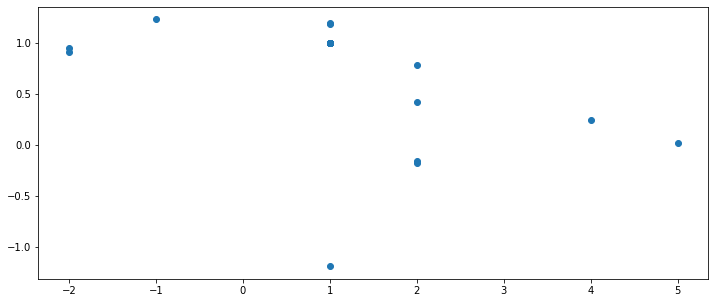

(86, 1)
(86, 1)


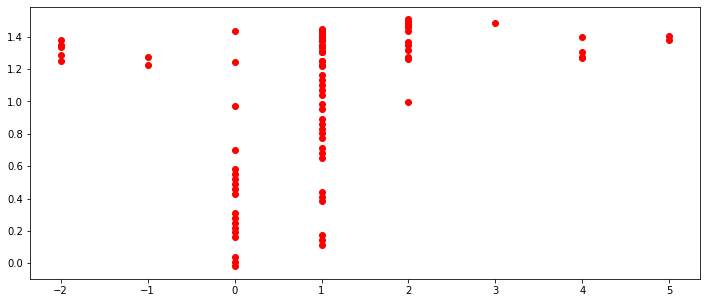

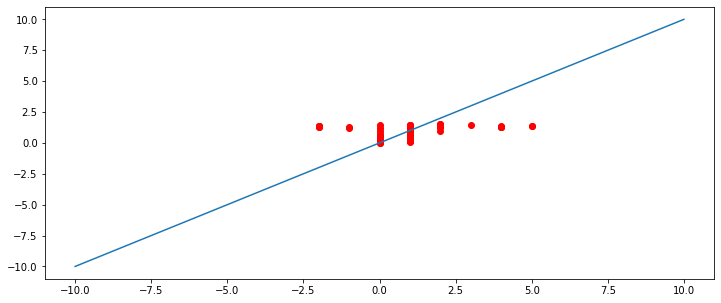

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
109.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp_prediction_was_taken

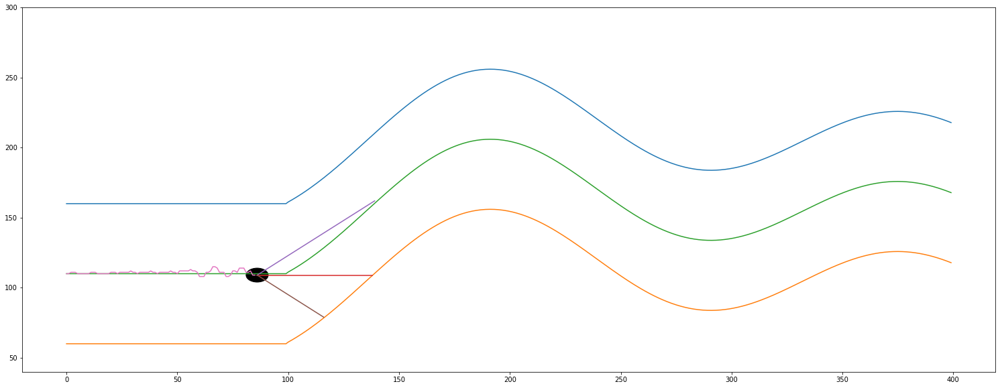

------------------------------ IF i % 3 == 2 ------------------------------
# i =  86
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  53
Sensor from right wall =  31
most távolsagra van a felső faltól =  52.0
most távolsagra van az alsó faltól =  48.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  86
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -2.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -2.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  87
			 len(self.sensor_left)   =  87
			 len(self.sensor_center) =  87
			 len(self.sensor_right)  =  87
			 self.x                  =  86
			 -------------- Teszt End ------

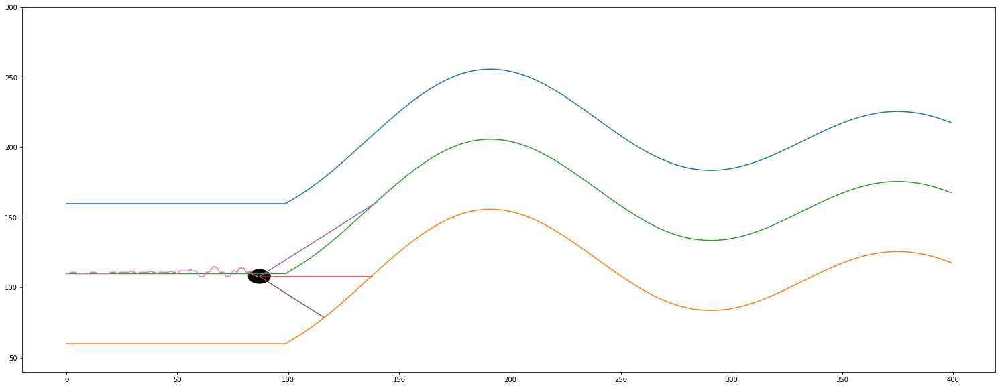

------------------------------ IF i % 3 == 0 ------------------------------
# i =  87
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (88, 3)
y.shape =  (88, 1)
i       =  87
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  87
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1.]
(38, 4)
(38, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), array([111.

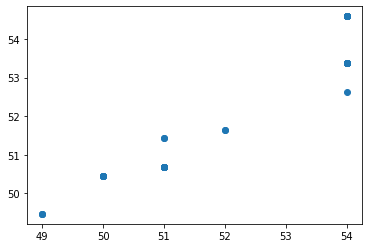

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99935545 0.7107977 ]]


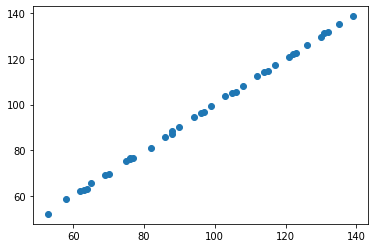

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99562436 0.78878279]]


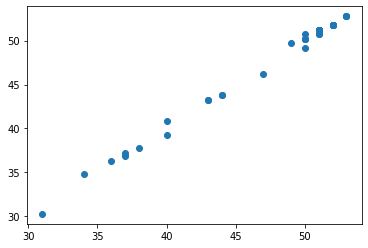

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.49966262]]
-------- 1 y up ->  center =  [[1.69345556]]
-------- 1 y up ->  right  =  [[1.99098358]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[52 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[55.7911124]]
		 predicted_center =  [[49.81739279]]
		 predicted_right  =  [[27.70895875]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97893773 -0.60193754]]
		 regression_center.coef_ =  [[0.99935545 0.7107977 ]]
		 regression_right.coef_  =  [[0.99562

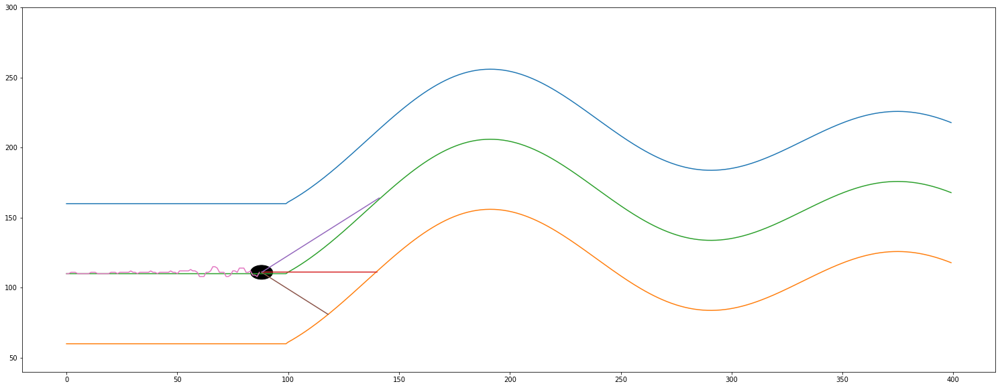

------------------------------ IF i % 3 == 1 ------------------------------
# i =  88
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 53 31]]
actual predicted =  [[0.34455388]]
actual self.y_distance[-1] =  1.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0]
len(self.y_distance_real)      =  23
len(self.y_distance_predicted) =  23


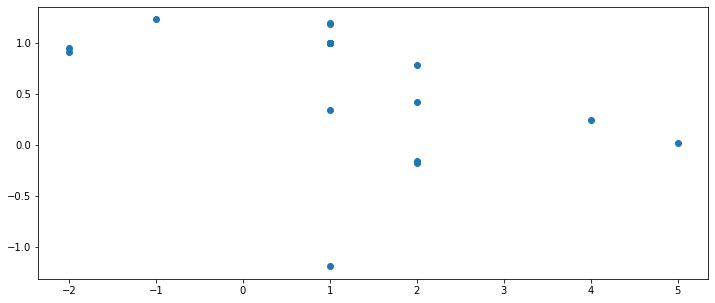

(89, 1)
(89, 1)


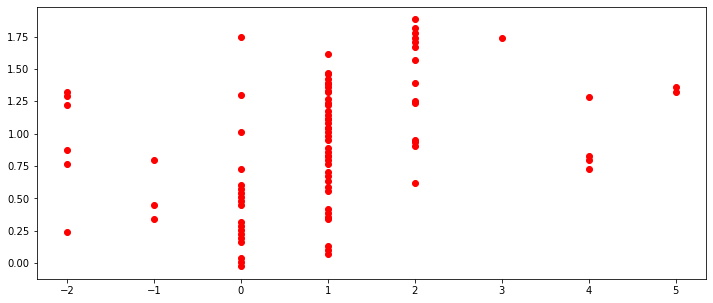

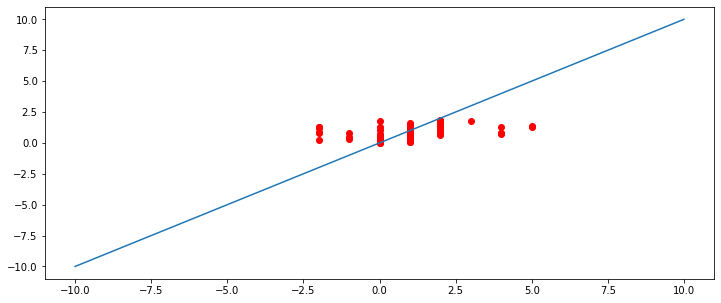

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         =  0
# 			 _summary_mlp

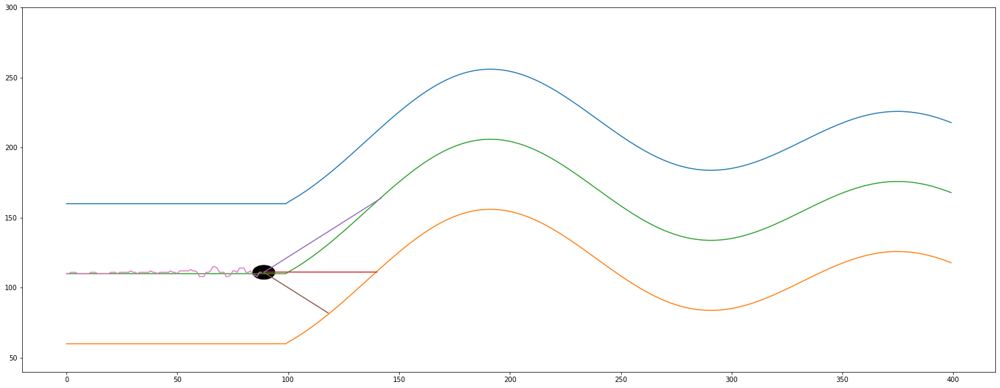

------------------------------ IF i % 3 == 2 ------------------------------
# i =  89
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  51
Sensor from right wall =  30
most távolsagra van a felső faltól =  50.0
most távolsagra van az alsó faltól =  50.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  89
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  0.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  0.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  90
			 len(self.sensor_left)   =  90
			 len(self.sensor_center) =  90
			 len(self.sensor_right)  =  90
			 self.x                  =  89
			 -------------- Teszt End -------

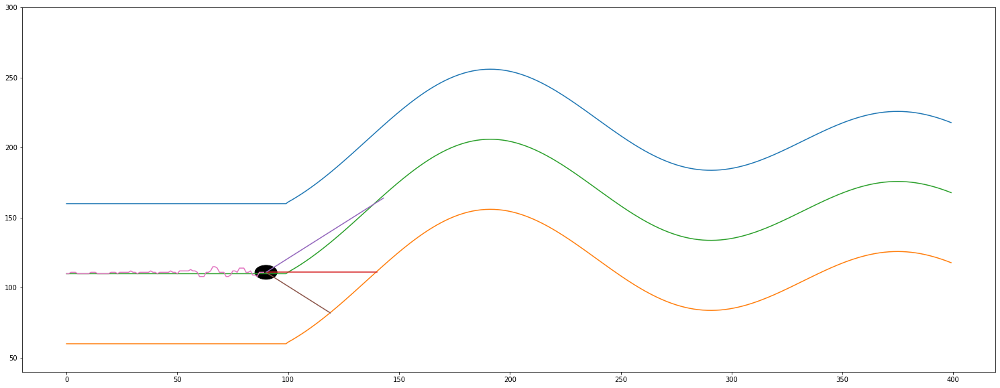

------------------------------ IF i % 3 == 0 ------------------------------
# i =  90
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (91, 3)
y.shape =  (91, 1)
i       =  90
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  90
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.]
(40, 4)
(40, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]), arr

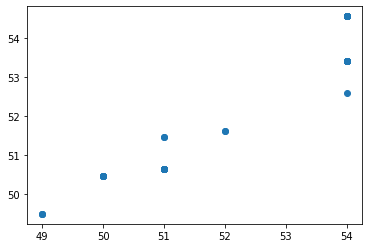

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99917555 0.72530917]]


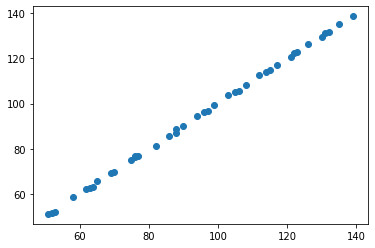

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99674055 0.74951108]]


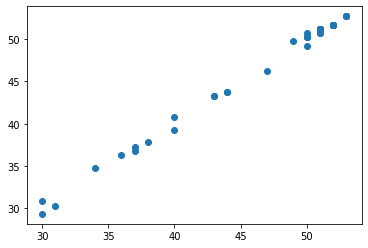

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.58346972]]
-------- 1 y up ->  center =  [[1.727251]]
-------- 1 y up ->  right  =  [[1.89732725]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[51 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[55.69918167]]
		 predicted_center =  [[48.78479181]]
		 predicted_right  =  [[27.8047588]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97790507 -0.57168576]]
		 regression_center.coef_ =  [[0.99917555 0.72530917]]
		 regression_right.coef_  =  [[0.9967405

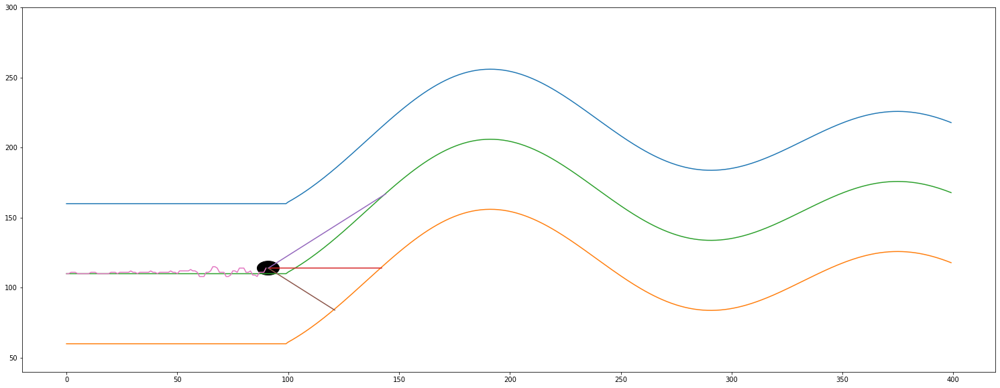

------------------------------ IF i % 3 == 1 ------------------------------
# i =  91
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 52 31]]
actual predicted =  [[0.55757173]]
actual self.y_distance[-1] =  4.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0]
len(self.y_distance_real)      =  24
len(self.y_distance_predicted) =  24


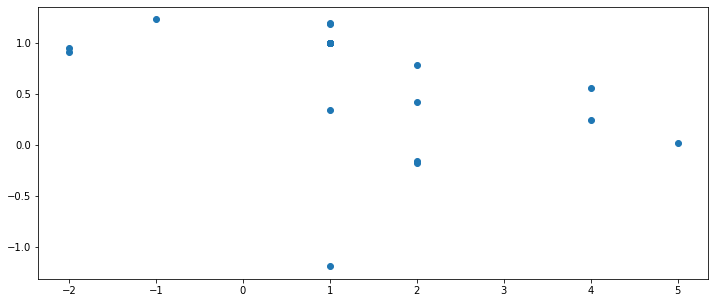

(92, 1)
(92, 1)


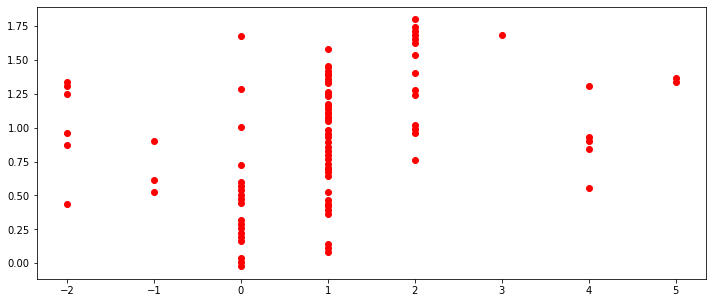

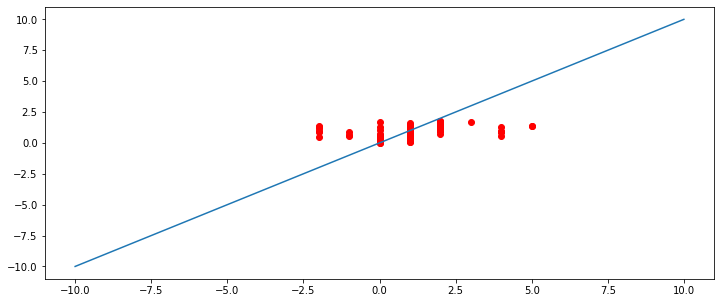

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
114.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit_was_taken         = 

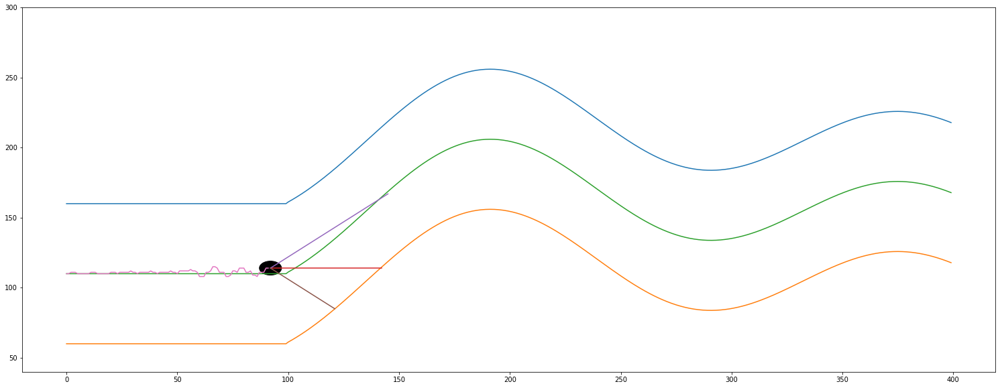

------------------------------ IF i % 3 == 2 ------------------------------
# i =  92
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  52
Sensor from right wall =  30
most távolsagra van a felső faltól =  45.0
most távolsagra van az alsó faltól =  55.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  92
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  5.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  5.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  93
			 len(self.sensor_left)   =  93
			 len(self.sensor_center) =  93
			 len(self.sensor_right)  =  93
			 self.x                  =  92
			 -------------- Teszt End ----------

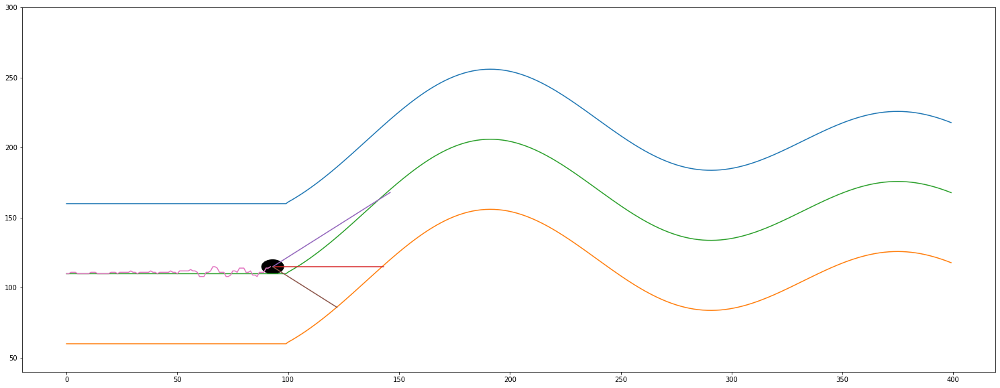

------------------------------ IF i % 3 == 0 ------------------------------
# i =  93
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (94, 3)
y.shape =  (94, 1)
i       =  93
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  93
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1.]
(41, 4)
(41, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51.]),

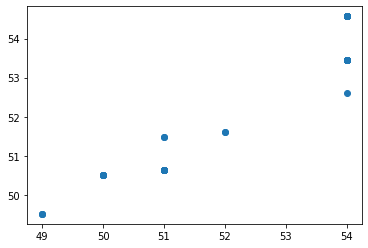

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99871514 0.73247829]]


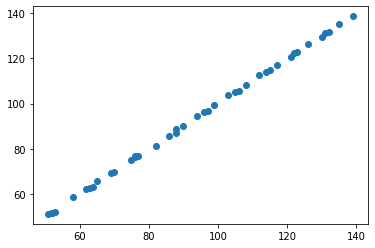

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00225985 0.73335349]]


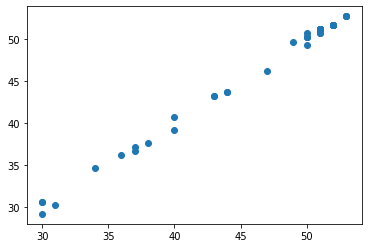

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.22027439]]
-------- 1 y up ->  center =  [[1.78438398]]
-------- 1 y up ->  right  =  [[1.61388376]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[51 -3]]
		 _X_right  =  [[30 -3]]
		 predicted_left   =  [[55.68932927]]
		 predicted_center =  [[48.79022799]]
		 predicted_right  =  [[27.74600547]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98551829 -0.55914634]]
		 regression_center.coef_ =  [[0.99871514 0.73247829]]
		 regression_right.coef_  =  [[1.0022

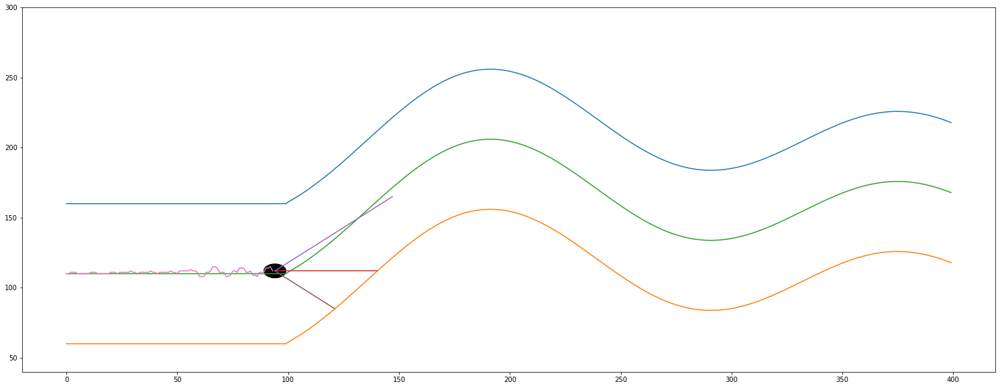

------------------------------ IF i % 3 == 1 ------------------------------
# i =  94
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 47 28]]
actual predicted =  [[1.29445987]]
actual self.y_distance[-1] =  2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0]
len(self.y_distance_real)      =  25
len(self.y_distance_predicted) =  25


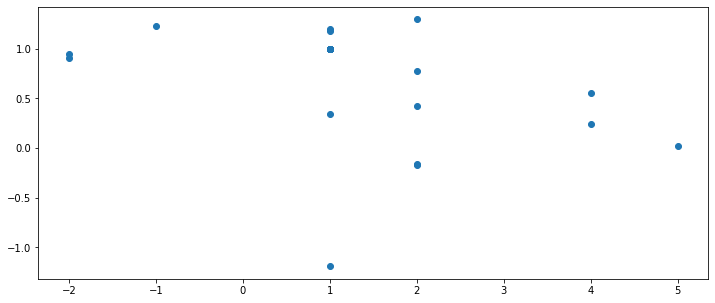

(95, 1)
(95, 1)


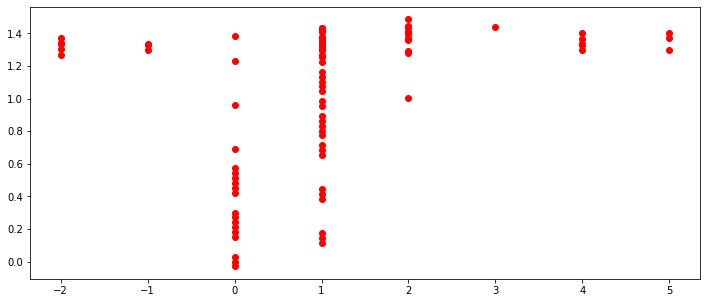

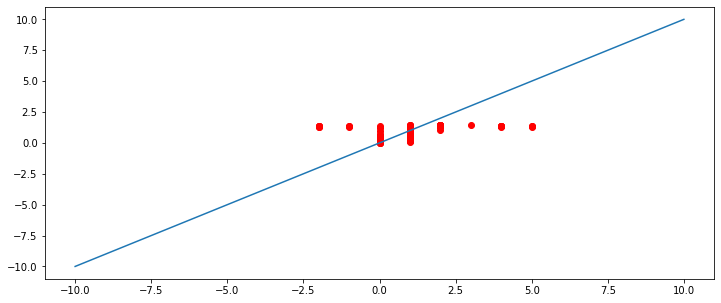

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
112.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0]
# 		 ----------------- Summary -----------------
# 			 _summary_mlp_fit

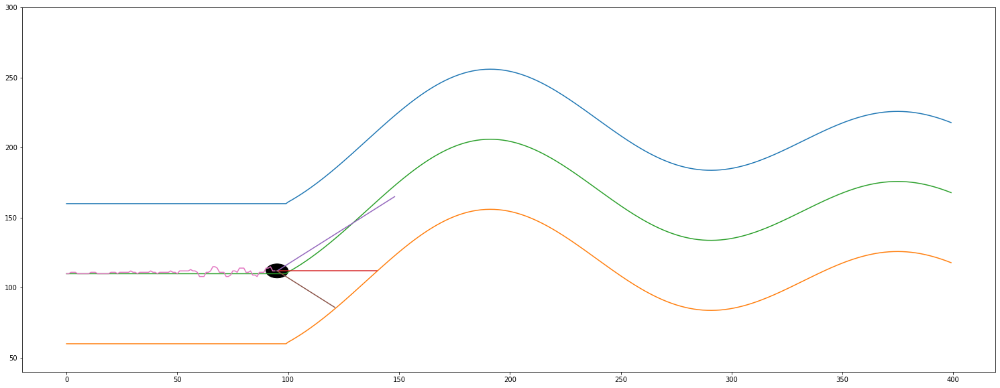

------------------------------ IF i % 3 == 2 ------------------------------
# i =  95
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  46
Sensor from right wall =  27
most távolsagra van a felső faltól =  49.0
most távolsagra van az alsó faltól =  51.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  95
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  1.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  1.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  96
			 len(self.sensor_left)   =  96
			 len(self.sensor_center) =  96
			 len(self.sensor_right)  =  96
			 self.x                  =  95
			 -------------- Teszt End --------

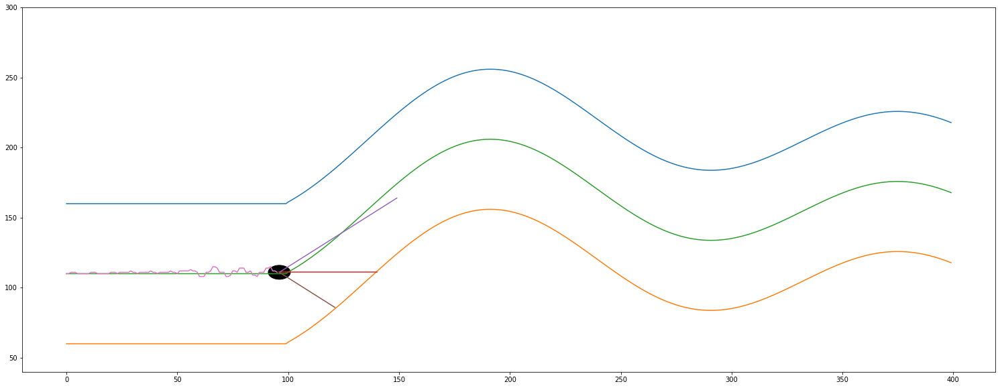

------------------------------ IF i % 3 == 0 ------------------------------
# i =  96
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (97, 3)
y.shape =  (97, 1)
i       =  96
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  96
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1.]
(42, 4)
(42, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51., 120.,  51

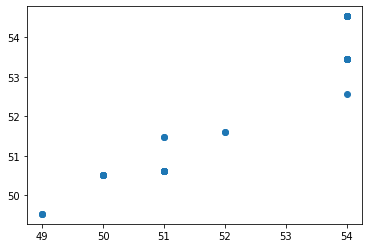

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99761216 0.71542278]]


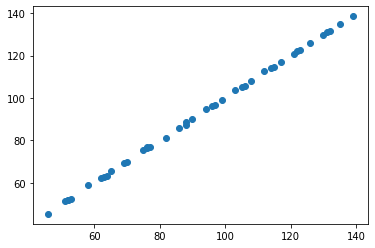

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99660162 0.71404297]]


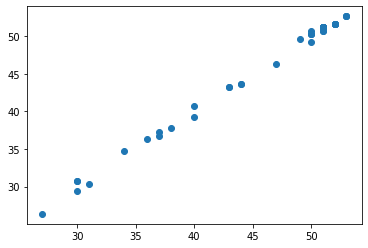

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.65430403]]
-------- 1 y up ->  center =  [[1.88543789]]
-------- 1 y up ->  right  =  [[1.86527077]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[45 -3]]
		 _X_right  =  [[26 -3]]
		 predicted_left   =  [[55.61644125]]
		 predicted_center =  [[42.91868201]]
		 predicted_right  =  [[23.92413944]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97707101 -0.54434348]]
		 regression_center.coef_ =  [[0.99761216 0.71542278]]
		 regression_right.coef_  =  [[0.9966

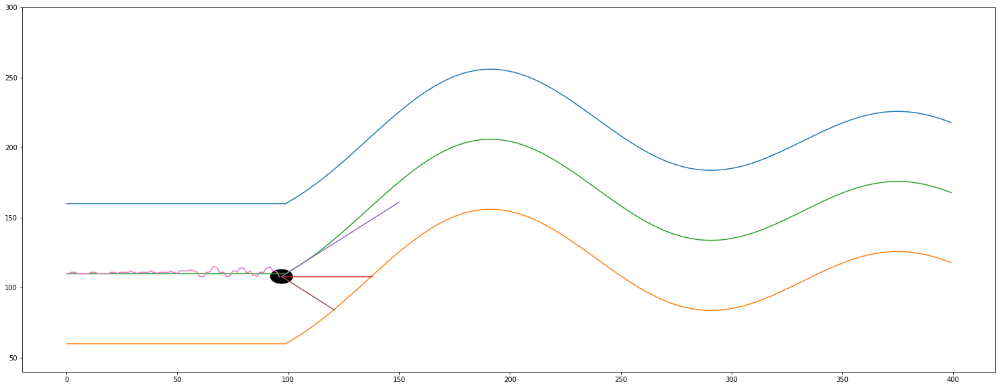

------------------------------ IF i % 3 == 1 ------------------------------
# i =  97
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 42 25]]
actual predicted =  [[1.3661483]]
actual self.y_distance[-1] =  -2.0
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0]
len(self.y_distance_real)      =  26
len(self.y_distance_predicted) =  26


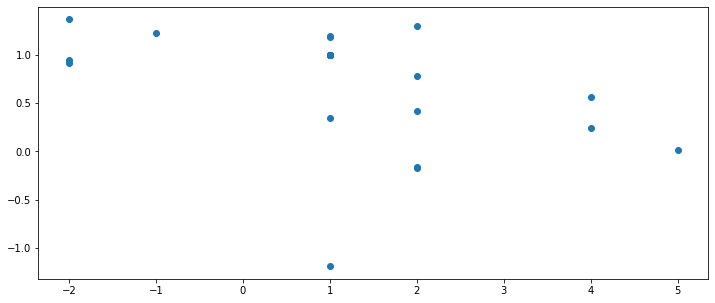

(98, 1)
(98, 1)


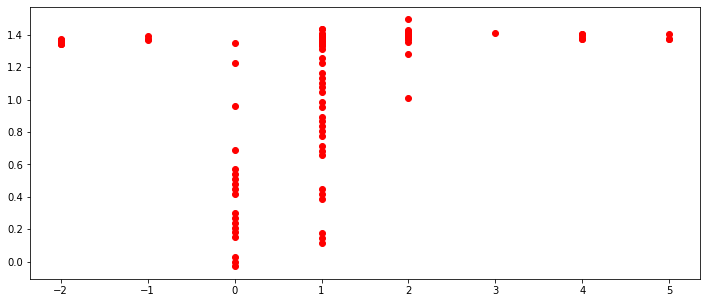

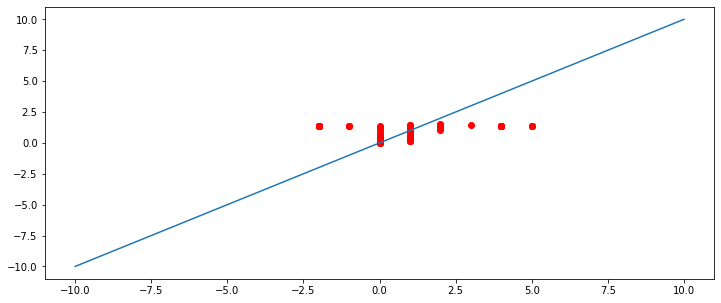

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
108.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0]
# 		 ----------------- Summary -----------------
#

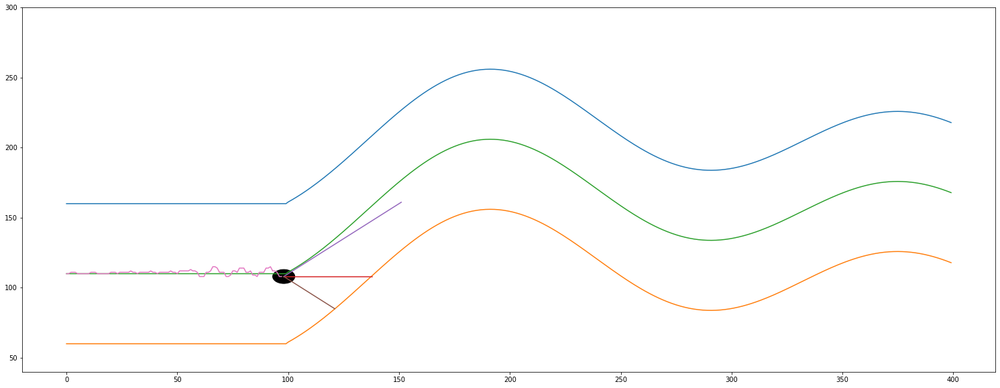

------------------------------ IF i % 3 == 2 ------------------------------
# i =  98
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  40
Sensor from right wall =  24
most távolsagra van a felső faltól =  53.0
most távolsagra van az alsó faltól =  47.0
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  98
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -3.0
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -3.0
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  99
			 len(self.sensor_left)   =  99
			 len(self.sensor_center) =  99
			 len(self.sensor_right)  =  99
			 self.x                  =  98
			 -------------- Teszt End -----

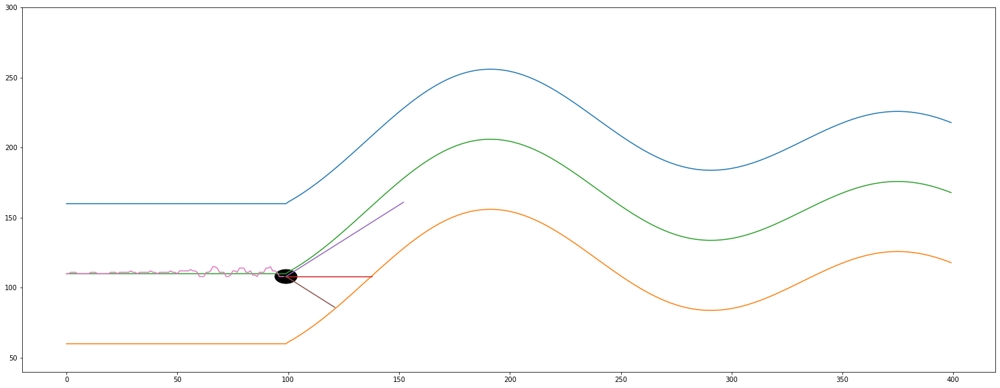

------------------------------ IF i % 3 == 0 ------------------------------
# i =  99
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (100, 3)
y.shape =  (100, 1)
i       =  99
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  99
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.]
(44, 4)
(44, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.,  51.,

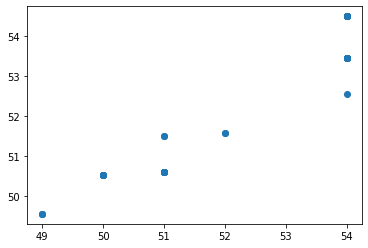

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99780661 0.72821987]]


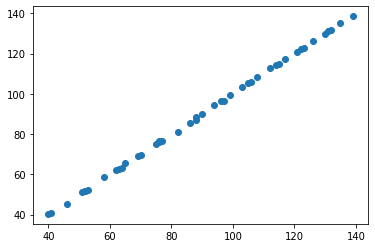

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99743333 0.68164318]]


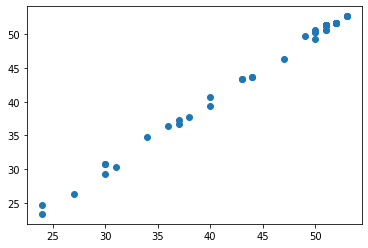

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.71518832]]
-------- 1 y up ->  center =  [[1.87752868]]
-------- 1 y up ->  right  =  [[1.79335187]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[40 -3]]
		 _X_right  =  [[23 -3]]
		 predicted_left   =  [[55.54152865]]
		 predicted_center =  [[37.87910685]]
		 predicted_right  =  [[21.0103123]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97638327 -0.51950681]]
		 regression_center.coef_ =  [[0.99780661 0.72821987]]
		 regression_right.coef_  =  [[0.99743

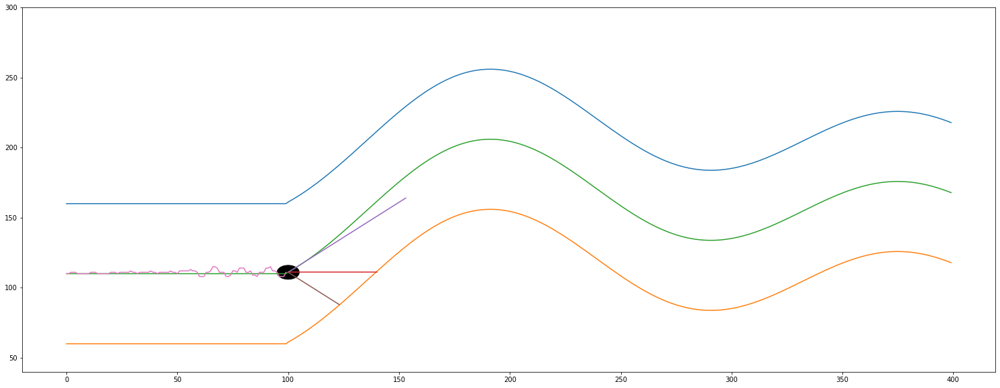

------------------------------ IF i % 3 == 1 ------------------------------
# i =  100
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 41 24]]
actual predicted =  [[0.4817636]]
actual self.y_distance[-1] =  -0.18185148332139534
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534]
len(self.y_distance_real)      =  27
len(self.y_distance_predicted) =  27


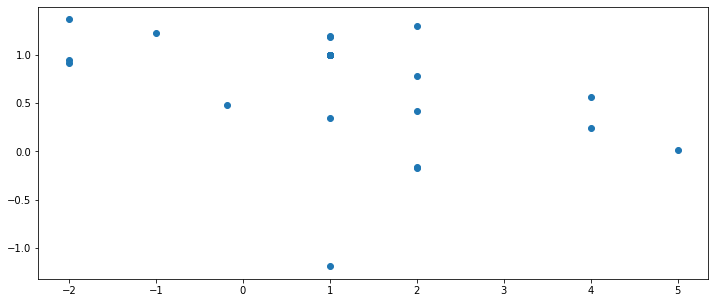

(101, 1)
(101, 1)


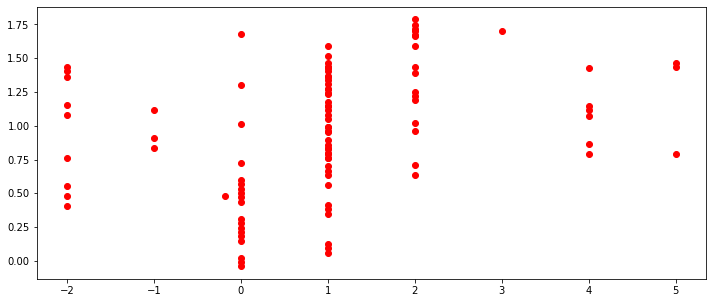

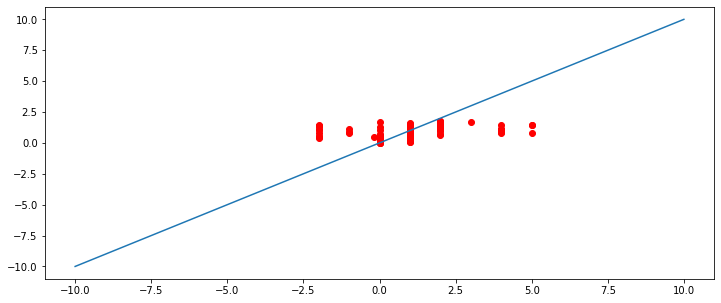

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
111.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0]
# 		 ----------------- Summar

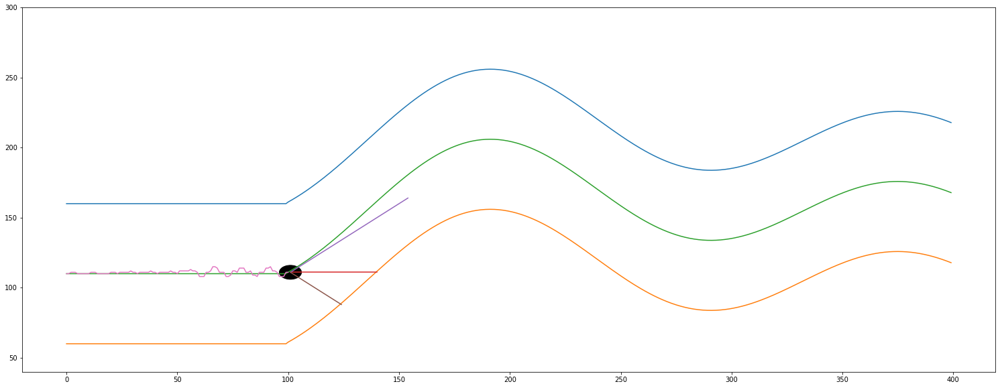

------------------------------ IF i % 3 == 2 ------------------------------
# i =  101
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  40
Sensor from right wall =  24
most távolsagra van a felső faltól =  50.073810289961955
most távolsagra van az alsó faltól =  49.92618971003806
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  101
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -0.07381028996195482
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -0.07381028996195482
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  102
			 len(self.sensor_left)   =  102
			 len(self.sensor_center) =  102
			 len(self.sensor_right)  =  102
			 se

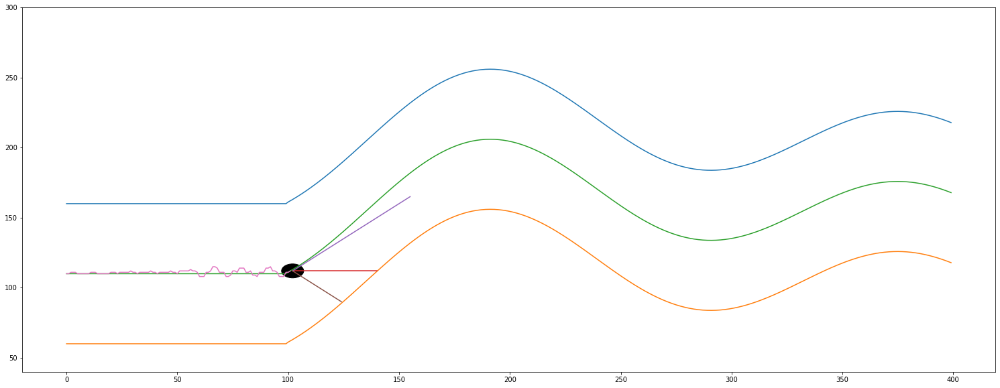

------------------------------ IF i % 3 == 0 ------------------------------
# i =  102
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (103, 3)
y.shape =  (103, 1)
i       =  102
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  102
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(45, 4)
(45, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([110.

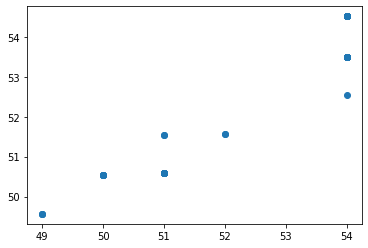

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99880586 0.71166237]]


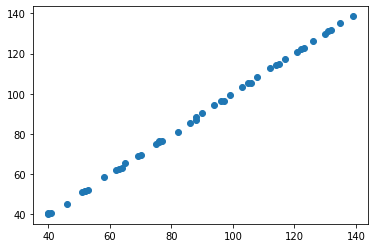

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00112764 0.66757436]]


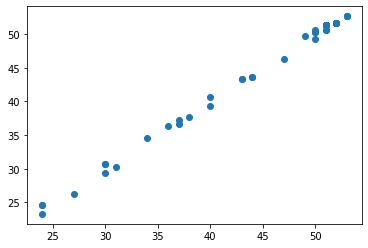

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.44028387]]
-------- 1 y up ->  center =  [[1.75611564]]
-------- 1 y up ->  right  =  [[1.60417549]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[39 -3]]
		 _X_right  =  [[23 -3]]
		 predicted_left   =  [[55.53069467]]
		 predicted_center =  [[36.86408901]]
		 predicted_right  =  [[20.95868624]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.98217171 -0.5088276 ]]
		 regression_center.coef_ =  [[0.99880586 0.71166237]]
		 regression_right.coef_  =  [[1.0011

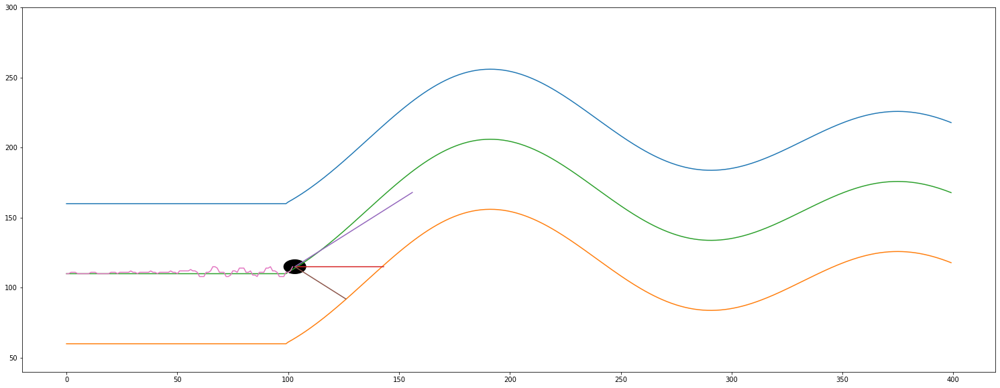

------------------------------ IF i % 3 == 1 ------------------------------
# i =  103
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 41 24]]
actual predicted =  [[0.22747131]]
actual self.y_distance[-1] =  1.0632674373073314
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314]
len(self.y_distance_real)     

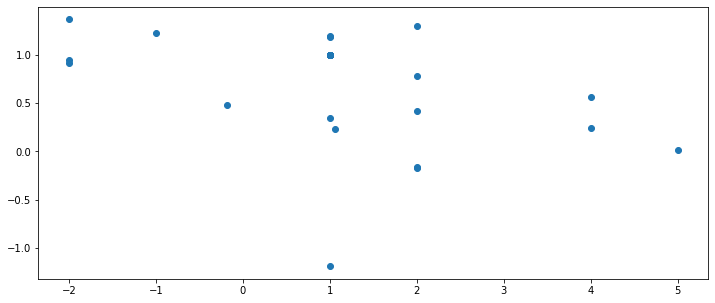

(104, 1)
(104, 1)


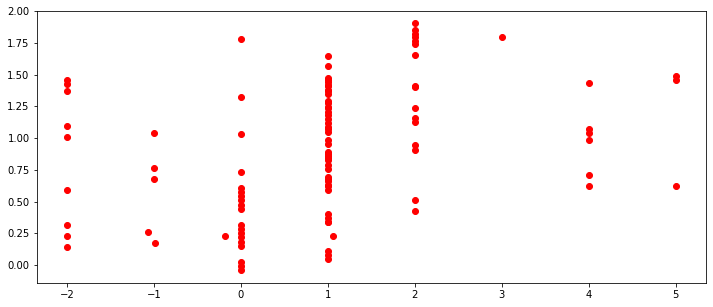

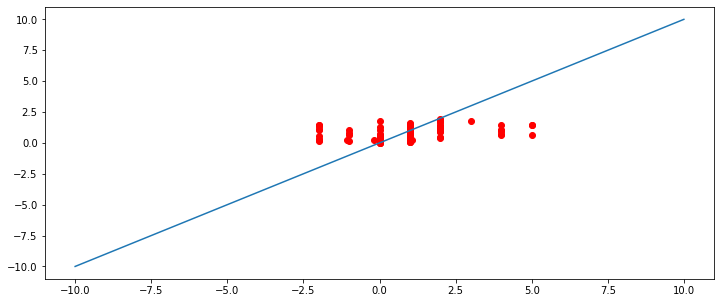

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
115.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0]
# 		 ---

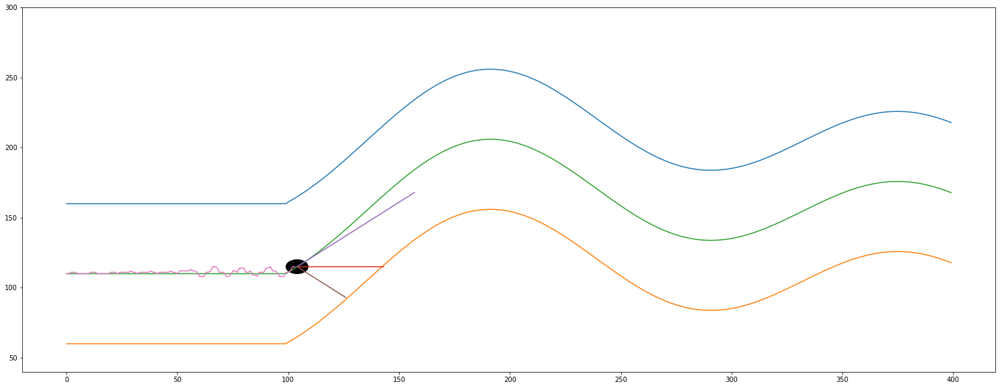

------------------------------ IF i % 3 == 2 ------------------------------
# i =  104
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  39
Sensor from right wall =  23
most távolsagra van a felső faltól =  50.90706152640314
most távolsagra van az alsó faltól =  49.09293847359686
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  104
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -0.9070615264031403
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -0.9070615264031403
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  105
			 len(self.sensor_left)   =  105
			 len(self.sensor_center) =  105
			 len(self.sensor_right)  =  105
			 sel

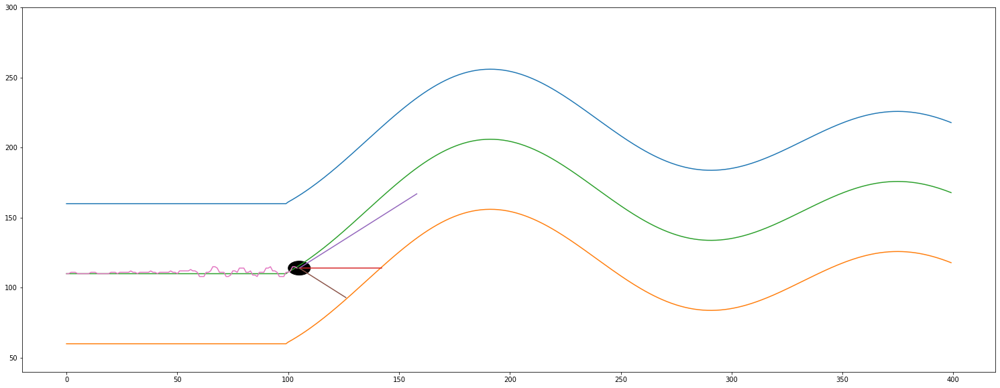

------------------------------ IF i % 3 == 0 ------------------------------
# i =  105
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (106, 3)
y.shape =  (106, 1)
i       =  105
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  105
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(46, 4)
(46, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]), array([

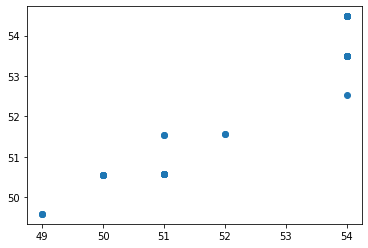

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99914031 0.71774639]]


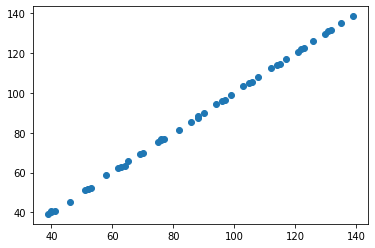

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99776333 0.65207667]]


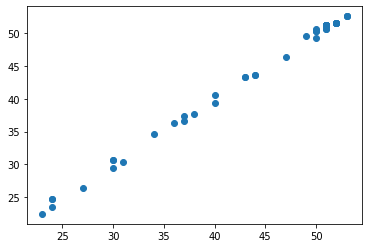

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.76823282]]
-------- 1 y up ->  center =  [[1.72700438]]
-------- 1 y up ->  right  =  [[1.74737806]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[38 -3]]
		 _X_right  =  [[22 -3]]
		 predicted_left   =  [[55.47335203]]
		 predicted_center =  [[35.82421025]]
		 predicted_right  =  [[20.09210142]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97580645 -0.49684432]]
		 regression_center.coef_ =  [[0.99914031 0.71774639]]
		 regression_right.coef_  =  [[0.9977

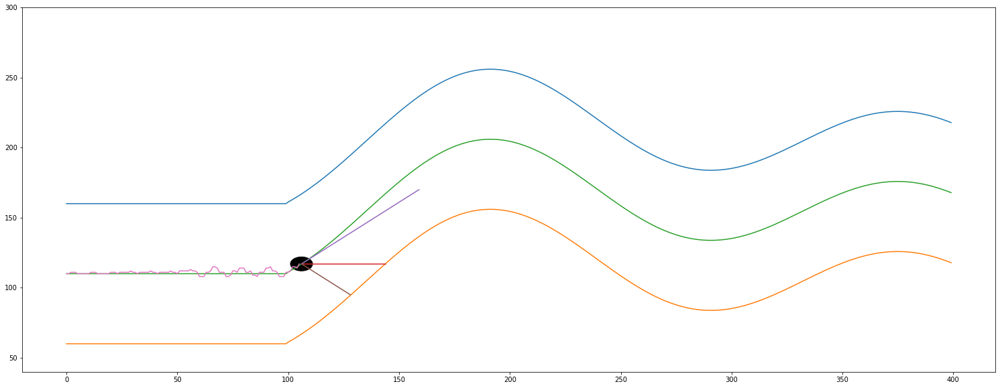

------------------------------ IF i % 3 == 1 ------------------------------
# i =  106
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 39 23]]
actual predicted =  [[0.08995481]]
actual self.y_distance[-1] =  0.07639228755039085
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.902821

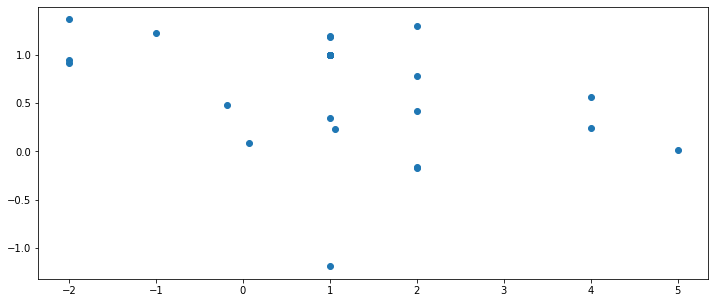

(107, 1)
(107, 1)


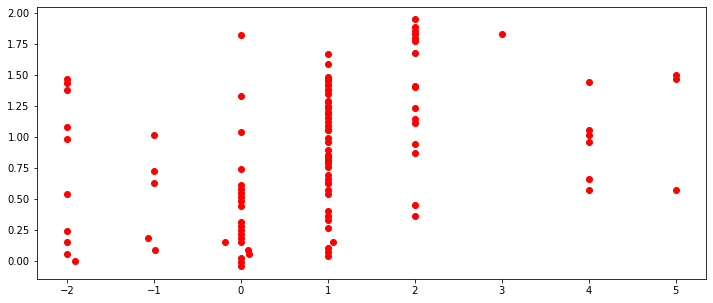

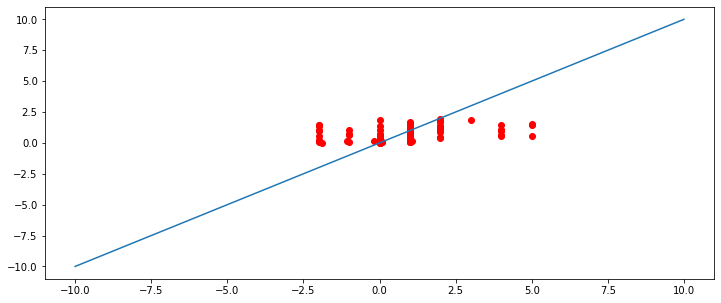

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
117.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

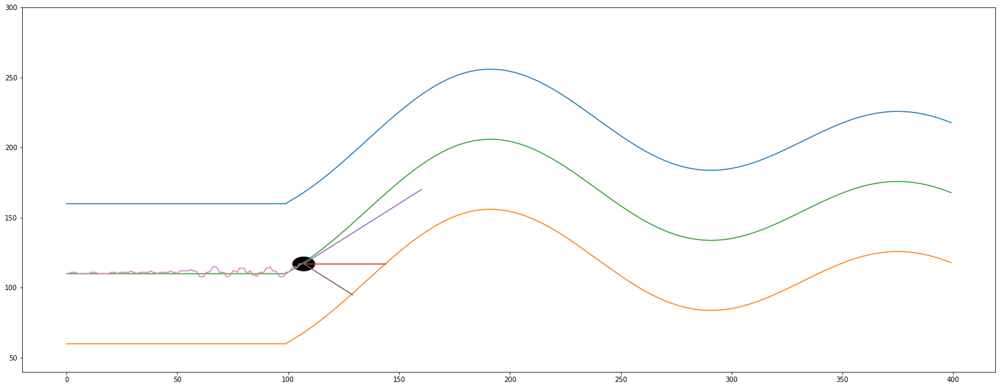

------------------------------ IF i % 3 == 2 ------------------------------
# i =  107
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  37
Sensor from right wall =  22
most távolsagra van a felső faltól =  51.968983108538055
most távolsagra van az alsó faltól =  48.031016891461945
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  107
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.9689831085380547
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.9689831085380547
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  108
			 len(self.sensor_left)   =  108
			 len(self.sensor_center) =  108
			 len(self.sensor_right)  =  108
			 

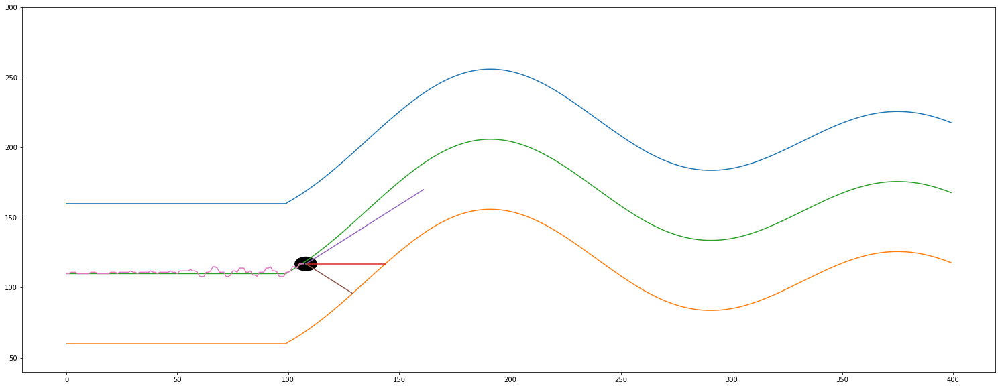

------------------------------ IF i % 3 == 0 ------------------------------
# i =  108
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (109, 3)
y.shape =  (109, 1)
i       =  108
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  108
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(48, 4)
(48, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50.]),

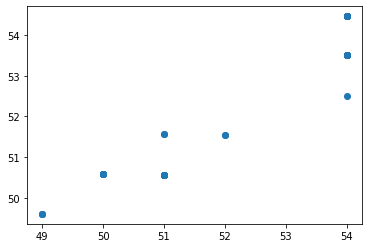

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99908241 0.72951076]]


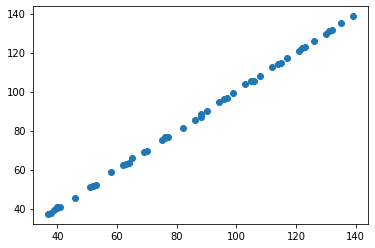

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[0.99807295 0.66654623]]


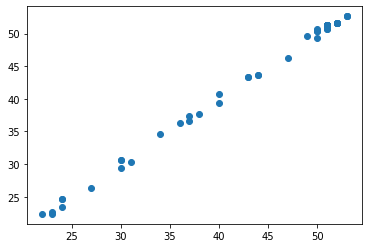

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.81496364]]
-------- 1 y up ->  center =  [[1.74458536]]
-------- 1 y up ->  right  =  [[1.74696022]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[37 -3]]
		 _X_right  =  [[22 -3]]
		 predicted_left   =  [[55.41102181]]
		 predicted_center =  [[34.79350906]]
		 predicted_right  =  [[20.04030736]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97531573 -0.47608113]]
		 regression_center.coef_ =  [[0.99908241 0.72951076]]
		 regression_right.coef_  =  [[0.9980

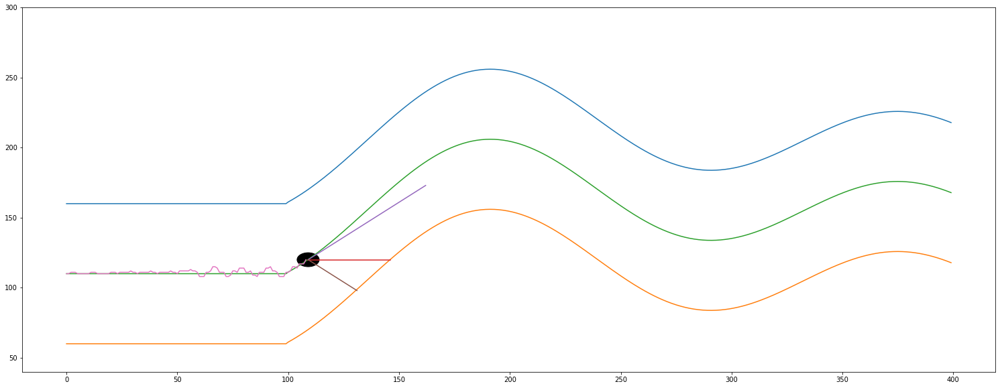

------------------------------ IF i % 3 == 1 ------------------------------
# i =  109
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 38 23]]
actual predicted =  [[-0.04578565]]
actual self.y_distance[-1] =  -0.13158200711751533
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.9028

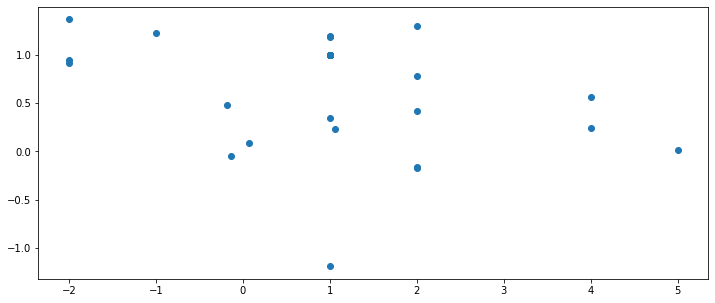

(110, 1)
(110, 1)


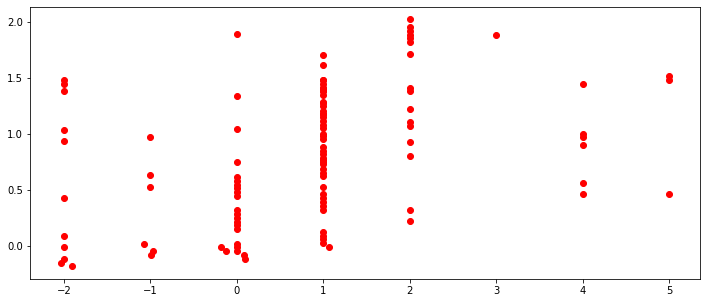

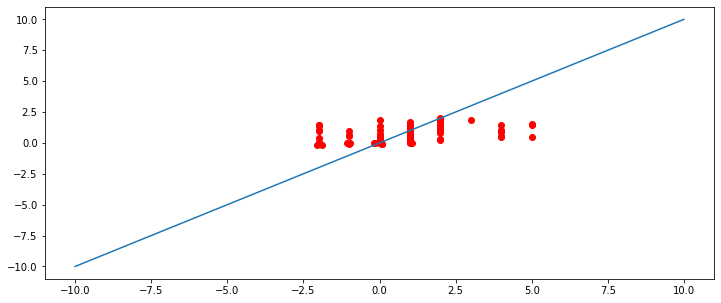

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
120.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

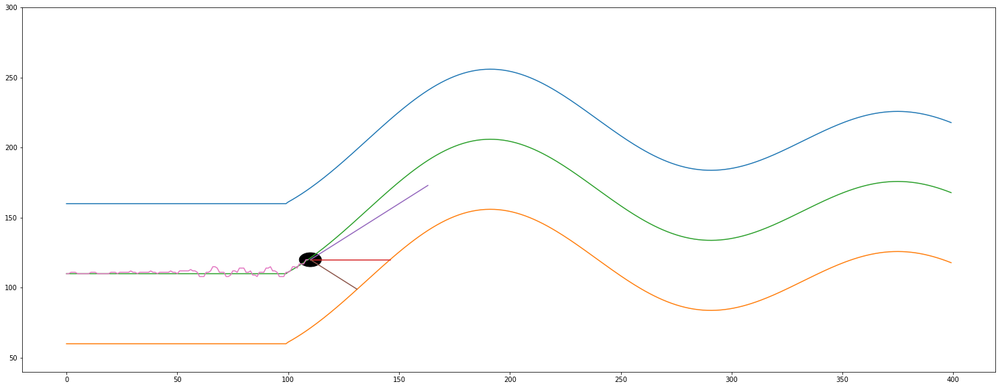

------------------------------ IF i % 3 == 2 ------------------------------
# i =  110
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  38
Sensor from right wall =  22
most távolsagra van a felső faltól =  50.24776420832944
most távolsagra van az alsó faltól =  49.75223579167057
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  110
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -0.24776420832944268
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -0.24776420832944268
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  111
			 len(self.sensor_left)   =  111
			 len(self.sensor_center) =  111
			 len(self.sensor_right)  =  111
			 sel

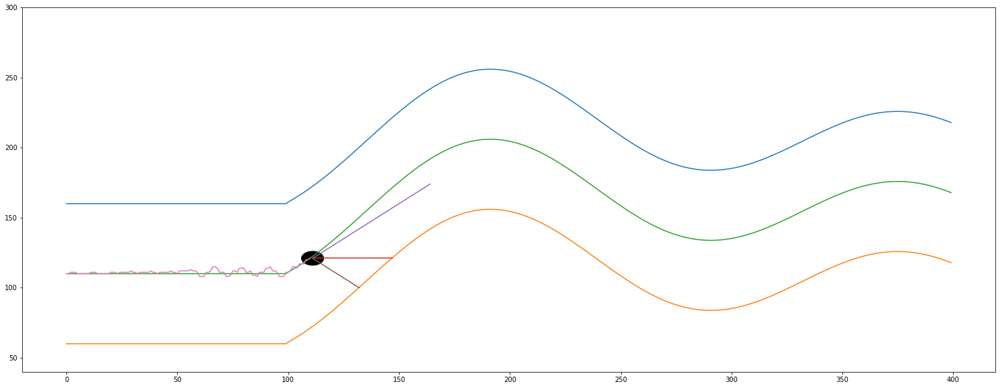

------------------------------ IF i % 3 == 0 ------------------------------
# i =  111
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (112, 3)
y.shape =  (112, 1)
i       =  111
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  111
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(49, 4)
(49, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,  50

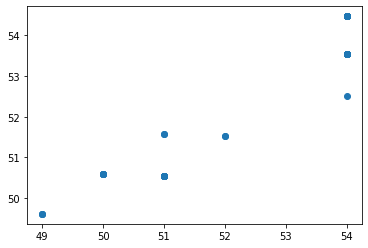

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99879739 0.73510776]]


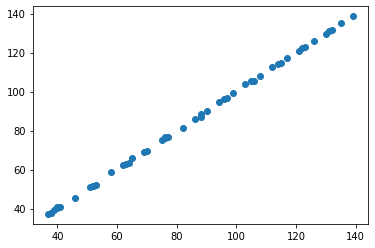

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00057626 0.65360754]]


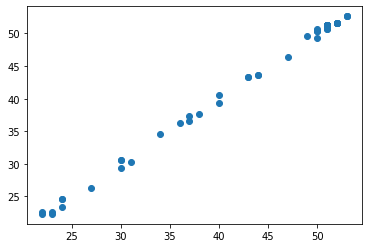

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.59916606]]
-------- 1 y up ->  center =  [[1.77976878]]
-------- 1 y up ->  right  =  [[1.61646552]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[37 -3]]
		 _X_right  =  [[22 -3]]
		 predicted_left   =  [[55.40029007]]
		 predicted_center =  [[34.79604368]]
		 predicted_right  =  [[20.01413684]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97987672 -0.46691443]]
		 regression_center.coef_ =  [[0.99879739 0.73510776]]
		 regression_right.coef_  =  [[1.0005

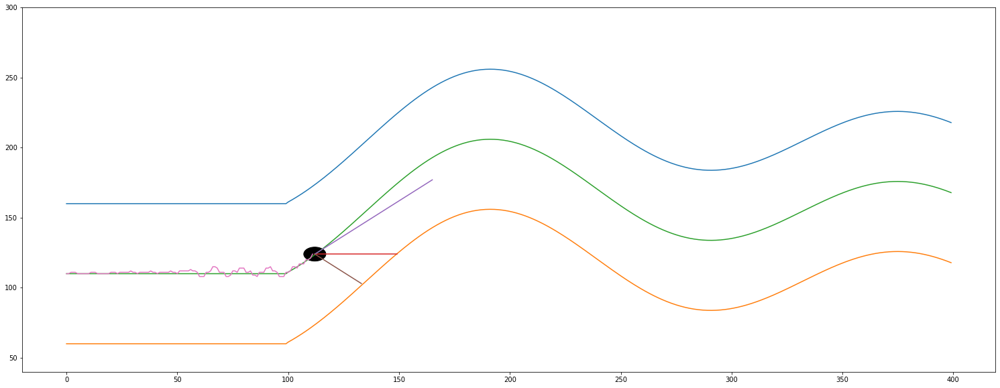

------------------------------ IF i % 3 == 1 ------------------------------
# i =  112
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 38 22]]
actual predicted =  [[-0.29860634]]
actual self.y_distance[-1] =  0.4529493014635193
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.902821

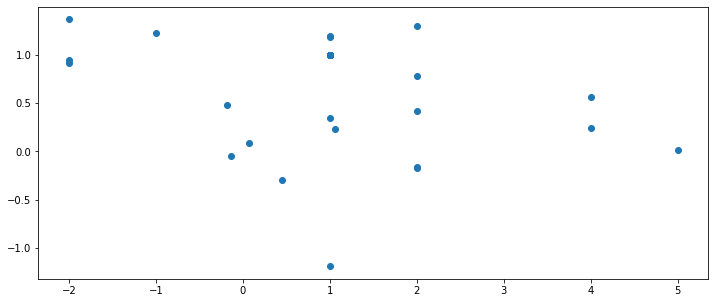

(113, 1)
(113, 1)


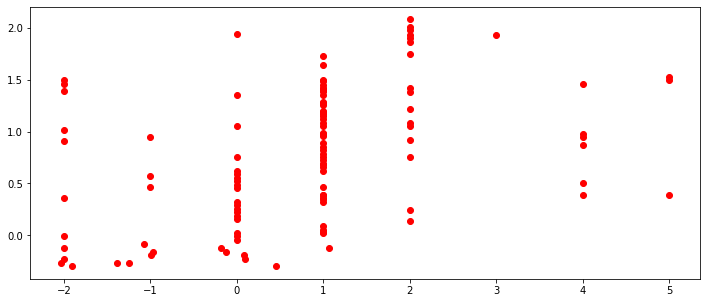

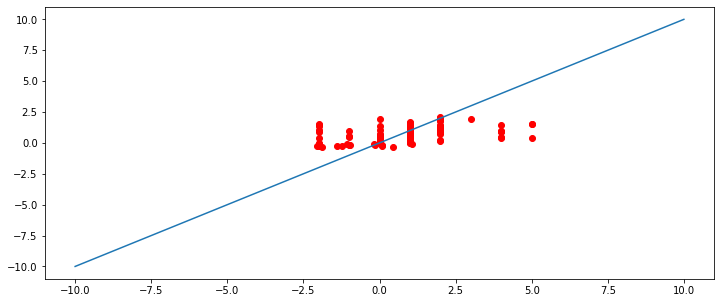

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
124.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

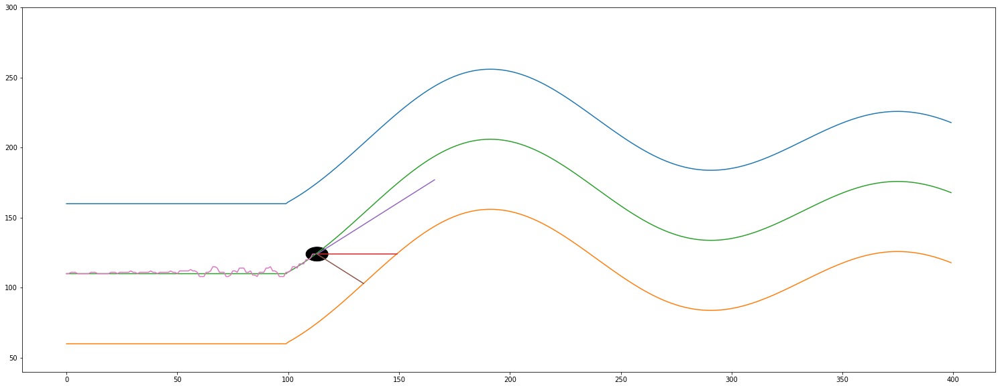

------------------------------ IF i % 3 == 2 ------------------------------
# i =  113
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  36
Sensor from right wall =  21
most távolsagra van a felső faltól =  51.728924091668205
most távolsagra van az alsó faltól =  48.271075908331795
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  113
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -1.7289240916682047
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -1.7289240916682047
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  114
			 len(self.sensor_left)   =  114
			 len(self.sensor_center) =  114
			 len(self.sensor_right)  =  114
			 s

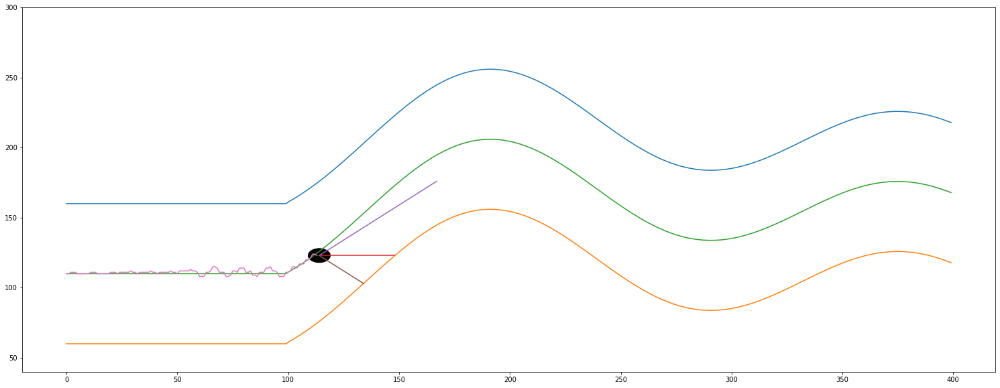

------------------------------ IF i % 3 == 0 ------------------------------
# i =  114
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (115, 3)
y.shape =  (115, 1)
i       =  114
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  114
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(50, 4)
(50, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52., 122.,

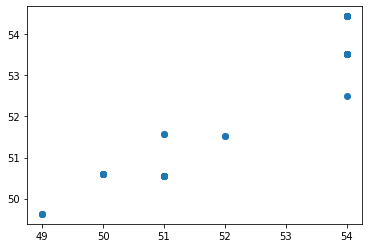

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99904485 0.74034385]]


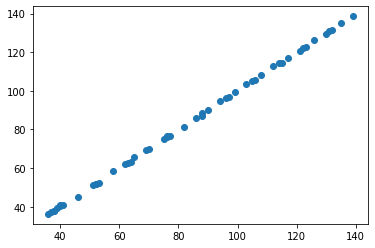

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00164275 0.66009856]]


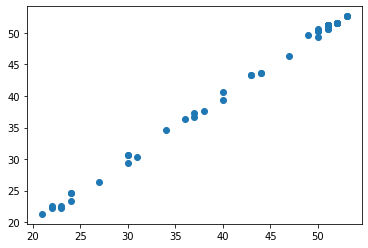

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.85651709]]
-------- 1 y up ->  center =  [[1.75923897]]
-------- 1 y up ->  right  =  [[1.57291025]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[35 -3]]
		 _X_right  =  [[21 -3]]
		 predicted_left   =  [[55.35380342]]
		 predicted_center =  [[32.76538857]]
		 predicted_right  =  [[18.96537091]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97489316 -0.45698718]]
		 regression_center.coef_ =  [[0.99904485 0.74034385]]
		 regression_right.coef_  =  [[1.0016

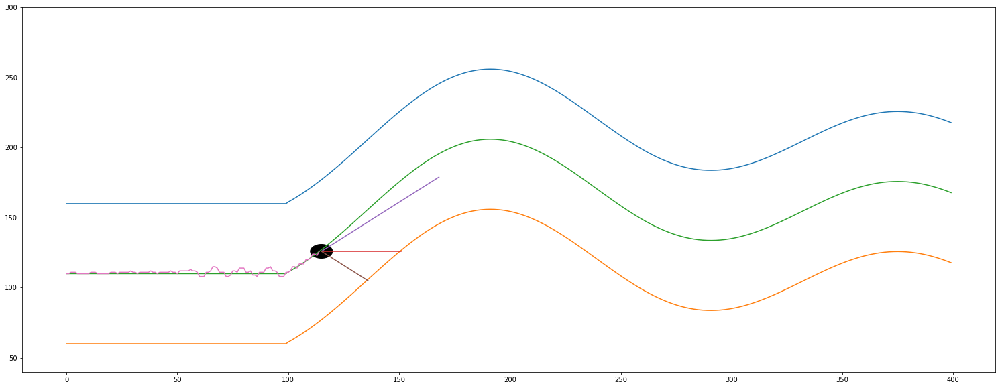

------------------------------ IF i % 3 == 1 ------------------------------
# i =  115
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 37 22]]
actual predicted =  [[-0.36854933]]
actual self.y_distance[-1] =  -1.1538279909914309
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.90282

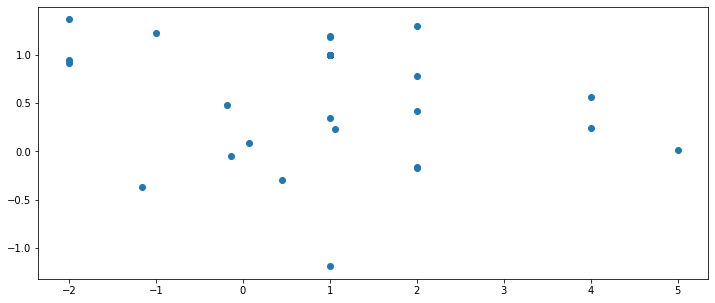

(116, 1)
(116, 1)


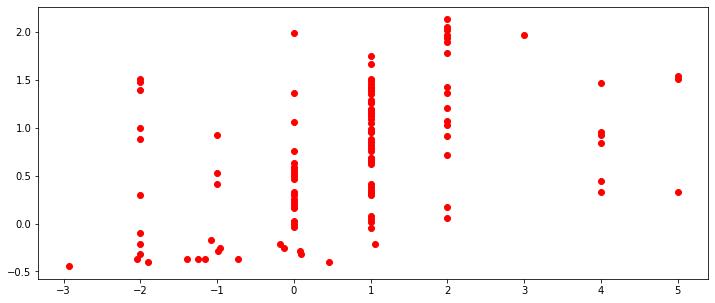

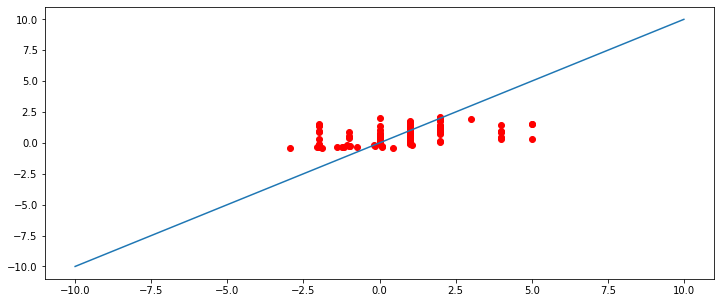

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
126.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

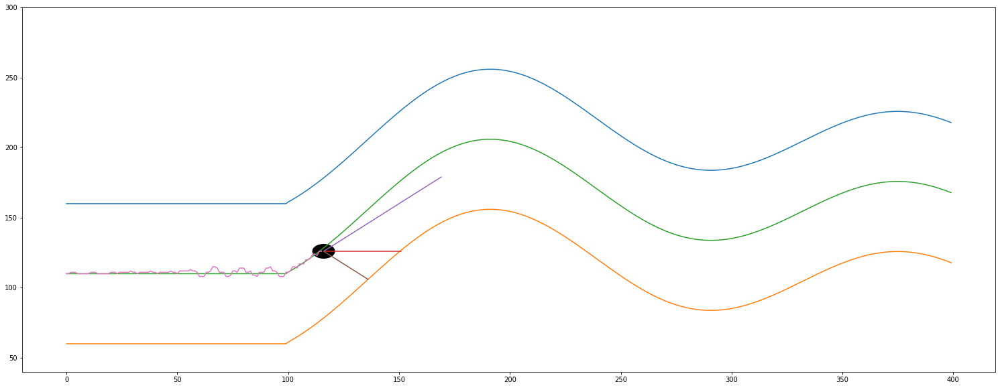

------------------------------ IF i % 3 == 2 ------------------------------
# i =  116
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  35
Sensor from right wall =  21
most távolsagra van a felső faltól =  53.39544982058476
most távolsagra van az alsó faltól =  46.60455017941524
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  116
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -3.3954498205847585
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -3.3954498205847585
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  117
			 len(self.sensor_left)   =  117
			 len(self.sensor_center) =  117
			 len(self.sensor_right)  =  117
			 se

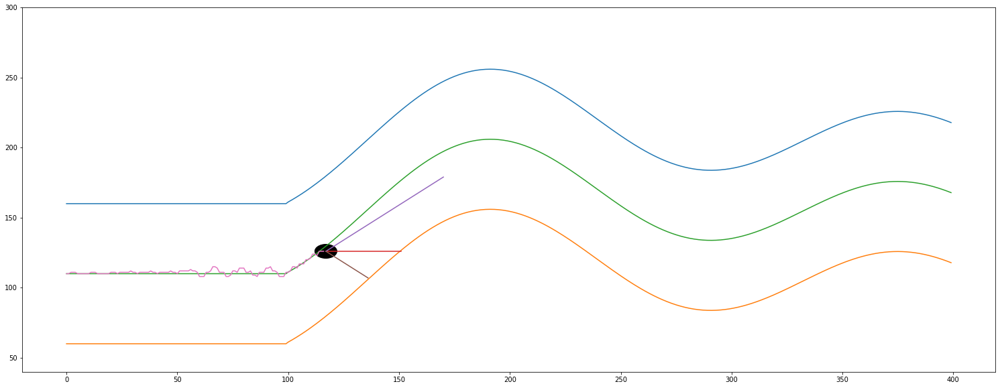

------------------------------ IF i % 3 == 0 ------------------------------
# i =  117
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (118, 3)
y.shape =  (118, 1)
i       =  117
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  117
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.]
(52, 4)
(52, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,  52

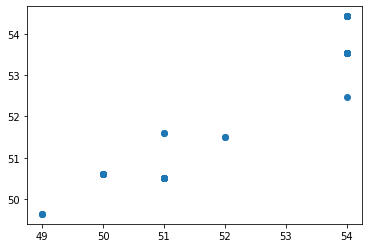

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99901296 0.75032269]]


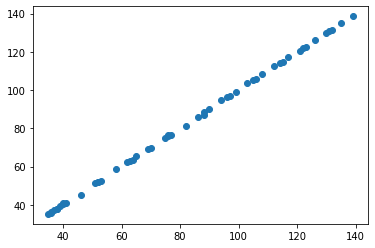

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00131304 0.63469114]]


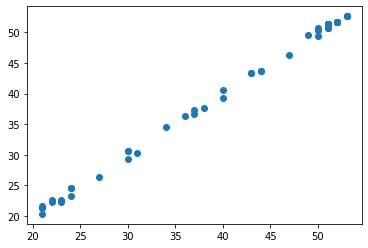

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.89376009]]
-------- 1 y up ->  center =  [[1.77233426]]
-------- 1 y up ->  right  =  [[1.56281269]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[35 -3]]
		 _X_right  =  [[20 -3]]
		 predicted_left   =  [[55.30108353]]
		 predicted_center =  [[32.73748398]]
		 predicted_right  =  [[18.04899582]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97452547 -0.43936832]]
		 regression_center.coef_ =  [[0.99901296 0.75032269]]
		 regression_right.coef_  =  [[1.0013

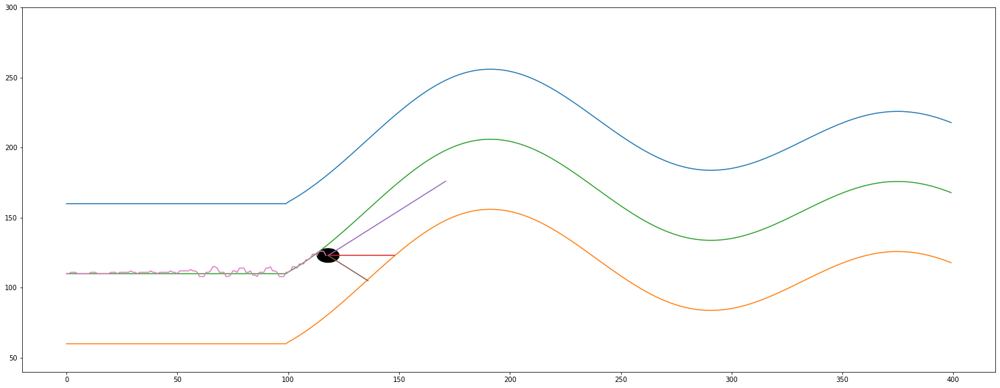

------------------------------ IF i % 3 == 1 ------------------------------
# i =  118
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 31 19]]
actual predicted =  [[-0.87170374]]
actual self.y_distance[-1] =  -7.9333021311297784
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.90282

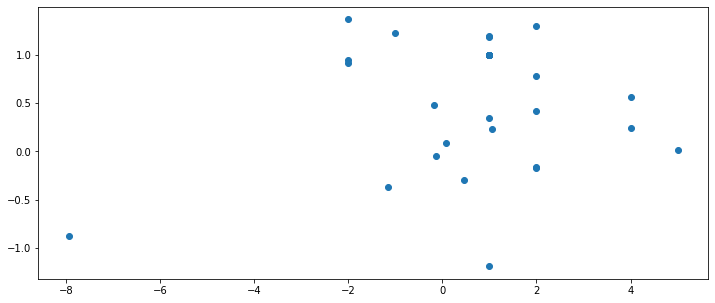

(119, 1)
(119, 1)


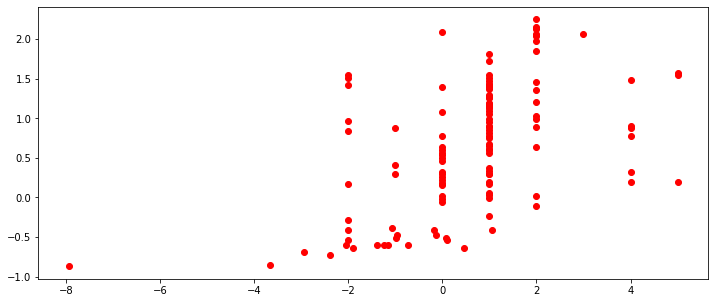

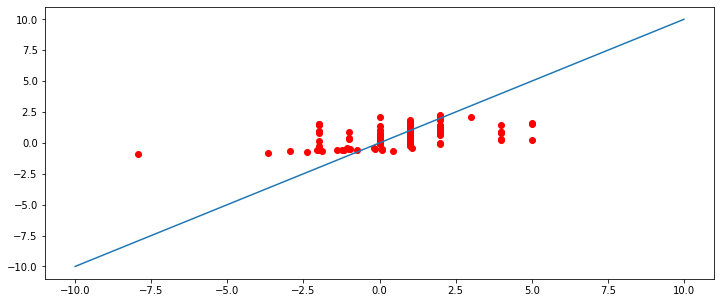

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
123.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

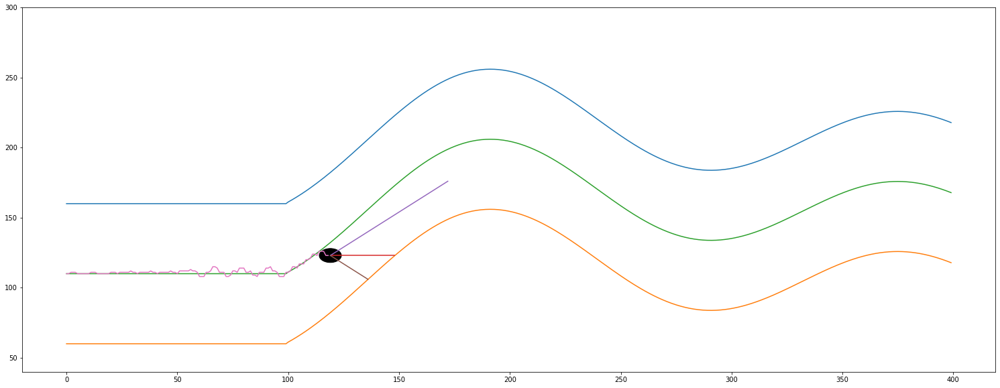

------------------------------ IF i % 3 == 2 ------------------------------
# i =  119
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> up first
Sensor center =  31
Sensor from right wall =  18
most távolsagra van a felső faltól =  58.22795978443099
most távolsagra van az alsó faltól =  41.77204021556901
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  119
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -8.227959784430993
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -8.227959784430993
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  120
			 len(self.sensor_left)   =  120
			 len(self.sensor_center) =  120
			 len(self.sensor_right)  =  120
			 self.x 

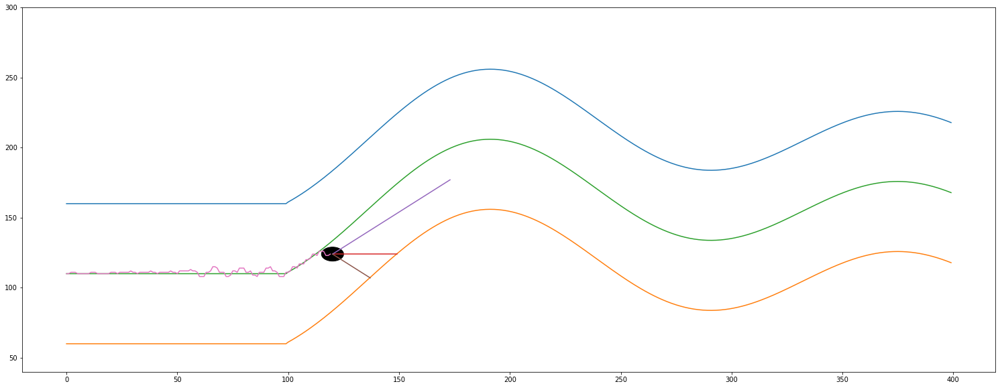

------------------------------ IF i % 3 == 0 ------------------------------
# i =  120
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (121, 3)
y.shape =  (121, 1)
i       =  120
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  120
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1.]
(53, 4)
(53, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([109.,

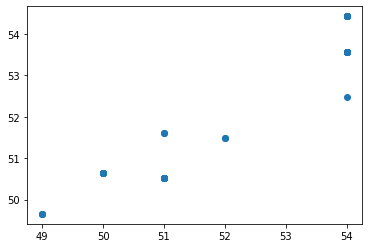

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99878673 0.75492459]]


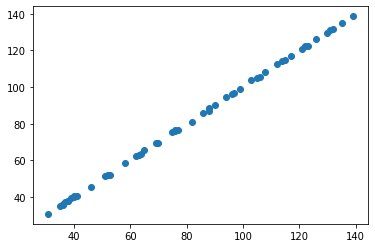

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00307549 0.62470893]]


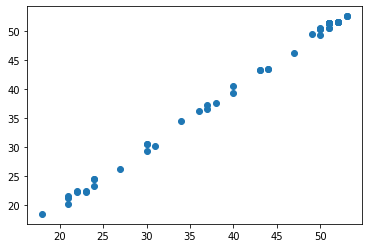

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.71961488]]
-------- 1 y up ->  center =  [[1.79973147]]
-------- 1 y up ->  right  =  [[1.4720788]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[30 -3]]
		 _X_right  =  [[18 -3]]
		 predicted_left   =  [[55.29089179]]
		 predicted_center =  [[27.74484838]]
		 predicted_right  =  [[16.02552648]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97821789 -0.43143213]]
		 regression_center.coef_ =  [[0.99878673 0.75492459]]
		 regression_right.coef_  =  [[1.00307

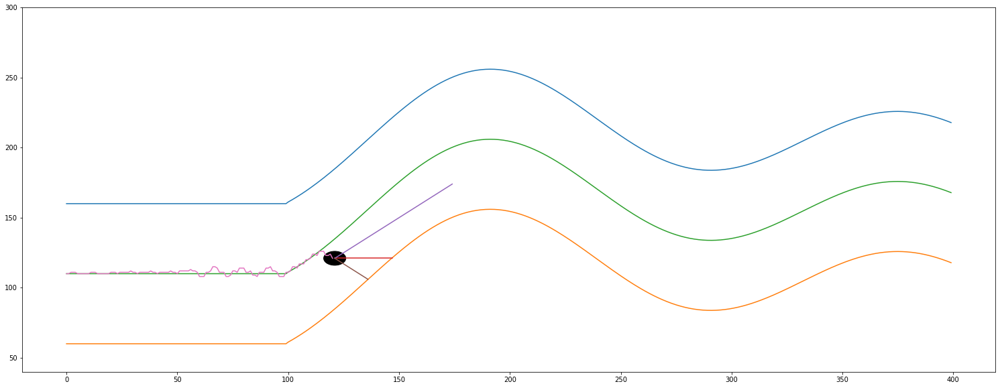

------------------------------ IF i % 3 == 1 ------------------------------
# i =  121
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 27 16]]
actual predicted =  [[-2.42255872]]
actual self.y_distance[-1] =  -13.864615269508647
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.90282

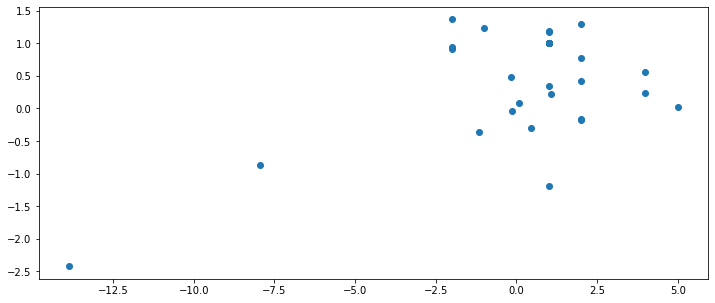

(122, 1)
(122, 1)


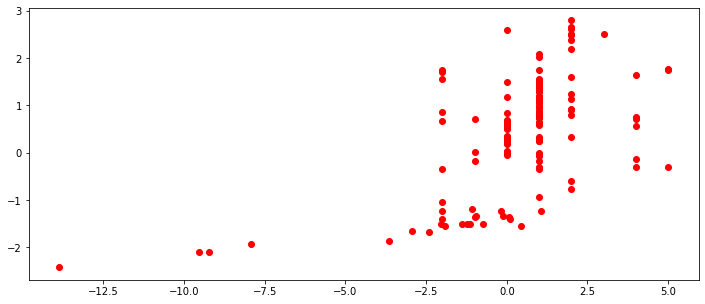

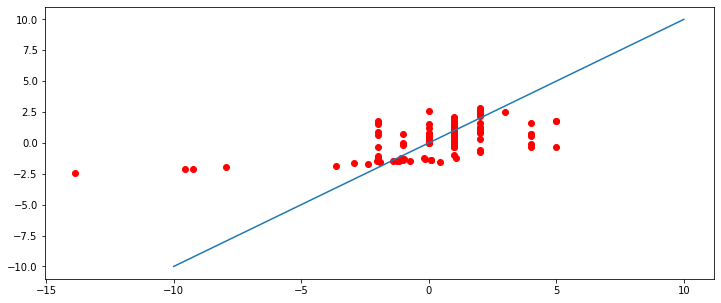

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
121.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

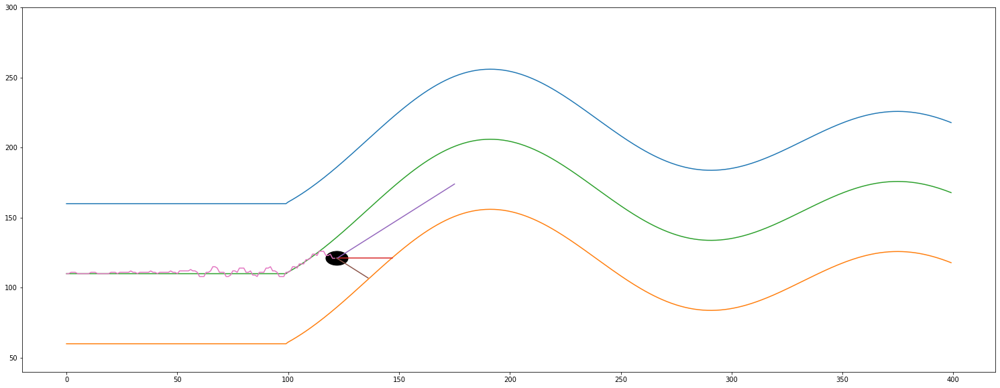

------------------------------ IF i % 3 == 2 ------------------------------
# i =  122
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down first
Sensor center =  25
Sensor from right wall =  15
most távolsagra van a felső faltól =  66.20489143234215
most távolsagra van az alsó faltól =  33.79510856765786
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  122
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -16.20489143234215
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -16.20489143234215
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  123
			 len(self.sensor_left)   =  123
			 len(self.sensor_center) =  123
			 len(self.sensor_right)  =  123
			 self.

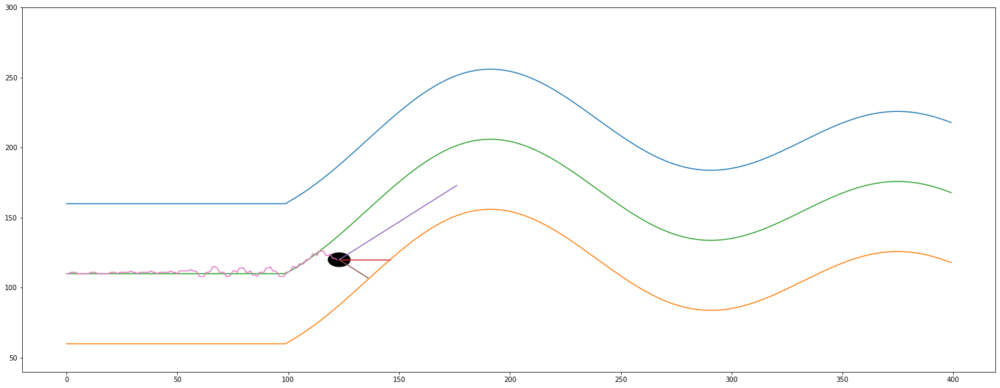

------------------------------ IF i % 3 == 0 ------------------------------
# i =  123
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (124, 3)
y.shape =  (124, 1)
i       =  123
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  123
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.]
(54, 4)
(54, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]), array([1

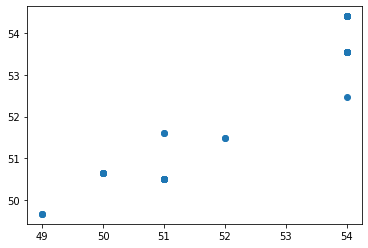

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99901849 0.75964096]]


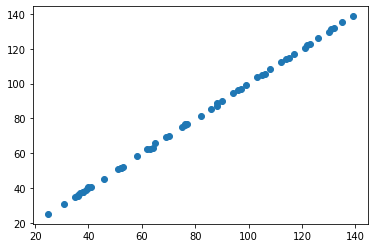

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00077082 0.61111111]]


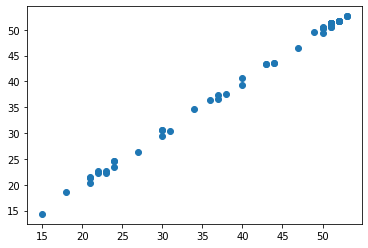

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.9273678]]
-------- 1 y up ->  center =  [[1.78138859]]
-------- 1 y up ->  right  =  [[1.56238781]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[24 -3]]
		 _X_right  =  [[14 -3]]
		 predicted_left   =  [[55.25234522]]
		 predicted_center =  [[21.72024997]]
		 predicted_right  =  [[12.12796405]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97420263 -0.42305955]]
		 regression_center.coef_ =  [[0.99901849 0.75964096]]
		 regression_right.coef_  =  [[1.00077

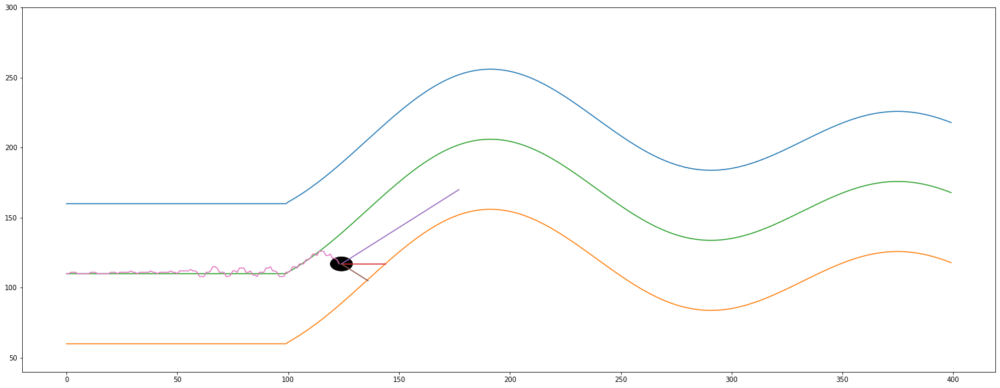

------------------------------ IF i % 3 == 1 ------------------------------
# i =  124
# 2. az 1. pontban megtanult modell alapján teszünk egy becslést - tulajdonképpen ezzel mérem az 1. modell jóságát, ez a lépés ezt szolgálja
actual _X_test =  [[54 21 13]]
actual predicted =  [[-5.03478106]]
actual self.y_distance[-1] =  -21.924866302526198
actual self.y_distance     =  [0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 0.0, 2.0, 2.0, 2.0, 2.0, 2.0, 3.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, 1.0, 1.0, 2.0, 5.0, 5.0, 4.0, 1.0, 1.0, 1.0, -2.0, -2.0, -1.0, 2.0, 2.0, 1.0, 4.0, 4.0, 4.0, 1.0, 1.0, 2.0, -1.0, -1.0, -2.0, 1.0, 1.0, 1.0, 4.0, 4.0, 5.0, 2.0, 2.0, 1.0, -2.0, -2.0, -2.0, -0.18185148332139534, -1.0738102899619548, -0.9922038843040468, 1.0632674373073314, 0.0929384735968597, -1.90282

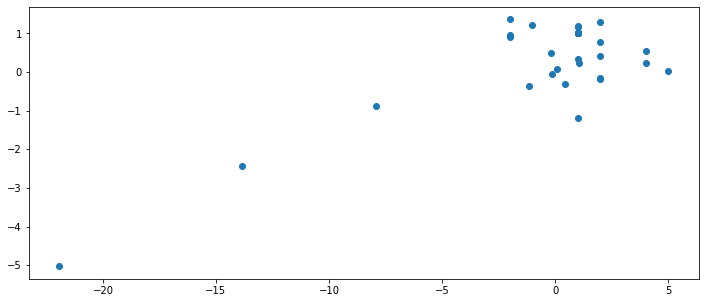

(125, 1)
(125, 1)


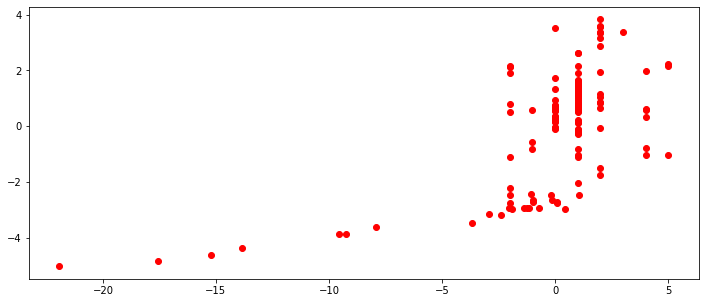

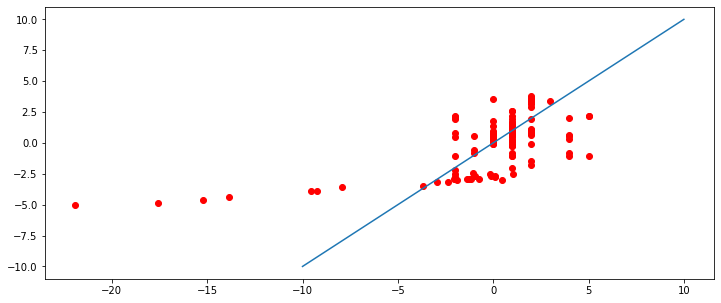

# A run ciklus vége ------------------------------------------------------------------------------------------------------------------------------------------
#   itt adom hozzás a self.y a self.y_history-hoz
#    self.y :
117.0
#   self.y_history after append :
[110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 110.0, 110.0, 110.0, 110.0, 110.0, 111.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 111.0, 111.0, 111.0, 111.0, 111.0, 112.0, 111.0, 111.0, 110.0, 112.0, 112.0, 112.0, 112.0, 112.0, 113.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 111.0, 111.0, 111.0, 108.0, 108.0, 109.0, 112.0, 112.0, 111.0, 114.0, 114.0, 114.0, 111.0, 111.0, 112.0, 109.0, 109.0, 108.0, 111.0, 111.0, 111.0, 114.0, 114.0, 115.0, 112.0, 112.0, 111.0, 108.0, 108.0, 108.0, 111.0, 111.0, 112.0, 115.0, 115.0, 114.0, 1

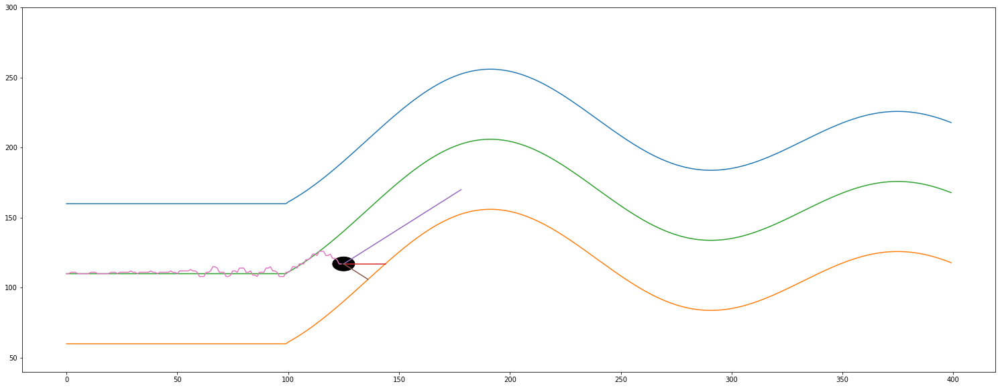

------------------------------ IF i % 3 == 2 ------------------------------
# i =  125
# 3. véletlenszerűen változtatok az autó pozicióján -> ebből állnak elő a before after adatok
artificial move -> down second
Sensor center =  19
Sensor from right wall =  12
most távolsagra van a felső faltól =  74.30271133689249
most távolsagra van az alsó faltól =  25.697288663107514
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
self.x                       =  125
cccccccccccccccccccccccccccccccccccccccccccccccccccccccccccc
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
self.vertical_distance_from_middle =  -24.302711336892486
KKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKKK
ezt fogjuk becsülni, ez a felsőtől és alsótól vett távolságának a hányadosa =  -24.302711336892486
			 ---------------- Teszt ----------------
			 len(self.y_distance)    =  126
			 len(self.sensor_left)   =  126
			 len(self.sensor_center) =  126
			 len(self.sensor_right)  =  126
			 s

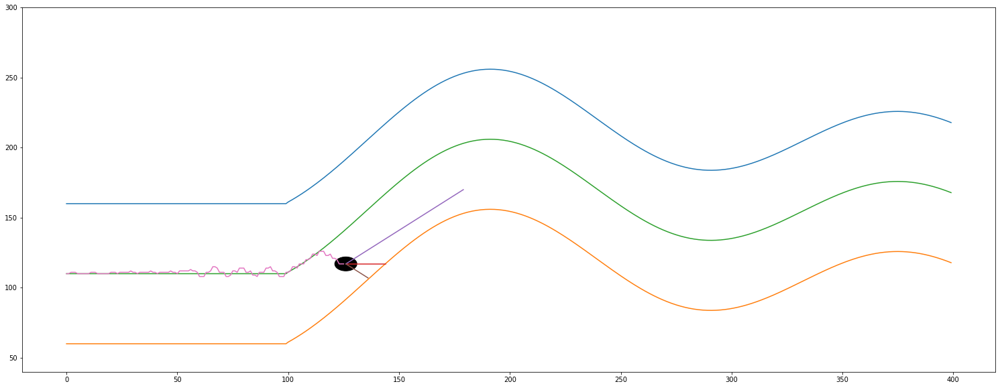

------------------------------ IF i % 3 == 0 ------------------------------
# i =  126
# 1. számú tanulás. Mi a kapcsolat a szenzoros adatok és aközött, hogy az út melyik részén van az autó (micadoban ez az NN)
X.shape =  (127, 3)
y.shape =  (127, 1)
i       =  126
------------------------------ IF len(self.before) > 9 ------------------------------


# i =  126
  Ha már van elég before after adatunk
# 3. Tanulás itt kerül kiszámításra a lineáris regresszió minden egyes metrikára
--------------------------------------
[ 1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.
  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1. -1.  1.  1. -1.
 -1.  1.]
(56, 4)
(56, 4)
[array([110.,  51., 138.,  51.]), array([111.,  50., 136.,  52.]), array([110.,  51., 132.,  51.]), array([109.,  52., 131.,  50.]), array([110.,  51., 129.,  51.]), array([111.,  50., 127.,  52.]), array([110.,  51., 123.,  51.]),

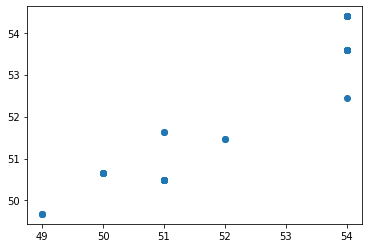

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_center.coef_ =  [[0.99901858 0.76820765]]


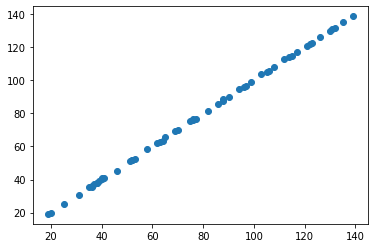

		 ------------------------------- valyon mennyire jó ennek a metrikának a becslése -----------------------------
		 regression_right.coef_ =  [[1.00054191 0.58928571]]


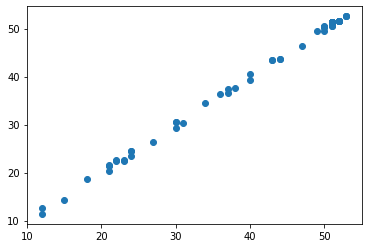

	 # Az egyes lépések várható kimeneteinek kiszámolása ----------------------------------------------
		 # Ennyivel mozdulna el egy szenzor adat 1 egység változással ha 1 lenne a before értéke
proba_X_metrika   =  [[1 1]]
-------- 1 y up ->  left   =  [[1.95787546]]
-------- 1 y up ->  center =  [[1.78982024]]
-------- 1 y up ->  right  =  [[1.55073937]]




		 minden j-re kiszámolom a regressziót és be is helyetessítjük a kapott értékekekt a modellba
		 j =  -3
		 ------------------------ a regresszió bemenetei az éppen aktuális értékek -------------------
		 _X_left   =  [[54 -3]]
		 _X_center =  [[19 -3]]
		 _X_right  =  [[11 -3]]
		 predicted_left   =  [[55.20714917]]
		 predicted_center =  [[16.69932402]]
		 predicted_right  =  [[9.19901557]]
		 --------------------- a regression úgy tűnik, hogy jó és pontos ----------------------
		 regression_left.coef_   =  [[ 0.97391689 -0.40791967]]
		 regression_center.coef_ =  [[0.99901858 0.76820765]]
		 regression_right.coef_  =  [[1.00054

KeyboardInterrupt: ignored

In [7]:
auto.run()

<a name="irodalom"></a>

# Felhasznált irodalom és internetes cimek

Itt gyűjtöttem össze a menet közben összegyűjt okosságokat

[vissza a tartalomhoz](#tartalom)<br>

Scikit-learn - MLPRegressor API
<br>
https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html


Fogalmak és probléma meghatározás
<br>
https://www.rubrik.com/blog/architecture/20/12/customized-autoscaling--minimize-your-cloud-cost


https://github.com/kubernetes/autoscaler/blob/master/cluster-autoscaler/FAQ.md#what-are-the-parameters-to-ca

https://arxiv.org/pdf/1608.04030.pdf

Metrikák amivel a szollgáltatás minőségét mérik különböző esetekben
<br>
https://blog.avinetworks.com/autoscaling-metrics

------------

NumPy API Reference Guide
<br>
https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html


Seaborn API Reference Guide
<br>
https://seaborn.pydata.org/examples/pair_grid_with_kde.html

